# ANÁLISES - MÚLTIPLAS REALIZAÇÕES

#### Objetivo: observar o comportamento da distribuição a posteriori p(**B**|**X**) para diferentes realizações dos sinais das fontes e misturas.

#### Análises:
 - *Curvas de nível:* pontos de máximo de p(**B**|**X**) para várias realizações.
 - *Estimativas MMSE:* distribuições de probabilidade marginais p(*bij*|**X**) para várias realizações.
 - *Erros MMSE:* distribuições do erro de estimação MMSE (eq D.9) para várias realizações.

In [1]:
import os
import pickle
import dill
import pprint
import itertools
import pathos
import pprint
import functools
from functools import partial
from pathlib import Path
import logging
import json

import pandas as pd
import numpy as np
from scipy import stats as st
from sklearn.feature_selection import mutual_info_regression as MI
from statsmodels.stats.multitest import multipletests

import json
import plotly.graph_objects as go
from matplotlib import pyplot as plt
import seaborn as sns
sns.set()

import sys
sys.path.append('/Users/leonardo.tessarolo/git/bayesian_bss/')
from src import SignalGraphPlotter, ExperimentParser, EstimationGraphPlotter, PosteriorUtilities

In [ ]:
# TODO rodar com matriz gabarito sendo a identidade
# TODO rodar com outra prior errada
# TODO colocar gabarito nas figuras com modelo errado

: 

# 1. Read and parse raw results

In [ ]:
# Experiment name
EXPERIMENT_NAME = 'CBA_SBRT_complete_analysis'

# Whether or not to save graphs
SAVE_GRAPHS=True

# Whether or not to create folder structure for saving results
CREATE_FOLDER_STRUCTURE = True

# Folder which will contain output directory tree
OUTPUT_DIR='./output'
base_output_path=Path(OUTPUT_DIR)

# Directory which holds experiments
experiment_dir = base_output_path / EXPERIMENT_NAME

# Instantiate and execute parser object
parser = ExperimentParser(experiment_dir)
parser.parse(verbose=True)


['61', '95', '59', '92', '66', '50', '68', '57', '32', '35', '69', '56', '51', '58', '67', '93', '94', '60', '34', '33', '20', '18', '27', '9', '0', '11', '7', '29', '16', '42', '89', '45', '73', '87', '80', '74', '6', '28', '17', '1', '10', '19', '26', '8', '21', '75', '81', '86', '72', '44', '43', '88', '38', '36', '31', '91', '65', '62', '96', '54', '98', '53', '30', '37', '39', '99', '52', '55', '97', '63', '64', '90', '46', '79', '41', '83', '77', '48', '70', '84', '24', '23', '4', '15', '3', '12', '85', '71', '76', '82', '49', '40', '47', '78', '2', '13', '5', '14', '22', '25']


In [ ]:
############################################
# Create folder structure, if so specified #
############################################
if CREATE_FOLDER_STRUCTURE:
    # General directory for analysis
    analysis_dir = experiment_dir / 'analysis_all_realizations'

    # Subdirectories
    posterior_contour_dir = analysis_dir / 'posterior_contour'
    mmse_dir = analysis_dir / 'mmse'
    map_dir = analysis_dir / 'map'

    # Create analysis dir, if it doesn't yet exist
    if not analysis_dir.is_dir():
        analysis_dir.mkdir()

    # Create posterior contour dir, if it doesn't yet exist
    if not posterior_contour_dir.is_dir():
        posterior_contour_dir.mkdir()

    # Create mmse dir, if it doesn't yet exist
    if not mmse_dir.is_dir():
        mmse_dir.mkdir()

    # Create map dir, if it doesn't yet exist
    if not map_dir.is_dir():
        map_dir.mkdir()

# 2. Análises conjuntas

In [ ]:
def _plot_test_cases_mmse_coefficient_estimates(
    parser,
    test_cases=None,
    B_true=None,
    bin_cfg='auto',
    return_stats=True,
    save_dir=None,
    save_name=None,
    label_size=20,
    legend_size=20
):
    
    plt.rc(
        'legend',
        fontsize=legend_size,
        title_fontsize=legend_size
    )

    # Filter out desired test cases, if so specified
    parsed_results = parser.parsed_results
    
    if test_cases is not None:
        parsed_results = {
            k: v for k, v in parser.parsed_results.items() if k in test_cases
        }

    # Create dataframe for plotting
    plot_df = pd.DataFrame()
    for test_case, test_case_results in parsed_results.items():

        # Append dataframe
        plot_df = pd.concat(
            [
                plot_df,
                pd.DataFrame(
                    data={
                        'test_case': [test_case]*len(test_case_results['mmse']['estimates']),
                        'b11': test_case_results['mmse']['b11_estimates'],
                        'b12': test_case_results['mmse']['b12_estimates'],
                        'b21': test_case_results['mmse']['b21_estimates'],
                        'b22': test_case_results['mmse']['b22_estimates'],
                    }
                )
            ],
            axis=0
        ).reset_index(
            drop=True
        )

    # Create plot
    fig, axs = plt.subplots(
        nrows=2, ncols=2,
        figsize=(20,15)
    )

    # Plot B_true, if so specified
    if B_true is not None:
        for i,j in np.ndindex(B_true.shape):
            plot_df['b{}{}'.format(i+1, j+1)] = plot_df['b{}{}'.format(i+1, j+1)] - B_true[i,j]



    # B11
    sns.histplot(
        data=plot_df.rename(columns={'test_case': 'Caso de Teste'}),
        x='b11',
        hue='Caso de Teste',
        hue_order=test_cases,
        alpha=1,
        bins=bin_cfg,
        ax=axs[0,0]
    )
    axs[0,0].set_ylabel('Contagem de Realizações',fontsize=label_size)
    axs[0,0].set_xlabel(r'$\widehat{b}_{11}^{MMSE}$',fontsize=label_size)
    axs[0,0].tick_params(
        axis='both',
        labelsize=label_size
    )

    # B12
    sns.histplot(
        data=plot_df.rename(columns={'test_case': 'Caso de Teste'}),
        x='b12',
        hue='Caso de Teste',
        hue_order=test_cases,
        alpha=1,
        bins=bin_cfg,
        ax=axs[0,1]
    )
    axs[0,1].set_ylabel('Contagem de Realizações',fontsize=label_size)
    axs[0,1].set_xlabel(r'$\widehat{b}_{12}^{MMSE}$',fontsize=label_size)
    axs[0,1].tick_params(
        axis='both',
        labelsize=label_size
    )

    # B21
    sns.histplot(
        data=plot_df.rename(columns={'test_case': 'Caso de Teste'}),
        x='b21',
        hue='Caso de Teste',
        hue_order=test_cases,
        alpha=1,
        bins=bin_cfg,
        ax=axs[1,0]
    )
    axs[1,0].set_ylabel('Contagem de Realizações',fontsize=label_size)
    axs[1,0].set_xlabel(r'$\widehat{b}_{21}^{MMSE}$',fontsize=label_size)
    axs[1,0].tick_params(
        axis='both',
        labelsize=label_size
    )

    # B22
    sns.histplot(
        data=plot_df.rename(columns={'test_case': 'Caso de Teste'}),
        x='b22',
        hue='Caso de Teste',
        hue_order=test_cases,
        alpha=1,
        bins=bin_cfg,
        ax=axs[1,1]
    )
    axs[1,1].set_ylabel('Contagem de Realizações',fontsize=label_size)
    axs[1,1].set_xlabel(r'$\widehat{b}_{22}^{MMSE}$',fontsize=label_size)
    axs[1,1].tick_params(
        axis='both',
        labelsize=label_size
    )
    # axs[1,1].legend(
    #     fontsize=legend_size
    # )

    # Save figure, if so specified
    if save_dir is not None:
        fig.savefig(
            str(
                (save_dir / '{}.png'.format(save_name if save_name is not None else 'mmse_coeffs'))
            ),
            bbox_inches='tight'
        )

    # Calculate statistics, if so specified
    if return_stats:
        stats_df = plot_df.groupby(
            by='test_case',
            as_index=False
        ).agg(
            b11_mean=('b11', 'mean'),
            b12_mean=('b12', 'mean'),
            b21_mean=('b21', 'mean'),
            b22_mean=('b22', 'mean'),
            b11_std=('b11', 'std'),
            b12_std=('b12', 'std'),
            b21_std=('b21', 'std'),
            b22_std=('b22', 'std')
        )
        return stats_df

In [ ]:
def plot_coefficient_estimates_grid(
    parser,
    estimate_type,
    test_cases=None,
    B_true=None,
    bin_cfg='auto',
    return_stats=True,
    xranges = None,
    yranges = None,
    save_dir=None,
    save_name=None,
    label_size=20,
    legend_size=20,
    vlinewidth=2,
    vlinecolor='green',
    bin_width=0.01
):
    
    plt.rc(
        'legend',
        fontsize=legend_size,
        title_fontsize=legend_size
    )

    plt.rc('axes', labelsize=label_size)
    plt.rc('xtick', labelsize=label_size)
    plt.rc('ytick', labelsize=label_size)

    # Filter out desired test cases, if so specified
    parsed_results = parser.parsed_results
    
    if test_cases is not None:
        parsed_results = {
            k: v for k, v in parser.parsed_results.items() if k in test_cases
        }

    # Create dataframe for plotting
    plot_df = pd.DataFrame()
    for test_case, test_case_results in parsed_results.items():

        # Append dataframe
        plot_df = pd.concat(
            [
                plot_df,
                pd.DataFrame(
                    data={
                        'test_case': [test_case]*len(test_case_results[estimate_type]['estimates']),
                        'b11': test_case_results[estimate_type]['b11_estimates'],
                        'b12': test_case_results[estimate_type]['b12_estimates'],
                        'b21': test_case_results[estimate_type]['b21_estimates'],
                        'b22': test_case_results[estimate_type]['b22_estimates'],
                    }
                )
            ],
            axis=0
        ).reset_index(
            drop=True
        )

    # Plot B_true, if so specified
    if B_true is not None:
        for i,j in np.ndindex(B_true.shape):
            plot_df['b{}{}'.format(i+1, j+1)] = plot_df['b{}{}'.format(i+1, j+1)] - B_true[i,j]

    # Calculate stats_df
    stats_df = plot_df.groupby(
        by='test_case',
        as_index=False
    ).agg(
        b11_mean=('b11', 'mean'),
        b12_mean=('b12', 'mean'),
        b21_mean=('b21', 'mean'),
        b22_mean=('b22', 'mean'),
        b11_std=('b11', 'std'),
        b12_std=('b12', 'std'),
        b21_std=('b21', 'std'),
        b22_std=('b22', 'std')
    )

    # Create plot
    fig, axs = plt.subplots(
        nrows=len(test_cases), ncols=4,
        figsize=(20,3*len(test_cases))
    )

    for i, t in enumerate(test_cases):
        # Get test case estimates
        test_case_df = plot_df[
            plot_df.test_case==t
        ]

        # Get means
        means_df = test_case_df[
            test_case_df.test_case==t
        ].groupby(
            by='test_case',
            as_index=False
        ).agg(
            b11_mean=('b11', 'mean'),
            b12_mean=('b12', 'mean'),
            b21_mean=('b21', 'mean'),
            b22_mean=('b22', 'mean')
        ).reset_index(
            drop=True
        )

        # Plot b11
        if xranges is not None:
            b11_bins=np.linspace(
                xranges['b11'][0],
                xranges['b11'][1],
                int((xranges['b11'][1]-xranges['b11'][0])/bin_width)
            )
        else:
            b11_bins='auto'
        axs[i,0].hist(
            test_case_df['b11'],
            bins=b11_bins
        )
        axs[i,0].axvline(
            means_df.at[0,'b11_mean'],
            linestyle='--',
            color=vlinecolor,
            linewidth=vlinewidth
        )
        axs[i,0].set_ylabel('Caso de Teste {}'.format(t))
        if xranges is not None:
            axs[i,0].set_xlim(
                xranges['b11'][0],
                xranges['b11'][-1],
            )
        if yranges is not None:
            axs[i,0].set_ylim(
                yranges['b11'][0],
                yranges['b11'][-1],
            )

        # Plot b12
        if xranges is not None:
            b12_bins=np.linspace(
                xranges['b12'][0],
                xranges['b12'][1],
                int((xranges['b12'][1]-xranges['b12'][0])/bin_width)
            )
        else:
            b12_bins='auto'
        axs[i,1].hist(
            test_case_df['b12'],
            bins=b12_bins    
        )
        axs[i,1].axvline(
            means_df.at[0,'b12_mean'],
            linestyle='--',
            color=vlinecolor,
            linewidth=vlinewidth
        )
        if xranges is not None:
            axs[i,1].set_xlim(
                xranges['b12'][0],
                xranges['b12'][-1]
            )
        if yranges is not None:
            axs[i,1].set_ylim(
                yranges['b12'][0],
                yranges['b12'][-1],
            )

        # Plot b21
        if xranges is not None:
            b21_bins=np.linspace(
                xranges['b21'][0],
                xranges['b21'][1],
                int((xranges['b21'][1]-xranges['b21'][0])/bin_width)
            )
        else:
            b21_bins='auto'
        axs[i,2].hist(
            test_case_df['b21'],
            bins=b21_bins
        )
        axs[i,2].axvline(
            means_df.at[0,'b21_mean'],
            linestyle='--',
            color=vlinecolor,
            linewidth=vlinewidth
        )
        if xranges is not None:
            axs[i,2].set_xlim(
                xranges['b21'][0],
                xranges['b21'][-1]
            )
        if yranges is not None:
            axs[i,2].set_ylim(
                yranges['b21'][0],
                yranges['b21'][-1],
            )

        # Plot b22
        if xranges is not None:
            b22_bins=np.linspace(
                xranges['b22'][0],
                xranges['b22'][1],
                int((xranges['b22'][1]-xranges['b22'][0])/bin_width)
            )
        else:
            b22_bins='auto'
        axs[i,3].hist(
            test_case_df['b22'],
            bins=b22_bins
        )
        axs[i,3].axvline(
            means_df.at[0,'b22_mean'],
            linestyle='--',
            color=vlinecolor,
            linewidth=vlinewidth
        )
        if xranges is not None:
            axs[i,3].set_xlim(
                xranges['b22'][0],
                xranges['b22'][-1]
            )
        if yranges is not None:
            axs[i,3].set_ylim(
                yranges['b22'][0],
                yranges['b22'][-1],
            )
        

        if i==len(test_cases)-1:
            axs[i,0].set_xlabel(r'$\widehat{b}_{11}-\overline{b}_{11}$')
            axs[i,1].set_xlabel(r'$\widehat{b}_{12}-\overline{b}_{12}$')
            axs[i,2].set_xlabel(r'$\widehat{b}_{21}-\overline{b}_{21}$')
            axs[i,3].set_xlabel(r'$\widehat{b}_{22}-\overline{b}_{22}$')


    # Save figure, if so specified
    if save_dir is not None:
        fig.savefig(
            str(
                (save_dir / '{}.png'.format(save_name if save_name is not None else 'coeffs_estimates'))
            ),
            bbox_inches='tight'
        )

    # Calculate statistics, if so specified
    if return_stats:
        return stats_df




    

In [ ]:
def plot_coefficient_estimates_boxplot(
    parser,
    estimate_type,
    test_cases=None,
    B_true=None,
    return_stats=True,
    xranges = None,
    whis_lims=(5,95),
    box_color='gray',
    box_linecolor='black',
    box_linewidth=.5,
    save_dir=None,
    save_name=None,
    label_size=20,
    legend_size=20,
):
        
    plt.rc(
        'legend',
        fontsize=legend_size,
        title_fontsize=legend_size
    )

    plt.rc('axes', labelsize=label_size)
    plt.rc('xtick', labelsize=label_size)
    plt.rc('ytick', labelsize=label_size)

    # Filter out desired test cases, if so specified
    parsed_results = parser.parsed_results
    
    if test_cases is not None:
        parsed_results = {
            k: v for k, v in parser.parsed_results.items() if k in test_cases
        }

    # Create dataframe for plotting
    plot_df = pd.DataFrame()
    for test_case, test_case_results in parsed_results.items():

        # Append dataframe
        plot_df = pd.concat(
            [
                plot_df,
                pd.DataFrame(
                    data={
                        'test_case': [test_case]*len(test_case_results[estimate_type]['estimates']),
                        'b11': test_case_results[estimate_type]['b11_estimates'],
                        'b12': test_case_results[estimate_type]['b12_estimates'],
                        'b21': test_case_results[estimate_type]['b21_estimates'],
                        'b22': test_case_results[estimate_type]['b22_estimates'],
                    }
                )
            ],
            axis=0
        ).reset_index(
            drop=True
        )

    # Plot B_true, if so specified
    if B_true is not None:
        for i,j in np.ndindex(B_true.shape):
            plot_df['b{}{}'.format(i+1, j+1)] = plot_df['b{}{}'.format(i+1, j+1)] - B_true[i,j]

    # Calculate stats_df
    stats_df = plot_df.groupby(
        by='test_case',
        as_index=False
    ).agg(
        b11_mean=('b11', 'mean'),
        b12_mean=('b12', 'mean'),
        b21_mean=('b21', 'mean'),
        b22_mean=('b22', 'mean'),
        b11_std=('b11', 'std'),
        b12_std=('b12', 'std'),
        b21_std=('b21', 'std'),
        b22_std=('b22', 'std')
    )

    # Create plot
    fig, axs = plt.subplots(
        nrows=2, ncols=2,
        figsize=(20,12)
    )

    # Create plots in axes
    for i,j in np.ndindex((2,2)):
        # Get coefficient
        coeff = 'b{}{}'.format(i+1,j+1)
        coeff_pos = coeff[1:]

        sns.boxplot(
            data=plot_df,
            x=coeff,
            y='test_case',
            color=box_color,
            linecolor=box_linecolor,
            linewidth=box_linewidth,
            whis=whis_lims,
            width=.7,
            showfliers=False,
            ax=axs[i,j]
        )
        axs[i,j].set_xlabel(
            r'$\widehat{{b}}_{}^{}-\overline{{b}}_{}$'.format(
                '{' + coeff_pos + '}',
                '{' + estimate_type.upper() + '}',
                '{' + coeff_pos + '}',
            )
        )
        axs[i,j].set_ylabel(
            'Caso de Teste'
        )
        if xranges is not None:
            axs[i,j].set_xlim(
                xranges[coeff][0],
                xranges[coeff][-1],
            )
    
    # Save figure, if so specified
    if save_dir is not None:
        fig.savefig(
            str(
                (save_dir / '{}.png'.format(save_name if save_name is not None else 'coeffs_estimates_boxplots'))
            ),
            bbox_inches='tight'
        )
        
    # Calculate statistics, if so specified
    if return_stats:
        return stats_df





In [ ]:
def plot_coefficient_estimates_boxplot_map_mmse(
    parser,
    test_cases=None,
    B_true=None,
    return_stats=True,
    yranges = None,
    whis_lims=(5,95),
    box_color='gray',
    box_linecolor='black',
    box_linewidth=.5,
    save_dir=None,
    save_name=None,
    label_size=20,
    legend_size=20,
):
        
    plt.rc(
        'legend',
        fontsize=legend_size,
        title_fontsize=legend_size
    )

    plt.rcParams['axes.facecolor'] = 'white'
    plt.rcParams['savefig.facecolor'] = 'white'

    plt.rc('axes', labelsize=label_size)
    plt.rc('xtick', labelsize=label_size)
    plt.rc('ytick', labelsize=label_size)

    # Filter out desired test cases, if so specified
    parsed_results = parser.parsed_results
    
    if test_cases is not None:
        parsed_results = {
            k: v for k, v in parser.parsed_results.items() if k in test_cases
        }

    # Create dataframe for plotting
    plot_df = pd.DataFrame()
    for estimate_type in ['map', 'mmse']:
        for test_case, test_case_results in parsed_results.items():

            # Create estimate dataframe
            plot_df = pd.concat(
                [
                    plot_df,
                    pd.DataFrame(
                        data={
                            'estimate_type': [estimate_type]*len(test_case_results[estimate_type]['estimates']),
                            'test_case': [test_case]*len(test_case_results[estimate_type]['estimates']),
                            'b11': test_case_results[estimate_type]['b11_estimates'],
                            'b12': test_case_results[estimate_type]['b12_estimates'],
                            'b21': test_case_results[estimate_type]['b21_estimates'],
                            'b22': test_case_results[estimate_type]['b22_estimates']
                        }
                    )
                ],
                axis=0
            ).reset_index(
                drop=True
            )



    # Plot B_true, if so specified
    if B_true is not None:
        for i,j in np.ndindex(B_true.shape):
            plot_df['b{}{}'.format(i+1, j+1)] = (plot_df['b{}{}'.format(i+1, j+1)] - B_true[i,j])/np.abs(B_true[i,j])

    # Calculate stats_df
    stats_df = plot_df.groupby(
        by=['estimate_type','test_case'],
        as_index=False
    ).agg(
        b11_mean=('b11', 'mean'),
        b12_mean=('b12', 'mean'),
        b21_mean=('b21', 'mean'),
        b22_mean=('b22', 'mean'),
        b11_std=('b11', 'std'),
        b12_std=('b12', 'std'),
        b21_std=('b21', 'std'),
        b22_std=('b22', 'std')
    )

    # Create plot
    fig, axs = plt.subplots(
        nrows=2, ncols=2,
        figsize=(20,12)
    )

    # Create plots in axes
    for i,j in np.ndindex((2,2)):
        # Get coefficient
        coeff = 'b{}{}'.format(i+1,j+1)
        coeff_pos = coeff[1:]

        # Plot horizontal line at 0
        axs[i,j].axhline(
            0,
            color='lightgray',
            linestyle='--'
        )

        sns.boxplot(
            data=plot_df.rename(
                columns={'estimate_type': 'Tipo de Estimativa'}
            ),
            x='test_case',
            y=coeff,
            hue='Tipo de Estimativa',
            # color=box_color,
            # linecolor=box_linecolor,
            # linewidth=box_linewidth,
            whis=whis_lims,
            width=.7,
            showfliers=False,
            ax=axs[i,j]
        )
        axs[i,j].set_ylabel(
            # r'$\widehat{{b}}_{}-\overline{{b}}_{}$/\overline{{b}}_{}'.format(
            #     '{' + coeff_pos + '}',
            #     '{' + coeff_pos + '}',
            #     '{' + coeff_pos + '}'
            # )
            r'$\delta_{{b}}(\widehat{{b}}_{})$'.format(
                '{' + coeff_pos + '}',
                # '{' + coeff_pos + '}',
                # '{' + coeff_pos + '}'
            )
        )
        for spine in ['bottom', 'top', 'left', 'right']:
            axs[i,j].spines[spine].set_color('black')
        
        axs[i,j].set_xlabel(
            'Caso de Teste'
        )
        # axs[i,j].grid(
        #     visible=True,
        #     axis='y',
        #     **{
        #         'color': 'black',
        #         'linestyle': '--'
        #     }
        # )
        if yranges is not None:
            axs[i,j].set_ylim(
                yranges[coeff][0],
                yranges[coeff][-1],
            )
        
        # Plot vertical lines
        [
            axs[i,j].axvline(
                x+.5,
                color='lightgray',
                linestyle='--'
            ) for x in axs[i,j].get_xticks()
        ]

        # Figure legend
        if coeff_pos=='11':
            handles, labels = axs[i,j].get_legend_handles_labels()
            # Create a figure-level legend
            fig.legend(
                handles,
                labels,
                loc='upper center',
                ncol=3,
                bbox_to_anchor=(0.5, 0.925)
            )

        # Remove axes legend
        axs[i,j].get_legend().set_visible(False)

        
    
    # Save figure, if so specified
    if save_dir is not None:
        fig.savefig(
            str(
                (save_dir / '{}.png'.format(save_name if save_name is not None else 'coeffs_estimates_boxplots'))
            ),
            bbox_inches='tight'
        )
        
    # Calculate statistics, if so specified
    if return_stats:
        return stats_df


In [ ]:
def plot_test_cases_contours(
    parser,
    test_cases=None,
    u_range=(-0.3, 0.3),
    v_range=(-0.3, 0.3),
    equal_aspect=False,
    marker_size=40,
    return_stats=True,
    fig_title=None,
    save_dir=None,
    save_name=None,
    label_size=20,
    legend_size=20,
    title_size=30,
    transparency=0.2,
    legend_location=None
):
        
        plt.rcParams['axes.facecolor'] = 'white'
        plt.rcParams['savefig.facecolor'] = 'white'
        plt.rcParams['axes.grid'] = True
        plt.rcParams['grid.color'] = 'lightgray'
        plt.rcParams['grid.linestyle'] = '--'
        plt.rcParams['grid.linewidth'] = 0.5


        # Filter out desired test cases, if so specified
        parsed_results = parser.parsed_results
        
        if test_cases is not None:
            parsed_results = {
                k: v for k, v in parser.parsed_results.items() if k in test_cases
            }

        # Create dataframe for plotting
        plot_df = pd.DataFrame()
        for test_case, test_case_results in parsed_results.items():
            # Retrieve u coordinate for maximums
            u_vec = [
                u for u,v in test_case_results['posteriori_grid']['maximums']
            ]

            # Retrieve v coordinate for maximums
            v_vec = [
                v for u,v in test_case_results['posteriori_grid']['maximums']
            ]

            # Append dataframe
            plot_df = pd.concat(
                [
                    plot_df,
                    pd.DataFrame(
                        data={
                            'test_case': [test_case]*len(test_case_results['posteriori_grid']['maximums']),
                            'u': u_vec,
                            'v': v_vec
                        }
                    )
                ],
                axis=0
            ).reset_index(
                drop=True
            )

        # Get stats
        stats_df = plot_df.groupby(
            by='test_case',
            as_index=False
        ).agg(
            u_mean=('u', 'mean'),
            v_mean=('v', 'mean'),
            u_std=('u', 'std'),
            v_std=('v', 'std')
        )


        # Create plot
        fig, ax = plt.subplots(
            nrows=1, ncols=1,
            figsize=(20,7)
        )
        if equal_aspect:
            ax.set_aspect('equal')

        sns.scatterplot(
            data=plot_df.rename(
                columns={
                    'test_case': 'Caso de Teste'
                }
            ),
            x='u',
            y='v',
            hue='Caso de Teste',
            style='Caso de Teste',
            alpha=transparency,
            markers = ['s', '>', '<','o'],
            legend=False,
            **{
                's': marker_size
            }
        )
        sns.scatterplot(
            data=stats_df.rename(
                columns={
                    'test_case': 'Caso de Teste',
                    'u_mean': 'u',
                    'v_mean':'v'
                }
            ),
            x='u',
            y='v',
            hue='Caso de Teste',
            style='Caso de Teste',
            markers = ['s', '>', '<','o'],
            **{
                's': 3*marker_size
            }
        )

        for spine in ['bottom', 'top', 'left', 'right']:
            ax.spines[spine].set_color('black')

        if legend_location is not None:
            sns.move_legend(ax, legend_location)
        
        plt.xlim(u_range)
        plt.ylim(v_range)
        plt.ylabel('v',fontsize=label_size)
        plt.xlabel('u', fontsize=label_size)
        plt.xticks(fontsize=label_size)
        plt.yticks(fontsize=label_size)
        # if fig_title is not None:
        #      plt.title(
        #           fig_title,
        #           fontsize=title_size
        #      )
        # plt.legend(
        #     title='Caso de Teste',
        #     fontsize=legend_size
        # )
        plt.setp(
            ax.get_legend().get_texts(),
            fontsize=legend_size
        )
        plt.setp(
            ax.get_legend().get_title(),
            fontsize=legend_size
        )
        

        # Save figure, if so specified
        if save_dir is not None:
            fig.savefig(
                str(
                    (save_dir / '{}.png'.format(save_name if save_name is not None else 'contours'))
                ),
                bbox_inches='tight'
            )

        # Calculate statistics, if so specified
        if return_stats:
            return stats_df

In [ ]:
def plot_posteriori_grid_source_recovery_errors(
    parser,
    test_cases=None,
    B_true=None,
    return_stats=True,
    yranges = None,
    whis_lims=(5,95),
    box_color='gray',
    box_linecolor='black',
    box_linewidth=.5,
    save_dir=None,
    save_name=None,
    label_size=20,
    legend_size=20,
):
        
    plt.rc(
        'legend',
        fontsize=legend_size,
        title_fontsize=legend_size
    )

    plt.rcParams['axes.facecolor'] = 'white'
    plt.rcParams['savefig.facecolor'] = 'white'

    plt.rc('axes', labelsize=label_size)
    plt.rc('xtick', labelsize=label_size)
    plt.rc('ytick', labelsize=label_size)

    # Filter out desired test cases, if so specified
    parsed_results = parser.parsed_results
    
    if test_cases is not None:
        parsed_results = {
            k: v for k, v in parser.parsed_results.items() if k in test_cases
        }

    # Create dataframe for plotting
    plot_df = pd.DataFrame()
    estimate_type = 'posteriori_grid'
    for test_case, test_case_results in parsed_results.items():

        # Create estimate dataframe
        plot_df = pd.concat(
            [
                plot_df,
                pd.DataFrame(
                    data={
                        'estimate_type': [estimate_type]*len(test_case_results[estimate_type]['object']),
                        'test_case': [test_case]*len(test_case_results[estimate_type]['object']),
                        's_errors': test_case_results[estimate_type]['s_errors']
                    }
                )
            ],
            axis=0
        ).reset_index(
            drop=True
        )


    # Calculate stats_df
    stats_df = plot_df.groupby(
        by=['estimate_type','test_case'],
        as_index=False
    ).agg(
        s_errors_mean=('s_errors', 'mean'),
        s_errors_std=('s_errors', 'std')
    )

    # Create plot
    fig, ax = plt.subplots(
        nrows=1, ncols=1,
        figsize=(20,5)
    )

    

    # Plot horizontal line at 0
    ax.axhline(
        0,
        color='lightgray',
        linestyle='--'
    )

    sns.boxplot(
        data=plot_df.rename(
            columns={'estimate_type': 'Tipo de Estimativa'}
        ),
        x='test_case',
        y='s_errors',
        color=box_color,
        # linecolor=box_linecolor,
        # linewidth=box_linewidth,
        whis=whis_lims,
        width=.7,
        showfliers=False,
        ax=ax
    )
    ax.set_ylabel(
        # r'$\widehat{{b}}_{}-\overline{{b}}_{}$/\overline{{b}}_{}'.format(
        #     '{' + coeff_pos + '}',
        #     '{' + coeff_pos + '}',
        #     '{' + coeff_pos + '}'
        # )
        r'$\delta_{\bf{S}}(\widehat{\bf{S}})$'
    )
    for spine in ['bottom', 'top', 'left', 'right']:
        ax.spines[spine].set_color('black')
    
    ax.set_xlabel(
        'Caso de Teste'
    )
    
    
    # Plot vertical lines
    [
        ax.axvline(
            x+.5,
            color='lightgray',
            linestyle='--'
        ) for x in ax.get_xticks()
    ]

        
    
    # Save figure, if so specified
    if save_dir is not None:
        fig.savefig(
            str(
                (save_dir / '{}.png'.format(save_name if save_name is not None else 'delta_S_errors_boxplots'))
            ),
            bbox_inches='tight'
        )
        
    # Calculate statistics, if so specified
    if return_stats:
        return stats_df


## 2.0. Análise u,v

,test_case,u_mean,v_mean,u_std,v_std
0,i,-0.00248,0.00170,0.018280,0.024797
1,ii,-0.00248,0.00170,0.018280,0.024797
2,iii,-0.00214,0.00126,0.016251,0.021033
3,iv,0.05684,-0.11456,0.014220,0.020687


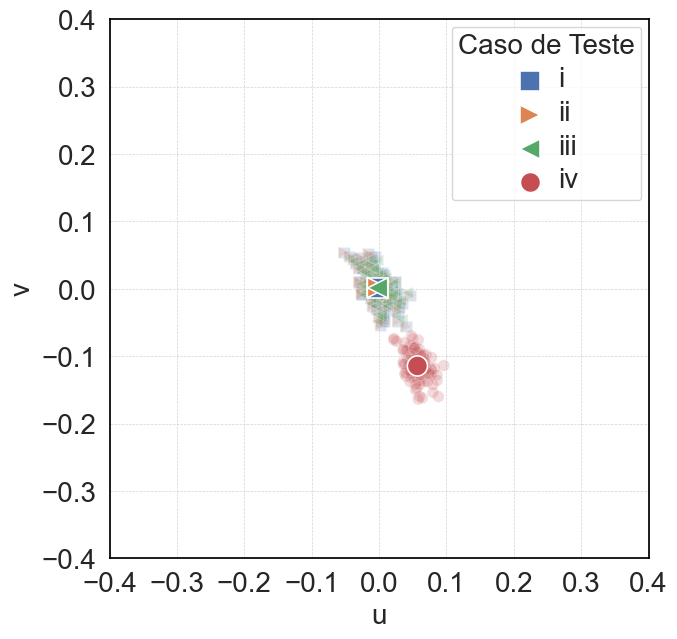

In [ ]:
##########################################################
# ESPECIFICAÇÃO PERFEITA: CASOS DE TESTE i, ii, iii e iv #
##########################################################

plot_test_cases_contours(
    parser=parser,
    test_cases=['i','ii','iii','iv'],
    equal_aspect=True,
    u_range=(-0.4, 0.4),
    v_range=(-0.4, 0.4),
    fig_title=r'(a) $r_{s}=r_{s}^{P}$',
    marker_size=70,
    save_dir=posterior_contour_dir,
    save_name='maximos_curvas_nivel_i_iv'
)

,test_case,u_mean,v_mean,u_std,v_std
0,v,0.04152,-0.13310,0.017257,0.024724
1,vi,0.04152,-0.13310,0.017257,0.024724
2,vii,0.03166,-0.11332,0.015738,0.020969
3,viii,0.08916,-0.23340,0.014074,0.022139


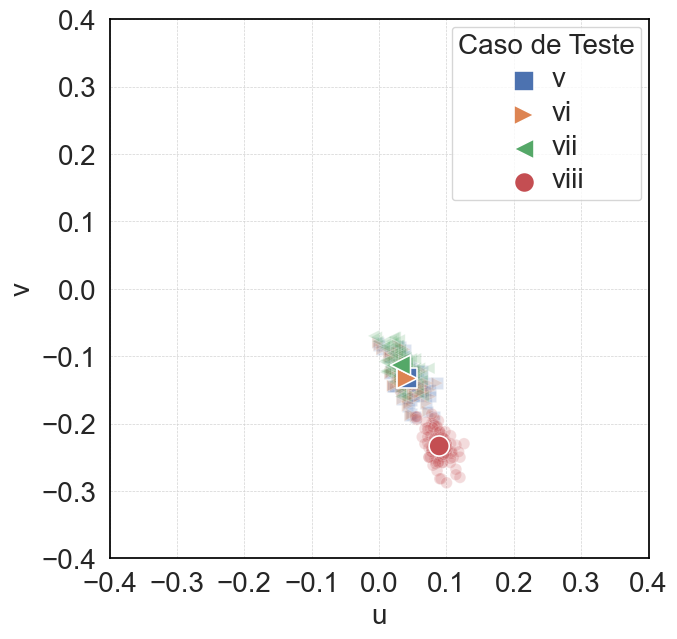

In [ ]:
#################################################################
# ESPECIFICAÇÃO MUITO INCORRETA: CASOS DE TESTE ix, x, xi e xii #
#################################################################

plot_test_cases_contours(
    parser=parser,
    test_cases=['v','vi','vii','viii'],
    equal_aspect=True,
    marker_size=70,
    u_range=(-0.4, 0.4),
    v_range=(-0.4, 0.4),
    fig_title=r'(b) $r_{s}=r_{s}^{LI}$',
    save_dir=posterior_contour_dir,
    save_name='maximos_curvas_nivel_v_viii'
)

,test_case,u_mean,v_mean,u_std,v_std
0,ix,-0.45972,1.36758,0.037172,0.033835
1,x,-0.45966,1.36752,0.037139,0.033851
2,xi,-0.20888,0.97062,0.019133,0.017178
3,xii,-0.10046,0.78300,0.016100,0.015294


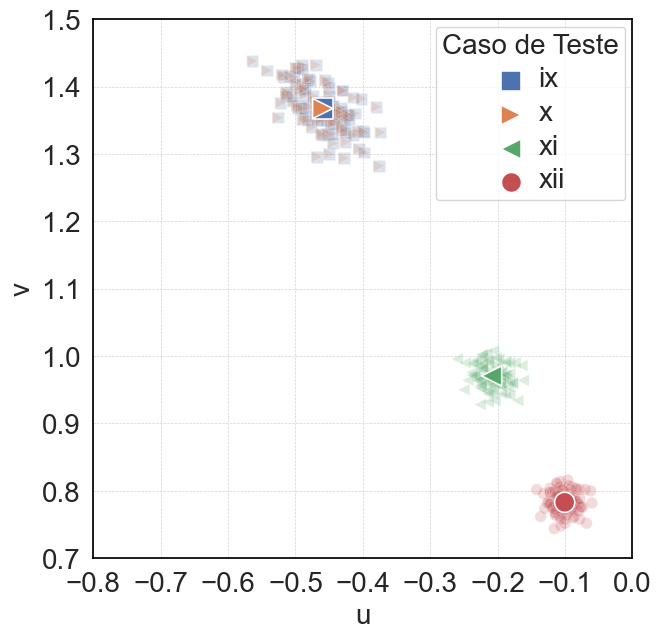

In [ ]:
#################################################################
# ESPECIFICAÇÃO MUITO INCORRETA: CASOS DE TESTE ix, x, xi e xii #
#################################################################

plot_test_cases_contours(
    parser=parser,
    test_cases=['ix','x','xi','xii'],
    equal_aspect=True,
    marker_size=70,
    u_range=(-0.8, 0.0),
    v_range=(0.7, 1.5),
    fig_title=r'(c) $r_{s}=r_{s}^{MI}$',
    save_dir=posterior_contour_dir,
    save_name='maximos_curvas_nivel_ix_xii',
    legend_location='upper right'
)

,estimate_type,test_case,s_errors_mean,s_errors_std
0,posteriori_grid,i,0.024348,0.013486
1,posteriori_grid,ii,0.024348,0.013486
2,posteriori_grid,iii,0.021871,0.011842
3,posteriori_grid,iv,0.104590,0.019320
4,posteriori_grid,ix,1.287478,0.029591
5,posteriori_grid,v,0.127693,0.022985
6,posteriori_grid,vi,0.127693,0.022985
7,posteriori_grid,vii,0.110409,0.019927
8,posteriori_grid,viii,0.216940,0.021302
9,posteriori_grid,x,1.287436,0.029614


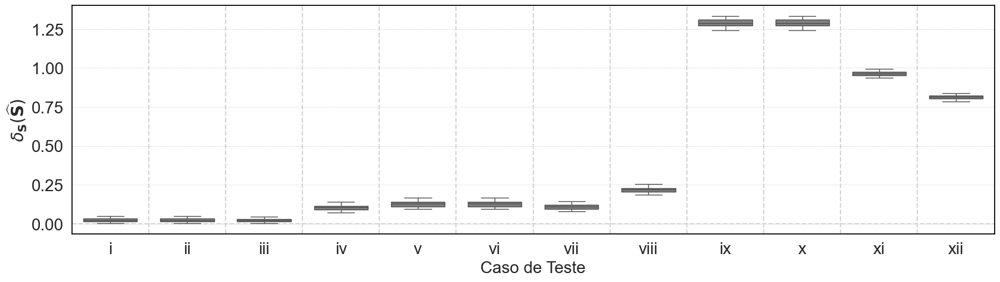

In [ ]:
plot_posteriori_grid_source_recovery_errors(
    parser=parser,
    whis_lims=(5,95),
    box_color='gray',
    box_linecolor='black',
    box_linewidth=.5,
    save_dir=experiment_dir / 'analysis_all_realizations',
    save_name='source_recovery_errors_boxplots',
    label_size=20,
    legend_size=20
)

In [32]:
test_pairs = []

# Add perfect model cases
test_pairs = test_pairs + [
    comb for comb in itertools.combinations(['i','ii','iii','iv'], 2)
]

# Add slightly misspecified model cases
test_pairs = test_pairs + [
    comb for comb in itertools.combinations(['v','vi','vii','viii'], 2)
]

# Add largely misspecified model cases
test_pairs = test_pairs + [
    comb for comb in itertools.combinations(['ix','x','xi','xii'], 2)
]

tests_df = pd.DataFrame()
for case0, case1 in test_pairs:
    # Get u points
    max_us_0 = [
        tup[0] for tup in parser.parsed_results[case0]['posteriori_grid']['maximums']
    ]
    max_us_1 = [
       tup[0] for tup in parser.parsed_results[case1]['posteriori_grid']['maximums']
    ]

    # Test difference in u - ttest
    ttest_us = st.ttest_rel(max_us_0, max_us_1)

    # Test difference in u - z-score
    u_diffs = np.subtract(
        max_us_0,
        max_us_1
    )
    mean_u_diff = np.mean(u_diffs)
    std_u_diff = np.std(u_diffs)
    z_u = mean_u_diff*np.sqrt(len(max_us_0))/(std_u_diff)
    if z_u < 0:
        pvalue_u = st.norm.cdf(z_u) + (1-st.norm.cdf(-z_u))
    else:
        pvalue_u = st.norm.cdf(-z_u) + (1-st.norm.cdf(z_u))

    

    # Test difference in v - ttest
    max_vs_0 = [
        tup[-1] for tup in parser.parsed_results[case0]['posteriori_grid']['maximums']
    ]
    max_vs_1 = [
       tup[-1] for tup in parser.parsed_results[case1]['posteriori_grid']['maximums']
    ]
    ttest_vs = st.ttest_rel(max_vs_0, max_vs_1)

    # Test difference in v - z-score
    v_diffs = np.subtract(
        max_vs_0,
        max_vs_1
    )
    mean_v_diff = np.mean(v_diffs)
    std_v_diff = np.std(v_diffs)
    z_v = mean_v_diff*np.sqrt(len(max_vs_0))/(std_v_diff)
    if z_v < 0:
        pvalue_v = st.norm.cdf(z_v) + (1-st.norm.cdf(-z_v))
    else:
        pvalue_v = st.norm.cdf(-z_v) + (1-st.norm.cdf(z_v))


    # Test difference in delta_S - ttest
    delta_S_0 = parser.parsed_results[case0]['posteriori_grid']['s_errors']
    delta_S_1 = parser.parsed_results[case1]['posteriori_grid']['s_errors']
    ttest_delta_S = st.ttest_rel(delta_S_0, delta_S_1)

    # Log
    tests_df = pd.concat(
        [
            tests_df,
            pd.DataFrame(
                index=[0],
                data={
                    'case_0': [case0],
                    'case_1': [case1],
                    'u_ttest_statistic': [ttest_us.statistic],
                    'u_ttest_pvalue': [ttest_us.pvalue],
                    'u_ttest_holm': [np.nan],
                    'v_ttest_statistic': [ttest_vs.statistic],
                    'v_ttest_pvalue': [ttest_vs.pvalue],
                    'v_ttest_holm': [np.nan],
                    'u_zscore_statistic': [z_u],
                    'u_zscore_pvalue': [pvalue_u],
                    'v_zscore_statistic': [z_v],
                    'v_zscore_pvalue': [pvalue_v],
                    'delta_S_ttest_statistic': [ttest_delta_S.statistic],
                    'delta_S_ttest_pvalue': [ttest_delta_S.pvalue],
                    'delta_S_ttest_holm': [np.nan],
                }
            )
        ],
        axis=0
    ).reset_index(
        drop=True
    )

# Significance level and number of tests
alpha = 0.05
m = tests_df.shape[0]

# Apply Holm method to u
print('#'*200)
print('Correção de holm - coordenada u')
exit_holm=False
for i, row in tests_df.fillna(1.0).sort_values(
    by='u_ttest_pvalue',
    ascending=True
).reset_index(
    drop=True
).iterrows():
    case_0 = row['case_0']
    case_1 = row['case_1']
    if not exit_holm:
        # Get holm comparison
        holm_comparison = row['u_ttest_pvalue'] <= alpha/(m-i)

        print(
            'Caso 0: {}, Caso 1: {}, p-valor: {}, p-valor ajustado: {}, comparativo: {}, holm: {}'.format(
                case_0,
                case_1,
                row['u_ttest_pvalue'],
                row['u_ttest_pvalue']*(m-i),
                alpha/(m-i),
                'Rejeitar hipótese nula' if holm_comparison else 'Não rejeitar hipótese nula'
            )
        )

        # Save to dataframe
        tests_df.loc[
            (tests_df.case_0==case_0)&(tests_df.case_1==case_1),
            'u_ttest_holm'
        ] = holm_comparison

        exit_holm = holm_comparison*False
    
    else:
        # Save to dataframe
        tests_df.loc[
            (tests_df.case_0==case_0)&(tests_df.case_1==case_1),
            'u_ttest_holm'
        ] = holm_comparison
print('#'*200)

# Apply Holm method to v
print('#'*200)
print('Correção de holm - coordenada v')
exit_holm=False
for i, row in tests_df.fillna(1.0).sort_values(
    by='v_ttest_pvalue',
    ascending=True
).reset_index(
    drop=True
).iterrows():
    case_0 = row['case_0']
    case_1 = row['case_1']
    if not exit_holm:
        # Get holm comparison
        holm_comparison = row['v_ttest_pvalue'] <= alpha/(m-i)

        print(
            'Caso 0: {}, Caso 1: {}, p-valor: {}, p-valor ajustado: {}, comparativo: {}, holm: {}'.format(
                case_0,
                case_1,
                row['v_ttest_pvalue'],
                row['v_ttest_pvalue']*(m-i),
                alpha/(m-i),
                'Rejeitar hipótese nula' if holm_comparison else 'Não rejeitar hipótese nula'
            )
        )

        # Save to dataframe
        tests_df.loc[
            (tests_df.case_0==case_0)&(tests_df.case_1==case_1),
            'v_ttest_holm'
        ] = holm_comparison

        exit_holm = holm_comparison*False
    
    else:
        # Save to dataframe
        tests_df.loc[
            (tests_df.case_0==case_0)&(tests_df.case_1==case_1),
            'v_ttest_holm'
        ] = holm_comparison
print('#'*200)

# Apply Holm method to delta_S
print('#'*200)
print('Correção de holm - erro de recuperação delta_S')
exit_holm=False
for i, row in tests_df.fillna(1.0).sort_values(
    by='delta_S_ttest_pvalue',
    ascending=True
).reset_index(
    drop=True
).iterrows():
    case_0 = row['case_0']
    case_1 = row['case_1']
    if not exit_holm:
        # Get holm comparison
        holm_comparison = row['delta_S_ttest_pvalue'] <= alpha/(m-i)

        print(
            'Caso 0: {}, Caso 1: {}, p-valor: {}, p-valor ajustado: {}, comparativo: {}, holm: {}'.format(
                case_0,
                case_1,
                row['delta_S_ttest_pvalue'],
                row['delta_S_ttest_pvalue']*(m-i),
                alpha/(m-i),
                'Rejeitar hipótese nula' if holm_comparison else 'Não rejeitar hipótese nula'
            )
        )

        # Save to dataframe
        tests_df.loc[
            (tests_df.case_0==case_0)&(tests_df.case_1==case_1),
            'delta_S_ttest_holm'
        ] = holm_comparison

        exit_holm = holm_comparison*False
    
    else:
        # Save to dataframe
        tests_df.loc[
            (tests_df.case_0==case_0)&(tests_df.case_1==case_1),
            'delta_S_ttest_holm'
        ] = holm_comparison
print('#'*200)


tests_df
    

########################################################################################################################################################################################################
Correção de holm - coordenada u
Caso 0: xi, Caso 1: xii, p-valor: 1.945966273920462e-152, p-valor ajustado: 3.5027392930568315e-151, comparativo: 0.002777777777777778, holm: Rejeitar hipótese nula
Caso 0: iii, Caso 1: iv, p-valor: 2.7068290046440126e-128, p-valor ajustado: 4.601609307894821e-127, comparativo: 0.0029411764705882353, holm: Rejeitar hipótese nula
Caso 0: vii, Caso 1: viii, p-valor: 7.098433178926587e-127, p-valor ajustado: 1.1357493086282539e-125, comparativo: 0.003125, holm: Rejeitar hipótese nula
Caso 0: x, Caso 1: xii, p-valor: 3.262267579522197e-122, p-valor ajustado: 4.893401369283295e-121, comparativo: 0.0033333333333333335, holm: Rejeitar hipótese nula
Caso 0: ix, Caso 1: xii, p-valor: 3.6803226510361604e-122, p-valor ajustado: 5.152451711450624e-121, comparativo: 0.0

/var/folders/j_/fykf3k5959xcr2qglswycszm0000gn/T/ipykernel_12125/226394069.py:38: RuntimeWarning: invalid value encountered in scalar divide
  z_u = mean_u_diff*np.sqrt(len(max_us_0))/(std_u_diff)
/var/folders/j_/fykf3k5959xcr2qglswycszm0000gn/T/ipykernel_12125/226394069.py:62: RuntimeWarning: invalid value encountered in scalar divide
  z_v = mean_v_diff*np.sqrt(len(max_vs_0))/(std_v_diff)
/var/folders/j_/fykf3k5959xcr2qglswycszm0000gn/T/ipykernel_12125/226394069.py:136: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  tests_df.loc[
/var/folders/j_/fykf3k5959xcr2qglswycszm0000gn/T/ipykernel_12125/226394069.py:155: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future beha

,case_0,case_1,u_ttest_statistic,u_ttest_pvalue,u_ttest_holm,v_ttest_statistic,v_ttest_pvalue,v_ttest_holm,u_zscore_statistic,u_zscore_pvalue,v_zscore_statistic,v_zscore_pvalue,delta_S_ttest_statistic,delta_S_ttest_pvalue,delta_S_ttest_holm
0,i,ii,NaN,NaN,False,NaN,NaN,False,NaN,NaN,NaN,NaN,NaN,NaN,False
1,i,iii,-1.353790,1.788861e-01,False,1.101169,2.734934e-01,False,-1.360610,0.173637,1.106716,0.268417,10.938897,9.905130e-19,True
2,i,iv,-120.838510,2.539891e-109,True,197.537237,2.310927e-130,True,-121.447273,0.000000,198.532393,0.000000,-34.969572,1.602015e-57,True
3,ii,iii,-1.353790,1.788861e-01,False,1.101169,2.734934e-01,False,-1.360610,0.173637,1.106716,0.268417,10.938897,9.905130e-19,True
4,ii,iv,-120.838510,2.539891e-109,True,197.537237,2.310927e-130,True,-121.447273,0.000000,198.532393,0.000000,-34.969572,1.602015e-57,True
5,iii,iv,-188.234043,2.706829e-128,True,344.226932,3.323167e-154,True,-189.182331,0.000000,345.961084,0.000000,-38.168260,5.000570e-61,True
6,v,vi,NaN,NaN,False,NaN,NaN,False,NaN,NaN,NaN,NaN,NaN,NaN,False
7,v,vii,46.662041,3.259366e-69,True,-49.714974,7.921272e-72,True,46.897115,0.000000,-49.965429,0.000000,47.058515,1.461830e-69,True
8,v,viii,-116.656933,8.101099e-108,True,200.924990,4.309972e-131,True,-117.244629,0.000000,201.937213,0.000000,-248.124066,3.806700e-140,True
9,vi,vii,46.662041,3.259366e-69,True,-49.714974,7.921272e-72,True,46.897115,0.000000,-49.965429,0.000000,47.058515,1.461830e-69,True


In [30]:
multipletests(
    pvals=tests_df.fillna(1.0).sort_values(
        by='u_ttest_pvalue',
        ascending=True
    ).reset_index(
        drop=True
    )['u_ttest_pvalue'].values,
    alpha=alpha,
    method='holm',
    is_sorted=True
)

/var/folders/j_/fykf3k5959xcr2qglswycszm0000gn/T/ipykernel_12125/3571031337.py:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  pvals=tests_df.fillna(1.0).sort_values(


(array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True, False, False, False, False, False]),
 array([3.50273929e-151, 4.60160931e-127, 1.13574931e-125, 4.89340137e-121,
        5.15245171e-121, 2.91884504e-112, 3.05170367e-112, 2.79388043e-108,
        2.79388043e-108, 7.29098883e-107, 7.29098883e-107, 2.28155621e-068,
        2.28155621e-068, 4.16243126e-001, 7.15544407e-001, 7.15544407e-001,
        1.00000000e+000, 1.00000000e+000]),
 np.float64(0.002845571131556368),
 0.002777777777777778)

In [33]:
multipletests(
    pvals=tests_df.fillna(1.0).sort_values(
        by='v_ttest_pvalue',
        ascending=True
    ).reset_index(
        drop=True
    )['v_ttest_pvalue'].values,
    alpha=alpha,
    method='holm',
    is_sorted=True
)

/var/folders/j_/fykf3k5959xcr2qglswycszm0000gn/T/ipykernel_12125/1461837620.py:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  pvals=tests_df.fillna(1.0).sort_values(


(array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True, False, False, False, False, False]),
 array([3.04628220e-184, 5.64938392e-153, 2.69356877e-144, 2.69356877e-144,
        2.69356877e-144, 3.43850728e-133, 3.43850728e-133, 4.74096877e-130,
        4.74096877e-130, 2.07983450e-129, 2.07983450e-129, 5.54489020e-071,
        5.54489020e-071, 4.16243126e-001, 1.00000000e+000, 1.00000000e+000,
        1.00000000e+000, 1.00000000e+000]),
 np.float64(0.002845571131556368),
 0.002777777777777778)

In [34]:
multipletests(
    pvals=tests_df.fillna(1.0).sort_values(
        by='delta_S_ttest_pvalue',
        ascending=True
    ).reset_index(
        drop=True
    )['delta_S_ttest_pvalue'].values,
    alpha=alpha,
    method='holm',
    is_sorted=True
)

/var/folders/j_/fykf3k5959xcr2qglswycszm0000gn/T/ipykernel_12125/743399672.py:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  pvals=tests_df.fillna(1.0).sort_values(


(array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True, False, False, False]),
 array([2.30085510e-190, 2.55905502e-151, 2.62223519e-151, 5.97120500e-145,
        7.31178584e-140, 7.42548952e-140, 4.56804016e-139, 4.56804016e-139,
        1.46182965e-068, 1.46182965e-068, 4.00045589e-060, 1.12141034e-056,
        1.12141034e-056, 4.95256519e-018, 4.95256519e-018, 2.49752863e-001,
        1.00000000e+000, 1.00000000e+000]),
 np.float64(0.002845571131556368),
 0.002777777777777778)

In [18]:
test_pairs = []

# Add uniform prior cases
test_pairs = test_pairs + [
    comb for comb in itertools.combinations(['i','v','ix'], 2)
]

# Add low information correct prior cases
test_pairs = test_pairs + [
    comb for comb in itertools.combinations(['ii','vi','x'], 2)
]

# Add high information correct prior cases
test_pairs = test_pairs + [
    comb for comb in itertools.combinations(['iii','vii','xi'], 2)
]

# Add high information incorrect prior cases
test_pairs = test_pairs + [
    comb for comb in itertools.combinations(['iv','viii','xii'], 2)
]

tests_df = pd.DataFrame()
for case0, case1 in test_pairs:
    # Test difference in u - ttest
    max_us_0 = [
        tup[0] for tup in parser.parsed_results[case0]['posteriori_grid']['maximums']
    ]
    max_us_1 = [
       tup[0] for tup in parser.parsed_results[case1]['posteriori_grid']['maximums']
    ]
    res_us = st.ttest_ind(max_us_0, max_us_1)

    # Test difference in u - z-score
    mean_u0 = np.mean(max_us_0)
    std_u0 = np.std(max_us_0)
    mean_u1 = np.mean(max_us_1)
    std_u1 = np.std(max_us_1)
    z_u = (mean_u0-mean_u1)*np.sqrt(len(max_us_0))/(std_u0+std_u1)
    if z_u < 0:
        pvalue_u = st.norm.cdf(z_u) + (1-st.norm.cdf(-z_u))
    else:
        pvalue_u = st.norm.cdf(-z_u) + (1-st.norm.cdf(z_u))

    # Test difference in v - ttest
    max_vs_0 = [
        tup[-1] for tup in parser.parsed_results[case0]['posteriori_grid']['maximums']
    ]
    max_vs_1 = [
       tup[-1] for tup in parser.parsed_results[case1]['posteriori_grid']['maximums']
    ]
    res_vs = st.ttest_ind(max_vs_0, max_vs_1)

    # Test difference in v - z-score
    mean_v0 = np.mean(max_vs_0)
    std_v0 = np.std(max_vs_0)
    mean_v1 = np.mean(max_vs_1)
    std_v1 = np.std(max_vs_1)
    z_v = (mean_u0-mean_v1)*np.sqrt(len(max_vs_0))/(std_v0+std_v1)
    if z_v < 0:
        pvalue_v = st.norm.cdf(z_v) + (1-st.norm.cdf(-z_v))
    else:
        pvalue_v = st.norm.cdf(-z_v) + (1-st.norm.cdf(z_v))

    # Test difference in delta_S - z-score
    delta_S_0 = parser.parsed_results[case0]['posteriori_grid']['s_errors']
    delta_S_1 = parser.parsed_results[case1]['posteriori_grid']['s_errors']
    mean_delta_S_0 = np.mean(delta_S_0)
    std_delta_S_0 = np.std(delta_S_0)
    mean_delta_S_1 = np.mean(delta_S_1)
    std_delta_S_1 = np.std(delta_S_1)
    z_delta_S = (mean_delta_S_0-mean_delta_S_1)*np.sqrt(len(delta_S_0))/(std_delta_S_0+std_delta_S_1)
    if z_delta_S < 0:
        pvalue_delta_S = st.norm.cdf(z_delta_S) + (1-st.norm.cdf(-z_delta_S))
    else:
        pvalue_delta_S = st.norm.cdf(-z_delta_S) + (1-st.norm.cdf(z_delta_S))

    # Log
    tests_df = pd.concat(
        [
            tests_df,
            pd.DataFrame(
                index=[0],
                data={
                    'case_0': [case0],
                    'case_1': [case1],
                    'u_statistic': [res_us.statistic],
                    'u_pvalue': [res_us.pvalue],
                    'v_statistic': [res_vs.statistic],
                    'v_pvalue': [res_vs.pvalue],
                    'u_zscore_statistic': [z_u],
                    'u_zscore_pvalue': [pvalue_u],
                    'u_zscore_statistic': [z_u],
                    'u_zscore_pvalue': [pvalue_u],
                    'v_zscore_statistic': [z_v],
                    'v_zscore_pvalue': [pvalue_v],
                    'delta_S_zscore_statistic': [z_delta_S],
                    'delta_S_zscore_pvalue': [pvalue_delta_S]
                }
            )
        ],
        axis=0
    ).reset_index(
        drop=True
    )

tests_df

,case_0,case_1,u_statistic,u_pvalue,v_statistic,v_pvalue,u_zscore_statistic,u_zscore_pvalue,v_zscore_statistic,v_zscore_pvalue,delta_S_zscore_statistic,delta_S_zscore_pvalue
0,i,v,-17.503111,4.555618e-42,38.496038,7.008823e-94,-12.444075,7.530952e-36,26.509632,3.752879e-155,-28.478894,1.069418e-178
1,i,ix,110.382311,8.693707e-180,-325.603762,3.393022e-272,82.872974,0.000000e+00,-234.846134,0.000000e+00,-294.704698,0.000000e+00
2,v,ix,122.307277,1.757234e-188,-358.108103,2.302034e-280,92.555791,0.000000e+00,-227.588992,0.000000e+00,-221.701715,0.000000e+00
3,ii,vi,-17.503111,4.555618e-42,38.496038,7.008823e-94,-12.444075,7.530952e-36,26.509632,3.752879e-155,-28.478894,1.069418e-178
4,ii,x,110.445783,7.772474e-180,-325.493627,3.627638e-272,82.910820,0.000000e+00,-234.774540,0.000000e+00,-294.536929,0.000000e+00
5,vi,x,122.380888,1.562297e-188,-357.988167,2.459641e-280,92.600149,0.000000e+00,-227.519205,0.000000e+00,-221.596294,0.000000e+00
6,iii,vii,-14.940803,2.702268e-34,38.579105,4.808286e-94,-10.619333,1.211430e-26,26.603447,3.096253e-156,-28.010046,6.129400e-173
7,iii,xi,82.354909,3.849220e-155,-356.951440,4.363906e-280,58.720917,0.000000e+00,-255.856396,0.000000e+00,-311.350806,0.000000e+00
8,vii,xi,97.092414,5.901872e-169,-399.876867,7.736935e-290,69.326912,0.000000e+00,-247.382732,0.000000e+00,-222.800994,0.000000e+00
9,iv,viii,-16.154518,5.337979e-38,39.220749,2.672318e-95,-11.480668,8.250009e-31,68.112576,0.000000e+00,-27.796049,2.421011e-170


In [19]:
means_df = pd.DataFrame()
for case, results in parser.parsed_results.items():
    mean_u = np.mean(
        [tup[0] for tup in results['posteriori_grid']['maximums']]
    )
    std_u = np.std(
        [tup[0] for tup in results['posteriori_grid']['maximums']]
    )
    mean_v = np.mean(
        [tup[-1] for tup in results['posteriori_grid']['maximums']]
    )
    std_v = np.std(
        [tup[-1] for tup in results['posteriori_grid']['maximums']]
    )

    means_df = pd.concat(
        [
            means_df,
            pd.DataFrame(
                index=[0],
                data={
                    'case': [case],
                    'u_mean': [mean_u],
                    'u_std': [std_u],
                    'v_mean': [mean_v],
                    'v_std': [std_v],
                    'mean_dist': [np.sqrt((mean_u**2)+(mean_v**2))]
                }
            )
        ],
        axis=0
    ).reset_index(
        drop=True
    )

means_df


,case,u_mean,u_std,v_mean,v_std,mean_dist
0,i,-0.00248,0.018188,0.00170,0.024673,0.003007
1,ii,-0.00248,0.018188,0.00170,0.024673,0.003007
2,iii,-0.00214,0.016170,0.00126,0.020928,0.002483
3,iv,0.05684,0.014148,-0.11456,0.020584,0.127886
4,v,0.04152,0.017170,-0.13310,0.024600,0.139426
5,vi,0.04152,0.017170,-0.13310,0.024600,0.139426
6,vii,0.03166,0.015659,-0.11332,0.020864,0.117660
7,viii,0.08916,0.014003,-0.23340,0.022028,0.249850
8,ix,-0.45972,0.036985,1.36758,0.033666,1.442781
9,x,-0.45966,0.036953,1.36752,0.033681,1.442705


## 2.1. Grids estimativas de coeficientes

### MAP

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,i,0.060608,0.160003,-0.076438,0.105064,0.020746,0.025173,0.022003,0.022939
1,ii,0.060595,0.159965,-0.076420,0.105044,0.020747,0.025179,0.022005,0.022936
2,iii,0.055325,0.144273,-0.068464,0.103302,0.022526,0.032320,0.024562,0.024661
3,iv,0.080223,0.192643,-0.103289,0.083483,0.017694,0.013182,0.017430,0.017312
4,ix,0.741030,-0.549515,0.288663,1.346893,0.032980,0.037672,0.032362,0.046027
5,v,0.013024,0.221265,-0.116666,0.020564,0.020257,0.018591,0.020483,0.019777
6,vi,0.013014,0.221235,-0.116651,0.020553,0.020259,0.018595,0.020486,0.019779
7,vii,0.006080,0.208970,-0.108003,0.013864,0.023021,0.028326,0.024308,0.025084
8,viii,0.028097,0.231813,-0.131956,0.022528,0.017322,0.013914,0.016490,0.014770
9,x,0.740828,-0.549559,0.288751,1.346364,0.032972,0.037664,0.032354,0.045993


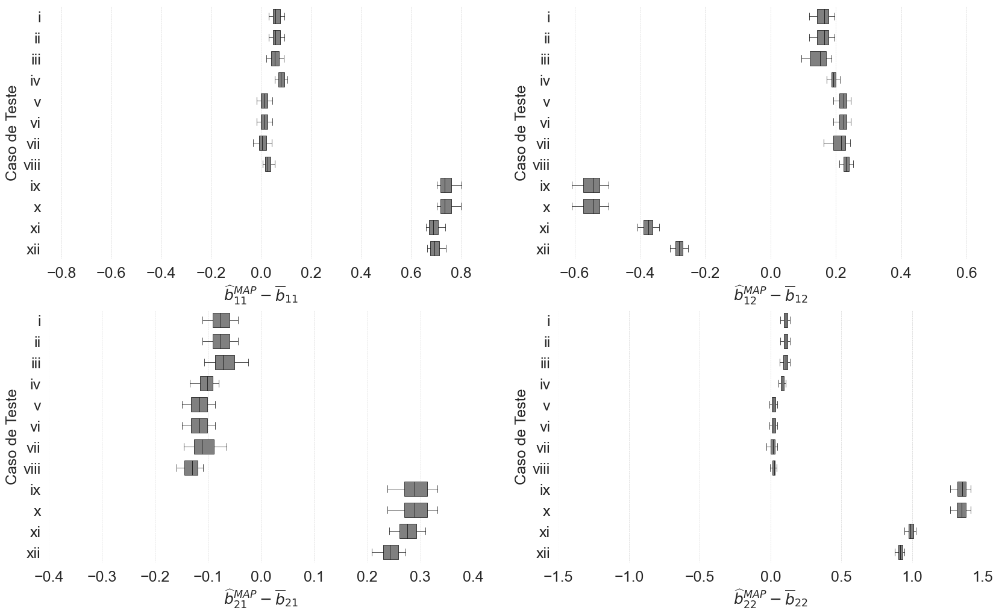

In [14]:
plot_coefficient_estimates_boxplot(
    parser=parser,
    estimate_type='map',
    test_cases=['i','ii','iii','iv','v','vi','vii','viii','ix','x','xi','xii'],
    B_true=parser.execution_config['general']['B'],
    xranges={
        'b11':(-0.85, 0.85),
        'b12':(-0.65, 0.65),
        'b21':(-0.4, 0.4),
        'b22':(-1.5, 1.5),
    },
    whis_lims=(5,95),
    return_stats=True,
    save_dir=map_dir,
    save_name='map_coeffs_boxplot',
    label_size=18
)

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,i,-0.013863,-0.022835,0.007257,-0.029346,0.047750,0.085376,0.044115,0.085201
1,ii,-0.006747,-0.009502,0.001335,-0.014787,0.045862,0.084453,0.043651,0.083208
2,iii,0.000585,-0.002090,-0.001877,0.000660,0.026167,0.037388,0.024292,0.036201
3,iv,0.192354,1.067441,-0.537017,0.325739,0.019319,0.215221,0.113435,0.033323
4,ix,0.905433,0.707084,-0.360846,1.820021,0.305160,0.790946,0.382318,0.605797
5,v,-0.051928,0.082041,-0.045928,-0.103261,0.040442,0.071440,0.037748,0.071245
6,vi,-0.058937,0.069001,-0.039220,-0.117507,0.042927,0.075686,0.037793,0.077509
7,vii,-0.046130,0.077360,-0.044944,-0.085813,0.025648,0.038071,0.023707,0.034866
8,viii,0.125638,1.020499,-0.512685,0.213919,0.018288,0.250755,0.128587,0.035805
9,x,0.788131,0.305538,-0.163885,1.577207,0.443882,1.039721,0.516348,0.871912


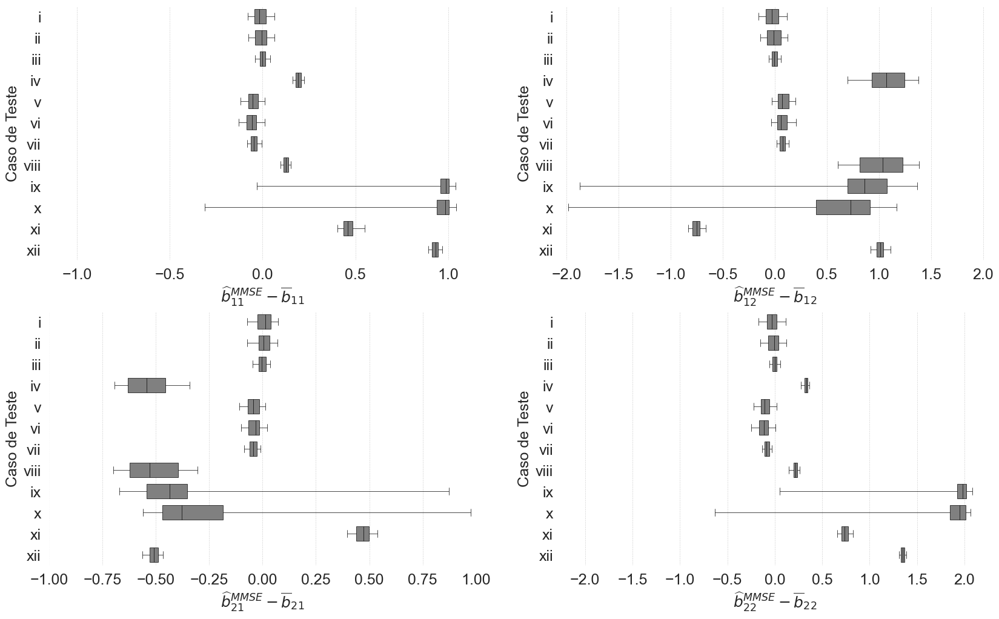

In [ ]:
plot_coefficient_estimates_boxplot(
    parser=parser,
    estimate_type='mmse',
    test_cases=['i','ii','iii','iv','v','vi','vii','viii','ix','x','xi','xii'],
    B_true=parser.execution_config['general']['B'],
    xranges={
        'b11':(-1.15, 1.15),
        'b12':(-2.05, 2.05),
        # 'b21':(-1, 1),
        'b22':(-2.25, 2.25),
    },
    whis_lims=(5,95),
    return_stats=True,
    save_dir=mmse_dir,
    save_name='mmse_coeffs_boxplot',
    label_size=18
)

### BOTH

,estimate_type,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,map,i,0.121216,0.160003,-0.152876,0.105064,0.041492,0.025173,0.044006,0.022939
1,map,ii,0.121190,0.159965,-0.152839,0.105044,0.041494,0.025179,0.044010,0.022936
2,map,iii,0.110650,0.144273,-0.136929,0.103302,0.045052,0.032320,0.049125,0.024661
3,map,iv,0.160446,0.192643,-0.206579,0.083483,0.035388,0.013182,0.034861,0.017312
4,map,ix,1.482059,-0.549515,0.577326,1.346893,0.065960,0.037672,0.064725,0.046027
5,map,v,0.026048,0.221265,-0.233332,0.020564,0.040515,0.018591,0.040967,0.019777
6,map,vi,0.026029,0.221235,-0.233301,0.020553,0.040519,0.018595,0.040972,0.019779
7,map,vii,0.012159,0.208970,-0.216006,0.013864,0.046041,0.028326,0.048615,0.025084
8,map,viii,0.056194,0.231813,-0.263912,0.022528,0.034644,0.013914,0.032981,0.014770
9,map,x,1.481655,-0.549559,0.577501,1.346364,0.065944,0.037664,0.064709,0.045993


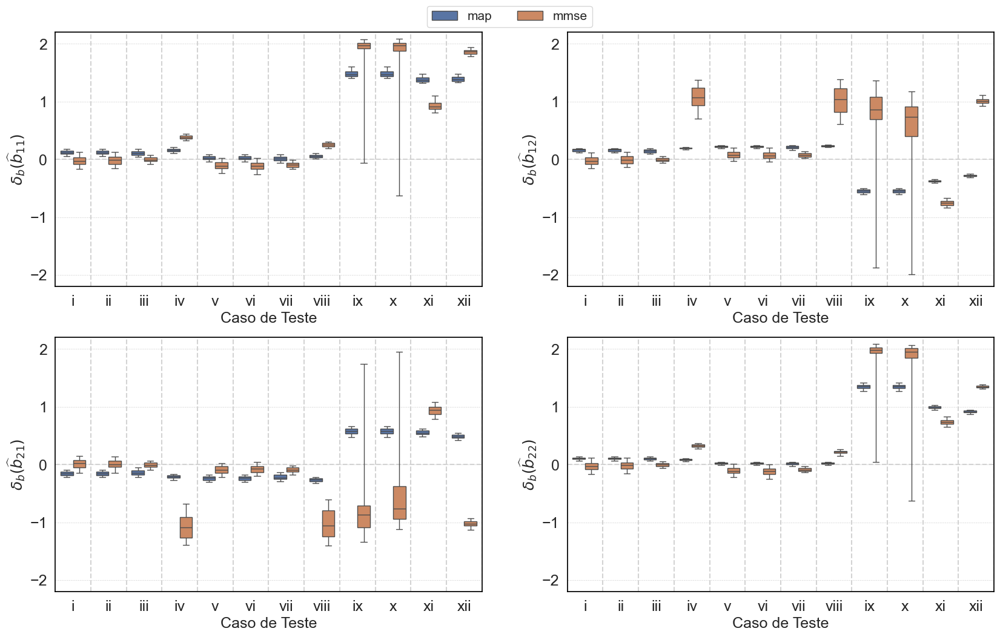

In [16]:
plot_coefficient_estimates_boxplot_map_mmse(
    parser=parser,
    test_cases=['i','ii','iii','iv','v','vi','vii','viii','ix','x','xi','xii'],
    B_true=parser.execution_config['general']['B'],
    yranges={
        'b11':(-2.2, 2.2),
        'b12':(-2.2, 2.2),
        'b21':(-2.2, 2.2),
        'b22':(-2.2, 2.2),
    },
    whis_lims=(5,95),
    return_stats=True,
    save_dir=analysis_dir,
    save_name='map_mmse_coeffs_boxplot',
    label_size=18,
    legend_size=15
)

## 2.2. Grids estimativas de coeficientes

### MMSE

In [16]:
SAVE_DIR = mmse_dir

In [17]:
# # ##########################################################
# # # ESPECIFICAÇÃO PERFEITA: CASOS DE TESTE i, ii, iii e iv #
# # ##########################################################

# plot_coefficient_estimates_grid(
#     parser=parser,
#     estimate_type='mmse',
#     test_cases=['i','iii','iv'],
#     B_true=parser.execution_config['general']['B'],
#     xranges={
#         'b11':(-2, 2),
#         'b12':(-2, 2),
#         'b21':(-2, 2),
#         'b22':(-2, 2),
#     },
#     yranges={
#         'b11':(0, 80),
#         'b12':(0, 80),
#         'b21':(0, 80),
#         'b22':(0, 80),
#     },
#     return_stats=True,
#     save_dir=SAVE_DIR,
#     save_name='mmse_coeffs_grid_i_iii_iv',
#     label_size=12,
#     legend_size=20,
#     bin_width=0.05,
#     vlinewidth=1
# )

In [18]:
# ###################################################################
# # ESPECIFICAÇÃO LEVEMENTE INCORRETA: CASOS DE TESTE v, vii, e viii #
# # ###################################################################

# plot_coefficient_estimates_grid(
#     parser=parser,
#     estimate_type='mmse',
#     test_cases=['v','vii','viii'],
#     B_true=parser.execution_config['general']['B'],
#     xranges={
#         'b11':(-2, 2),
#         'b12':(-2, 2),
#         'b21':(-2, 2),
#         'b22':(-2, 2),
#     },
#     yranges={
#         'b11':(0, 80),
#         'b12':(0, 80),
#         'b21':(0, 80),
#         'b22':(0, 80),
#     },
#     return_stats=True,
#     save_dir=SAVE_DIR,
#     save_name='mmse_coeffs_grid_v_vii_viii',
#     label_size=12,
#     legend_size=20,
#     bin_width=0.05,
#     vlinewidth=1
# )

In [19]:
# ###############################################################
# # ESPECIFICAÇÃO MUITO INCORRETA: CASOS DE TESTE ix, xi, e xii #
# ###############################################################

# plot_coefficient_estimates_grid(
#     parser=parser,
#     estimate_type='mmse',
#     test_cases=['ix','xi', 'xii'],
#     B_true=parser.execution_config['general']['B'],
#     xranges={
#         'b11':(-2.5, 2.5),
#         'b12':(-2.5, 2.5),
#         'b21':(-2.5, 2.5),
#         'b22':(-2.5, 2.5),
#     },
#     yranges={
#         'b11':(0, 80),
#         'b12':(0, 80),
#         'b21':(0, 80),
#         'b22':(0, 80),
#     },
#     return_stats=True,
#     save_dir=SAVE_DIR,
#     save_name='mmse_coeffs_grid_ix_xi_xii',
#     label_size=12,
#     legend_size=20,
#     bin_width=0.05,
#     vlinewidth=1
# )

### MAP

In [20]:
SAVE_DIR = map_dir

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,i,0.060608,0.160003,-0.076438,0.105064,0.020746,0.025173,0.022003,0.022939
1,iii,0.055325,0.144273,-0.068464,0.103302,0.022526,0.032320,0.024562,0.024661
2,iv,0.080223,0.192643,-0.103289,0.083483,0.017694,0.013182,0.017430,0.017312


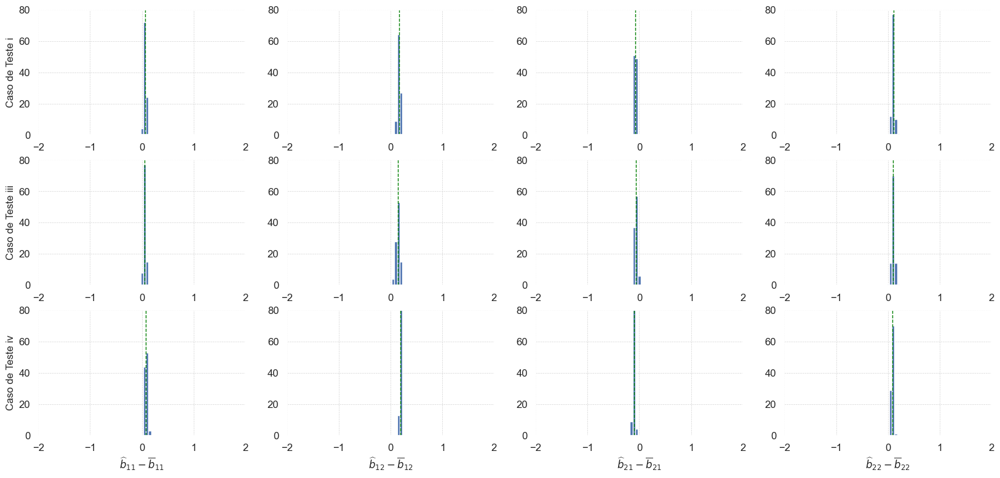

In [21]:
# ##########################################################
# # ESPECIFICAÇÃO PERFEITA: CASOS DE TESTE i, ii, iii e iv #
# ##########################################################

plot_coefficient_estimates_grid(
    parser=parser,
    estimate_type='map',
    test_cases=['i','iii','iv'],
    B_true=parser.execution_config['general']['B'],
    xranges={
        'b11':(-2, 2),
        'b12':(-2, 2),
        'b21':(-2, 2),
        'b22':(-2, 2),
    },
    yranges={
        'b11':(0, 80),
        'b12':(0, 80),
        'b21':(0, 80),
        'b22':(0, 80),
    },
    return_stats=True,
    save_dir=SAVE_DIR,
    save_name='map_coeffs_grid_i_iii_iv',
    label_size=12,
    legend_size=20,
    bin_width=0.05,
    vlinewidth=1
)

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,v,0.013024,0.221265,-0.116666,0.020564,0.020257,0.018591,0.020483,0.019777
1,vii,0.006080,0.208970,-0.108003,0.013864,0.023021,0.028326,0.024308,0.025084
2,viii,0.028097,0.231813,-0.131956,0.022528,0.017322,0.013914,0.016490,0.014770


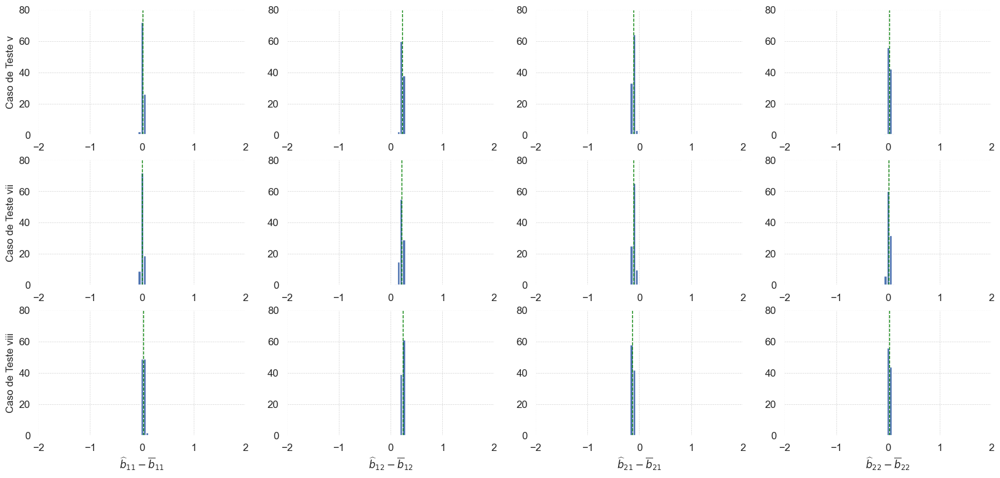

In [22]:
# ###################################################################
# # ESPECIFICAÇÃO LEVEMENTE INCORRETA: CASOS DE TESTE v, vi, e viii #
# ###################################################################

plot_coefficient_estimates_grid(
    parser=parser,
    estimate_type='map',
    test_cases=['v','vii','viii'],
    B_true=parser.execution_config['general']['B'],
    xranges={
        'b11':(-2, 2),
        'b12':(-2, 2),
        'b21':(-2, 2),
        'b22':(-2, 2),
    },
    yranges={
        'b11':(0, 80),
        'b12':(0, 80),
        'b21':(0, 80),
        'b22':(0, 80),
    },
    return_stats=True,
    save_dir=SAVE_DIR,
    save_name='map_coeffs_grid_v_vii_viii',
    label_size=12,
    legend_size=20,
    bin_width=0.05,
    vlinewidth=1
)

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,ix,0.741030,-0.549515,0.288663,1.346893,0.032980,0.037672,0.032362,0.046027
1,xi,0.692513,-0.375053,0.276511,0.990613,0.025814,0.021604,0.022460,0.025606
2,xii,0.696862,-0.280204,0.243364,0.915643,0.024053,0.017963,0.020116,0.022796


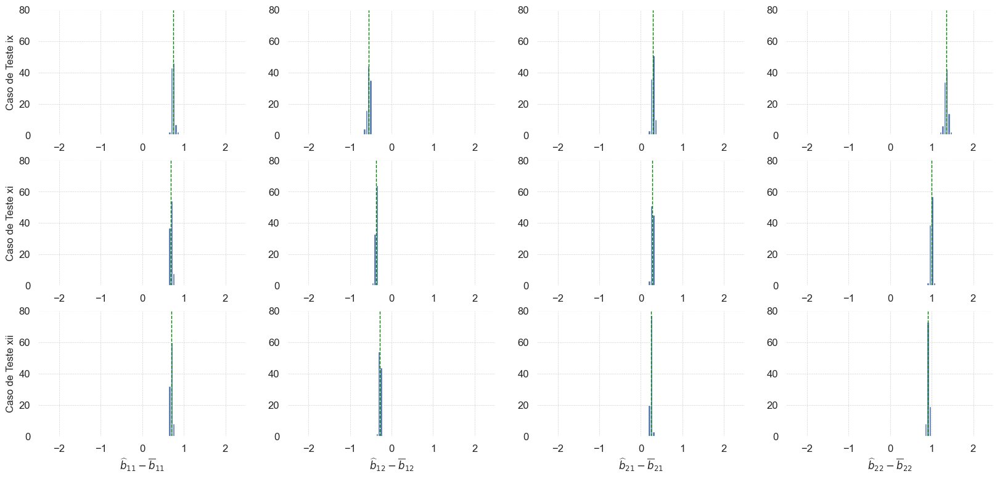

In [23]:
# ###############################################################
# # ESPECIFICAÇÃO MUITO INCORRETA: CASOS DE TESTE ix, xi, e xii #
# ###############################################################

plot_coefficient_estimates_grid(
    parser=parser,
    estimate_type='map',
    test_cases=['ix','xi', 'xii'],
    B_true=parser.execution_config['general']['B'],
    xranges={
        'b11':(-2.5, 2.5),
        'b12':(-2.5, 2.5),
        'b21':(-2.5, 2.5),
        'b22':(-2.5, 2.5),
    },
    yranges={
        'b11':(0, 80),
        'b12':(0, 80),
        'b21':(0, 80),
        'b22':(0, 80),
    },
    return_stats=True,
    save_dir=SAVE_DIR,
    save_name='map_coeffs_grid_ix_xi_xii',
    label_size=12,
    legend_size=20,
    bin_width=0.05,
    vlinewidth=1
)

In [24]:
# #################################################################
# # ESPECIFICAÇÃO MUITO INCORRETA: CASOS DE TESTE ix, x, xi e xii #
# #################################################################

# EstimationGraphPlotter.plot_test_cases_contours(
#     parser=parser,
#     test_cases=['v','vi','vii','viii'],
#     equal_aspect=True,
#     marker_size=70,
#     u_range=(-0.3, 0.3),
#     v_range=(-0.3, 0.3),
#     save_dir=SAVE_DIR,
#     save_name='maximos_curvas_nivel_v_viii'
# )

In [25]:
# #################################################################
# # ESPECIFICAÇÃO MUITO INCORRETA: CASOS DE TESTE ix, x, xi e xii #
# #################################################################

# EstimationGraphPlotter.plot_test_cases_contours(
#     parser=parser,
#     test_cases=['ix','x','xi','xii'],
#     equal_aspect=True,
#     marker_size=70,
#     u_range=(-0.3, 0.35),
#     v_range=(-0.3, 0.35),
#     save_dir=SAVE_DIR,
#     save_name='maximos_curvas_nivel_ix_xii',
#     legend_location='lower right'
# )

### Mesma prior

In [26]:
# #############################################
# # PRIOR UNIFORME: CASOS DE TESTE i, v, e ix #
# #############################################

# EstimationGraphPlotter.plot_test_cases_contours(
#     parser=parser,
#     test_cases=['i','v','ix'],
#     equal_aspect=True,
#     u_range=(-0.1, 0.1)
# )

In [27]:
# #################################################################
# # PRIOR CORRETA E POUCO INFORMATIVA: CASOS DE TESTE ii, vi, e x #
# #################################################################

# EstimationGraphPlotter.plot_test_cases_contours(
#     parser=parser,
#     test_cases=['ii','vi','x'],
#     equal_aspect=True
# )

In [28]:
# ##############################################################
# # PRIOR CORRETA E INFORMATIVA: CASOS DE TESTE iii, vii, e xi #
# ##############################################################

# EstimationGraphPlotter.plot_test_cases_contours(
#     parser=parser,
#     test_cases=['iii','vii','xi'],
#     equal_aspect=True
# )

In [29]:
# #################################################################
# # PRIOR INCORRETA E INFORMATIVA: CASOS DE TESTE iv, viii, e xii #
# #################################################################

# EstimationGraphPlotter.plot_test_cases_contours(
#     parser=parser,
#     test_cases=['iv','viii','xii'],
#     equal_aspect=True
# )



## 2.2. Coeficientes MMSE estimados

In [30]:
SAVE_DIR = mmse_dir

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,i,-0.013863,-0.022835,0.007257,-0.029346,0.047750,0.085376,0.044115,0.085201
1,iii,0.000585,-0.002090,-0.001877,0.000660,0.026167,0.037388,0.024292,0.036201


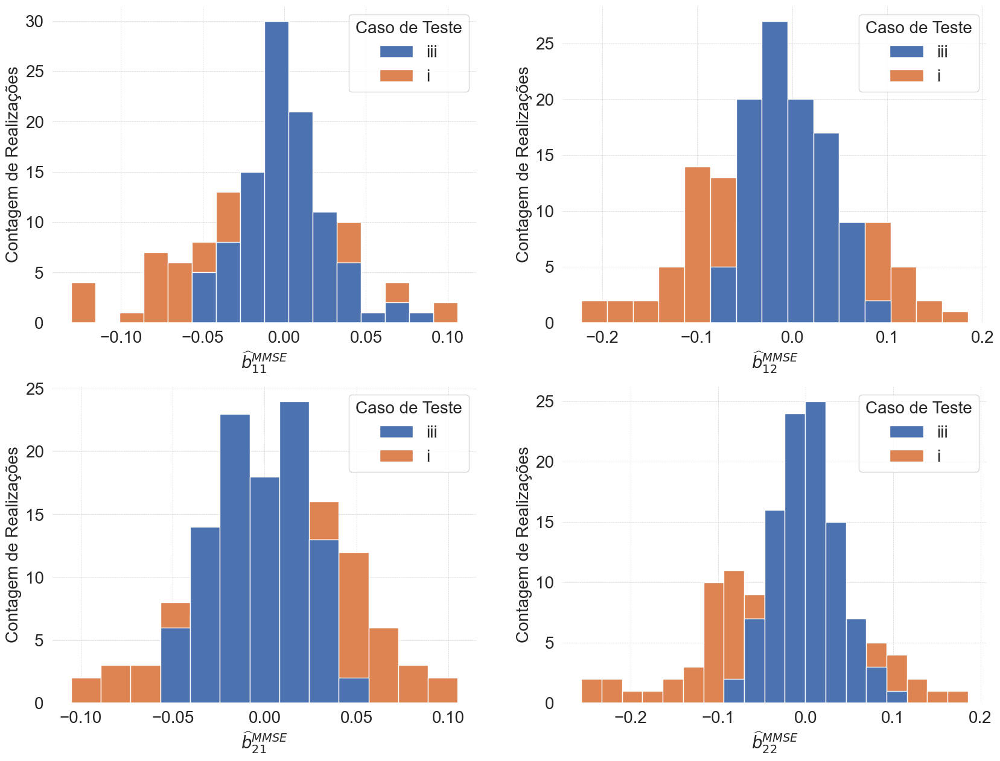

In [31]:
##########################################################
# ESPECIFICAÇÃO PERFEITA: CASOS DE TESTE i, ii, iii e iv #
##########################################################

_plot_test_cases_mmse_coefficient_estimates(
    parser=parser,
    test_cases=['iii','i'],
    B_true=parser.execution_config['general']['B'],
    save_dir=SAVE_DIR,
    save_name='estimativas_mmse_i_iv',
    label_size=20
)

### Mesmo modelo

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,i,-0.013863,-0.022835,0.007257,-0.029346,0.047750,0.085376,0.044115,0.085201
1,ii,-0.006747,-0.009502,0.001335,-0.014787,0.045862,0.084453,0.043651,0.083208
2,iii,0.000585,-0.002090,-0.001877,0.000660,0.026167,0.037388,0.024292,0.036201
3,iv,0.192354,1.067441,-0.537017,0.325739,0.019319,0.215221,0.113435,0.033323


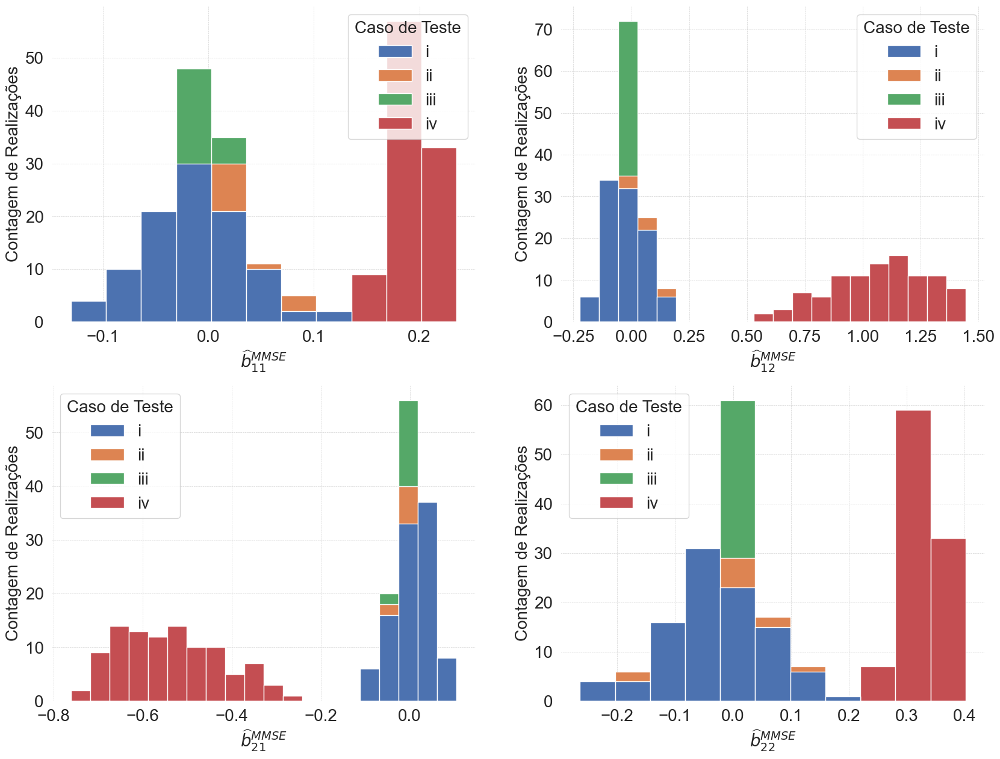

In [32]:
##########################################################
# ESPECIFICAÇÃO PERFEITA: CASOS DE TESTE i, ii, iii e iv #
##########################################################

_plot_test_cases_mmse_coefficient_estimates(
    parser=parser,
    test_cases=['i','ii','iii','iv'],
    B_true=parser.execution_config['general']['B'],
    save_dir=SAVE_DIR,
    save_name='estimativas_mmse_i_iv',
    label_size=20
)

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,v,-0.051928,0.082041,-0.045928,-0.103261,0.040442,0.071440,0.037748,0.071245
1,vi,-0.058937,0.069001,-0.039220,-0.117507,0.042927,0.075686,0.037793,0.077509
2,vii,-0.046130,0.077360,-0.044944,-0.085813,0.025648,0.038071,0.023707,0.034866
3,viii,0.125638,1.020499,-0.512685,0.213919,0.018288,0.250755,0.128587,0.035805


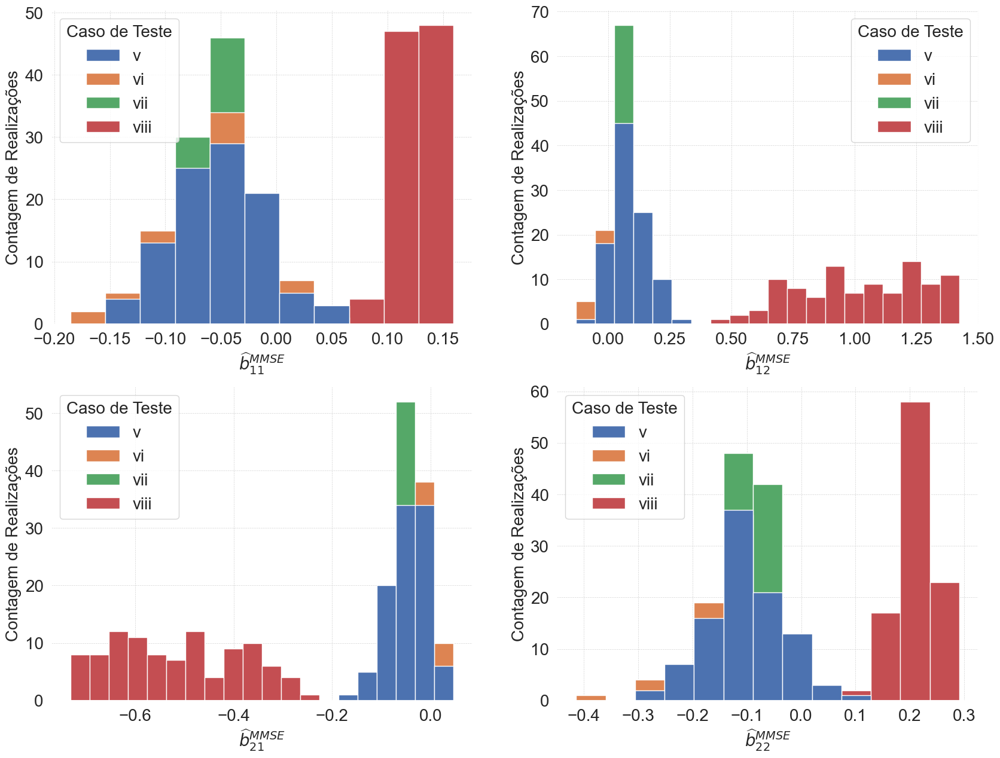

In [33]:
###################################################################
# ESPECIFICAÇÃO MUITO INCORRETA: CASOS DE TESTE v, vi, vii e viii #
###################################################################

_plot_test_cases_mmse_coefficient_estimates(
    parser=parser,
    test_cases=['v','vi','vii','viii'],
    B_true=parser.execution_config['general']['B'],
    save_dir=SAVE_DIR,
    save_name='estimativas_mmse_v_viii'
)

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,ix,0.905433,0.707084,-0.360846,1.820021,0.305160,0.790946,0.382318,0.605797
1,x,0.788131,0.305538,-0.163885,1.577207,0.443882,1.039721,0.516348,0.871912
2,xi,0.463702,-0.753080,0.468661,0.739168,0.044078,0.055130,0.041762,0.052628
3,xii,0.930536,1.012956,-0.510525,1.348102,0.025104,0.054575,0.029191,0.026864


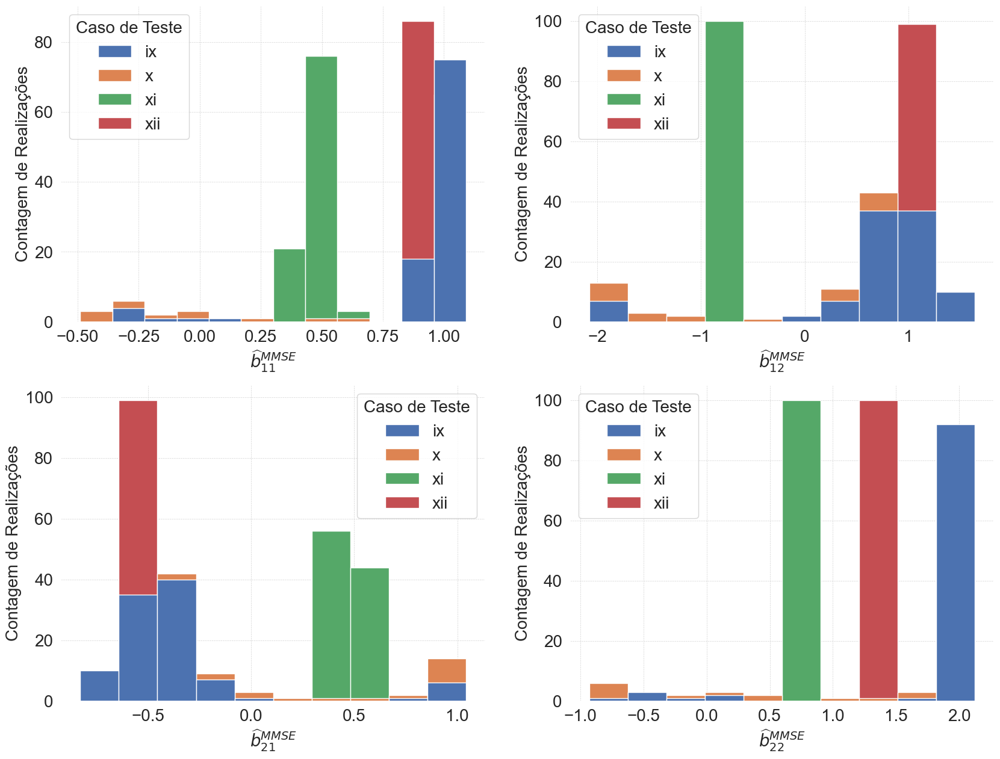

In [34]:
#################################################################
# ESPECIFICAÇÃO MUITO INCORRETA: CASOS DE TESTE ix, x, xi e xii #
#################################################################

_plot_test_cases_mmse_coefficient_estimates(
    parser=parser,
    test_cases=['ix','x','xi','xii'],
    B_true=parser.execution_config['general']['B'],
    save_dir=SAVE_DIR,
    save_name='estimativas_mmse_ix_xii'
)

### Mesma prior

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,i,0.486137,-1.022835,0.507257,0.970654,0.047750,0.085376,0.044115,0.085201
1,ix,1.405433,-0.292916,0.139154,2.820021,0.305160,0.790946,0.382318,0.605797
2,v,0.448072,-0.917959,0.454072,0.896739,0.040442,0.071440,0.037748,0.071245


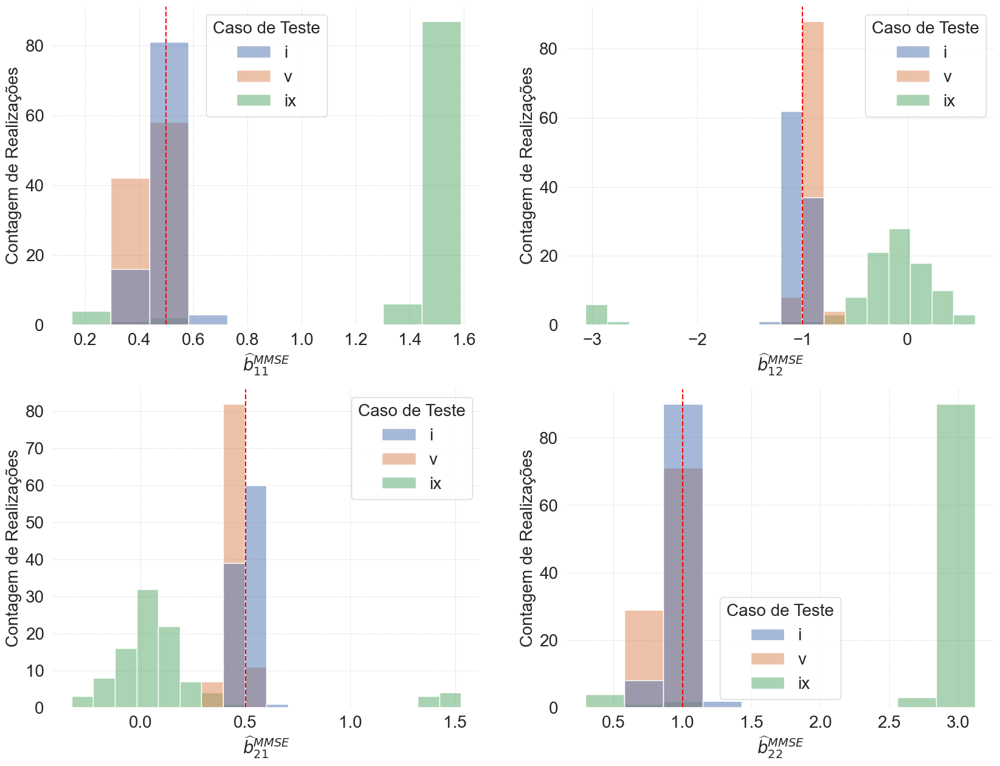

In [35]:
#############################################
# PRIOR UNIFORME: CASOS DE TESTE i, v, e ix #
#############################################

EstimationGraphPlotter.plot_test_cases_mmse_coefficient_estimates(
    parser=parser,
    test_cases=['i','v','ix'],
    B_true=parser.execution_config['general']['B']
)

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,ii,0.493253,-1.009502,0.501335,0.985213,0.045862,0.084453,0.043651,0.083208
1,vi,0.441063,-0.930999,0.460780,0.882493,0.042927,0.075686,0.037793,0.077509
2,x,1.288131,-0.694462,0.336115,2.577207,0.443882,1.039721,0.516348,0.871912


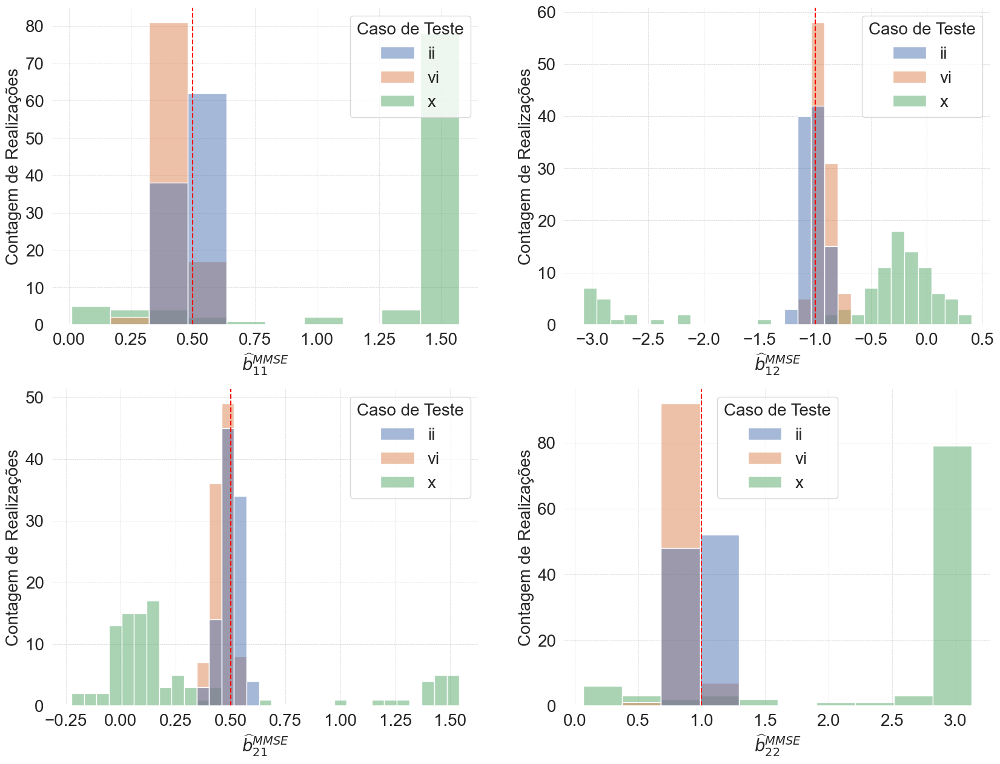

In [36]:
#################################################################
# PRIOR CORRETA E POUCO INFORMATIVA: CASOS DE TESTE ii, vi, e x #
#################################################################
EstimationGraphPlotter.plot_test_cases_mmse_coefficient_estimates(
    parser=parser,
    test_cases=['ii','vi','x'],
    B_true=parser.execution_config['general']['B']
)

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,iii,0.500585,-1.00209,0.498123,1.000660,0.026167,0.037388,0.024292,0.036201
1,vii,0.453870,-0.92264,0.455056,0.914187,0.025648,0.038071,0.023707,0.034866
2,xi,0.963702,-1.75308,0.968661,1.739168,0.044078,0.055130,0.041762,0.052628


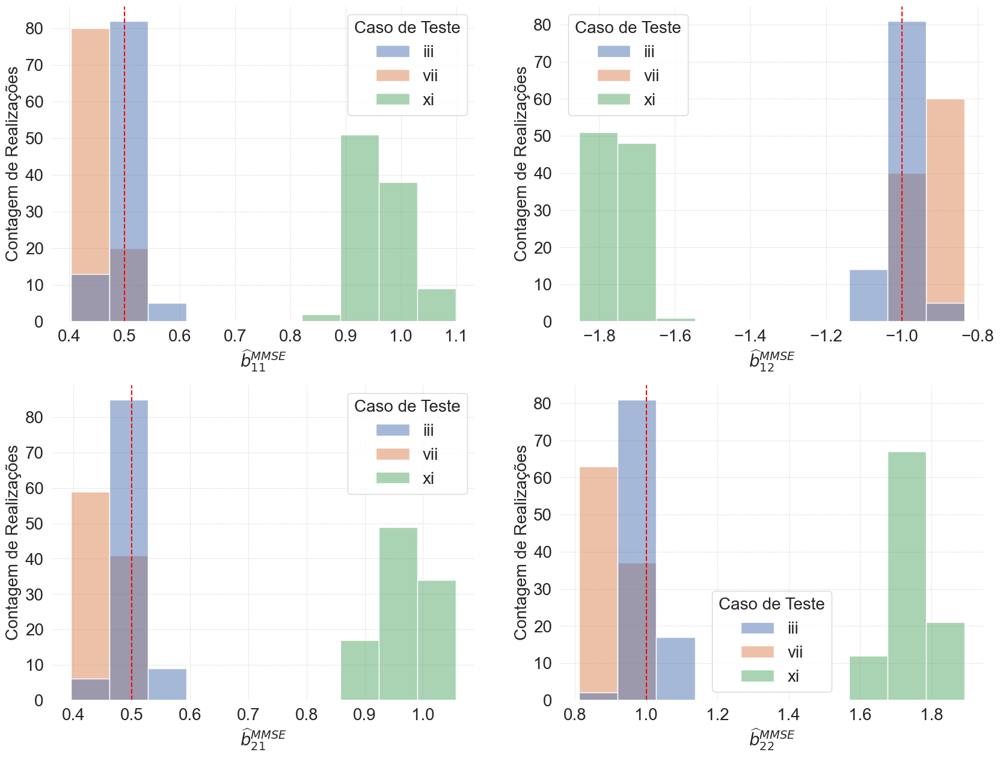

In [37]:
##############################################################
# PRIOR CORRETA E INFORMATIVA: CASOS DE TESTE iii, vii, e xi #
##############################################################
EstimationGraphPlotter.plot_test_cases_mmse_coefficient_estimates(
    parser=parser,
    test_cases=['iii','vii','xi'],
    B_true=parser.execution_config['general']['B']
)

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,iv,0.692354,0.067441,-0.037017,1.325739,0.019319,0.215221,0.113435,0.033323
1,viii,0.625638,0.020499,-0.012685,1.213919,0.018288,0.250755,0.128587,0.035805
2,xii,1.430536,0.012956,-0.010525,2.348102,0.025104,0.054575,0.029191,0.026864


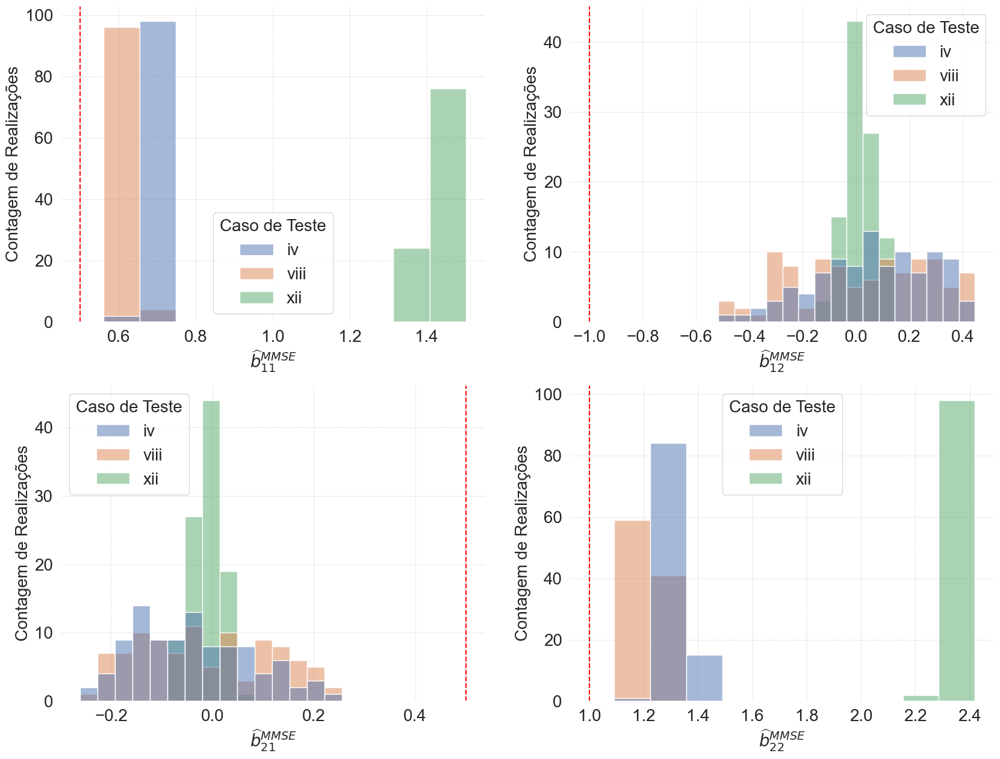

In [38]:
#################################################################
# PRIOR INCORRETA E INFORMATIVA: CASOS DE TESTE iv, viii, e xii #
#################################################################
EstimationGraphPlotter.plot_test_cases_mmse_coefficient_estimates(
    parser=parser,
    test_cases=['iv','viii','xii'],
    B_true=parser.execution_config['general']['B']
)

## 2.3. Erros MMSE

### Mesmo modelo

,test_case,errors_mean,errors_min,errors_max,errors_std
0,i,0.077529,0.008501,0.227616,0.045781
1,ii,0.073072,0.009157,0.227639,0.044457
2,iii,0.036051,0.002515,0.073958,0.016852
3,iv,0.794753,0.425711,1.039957,0.144822


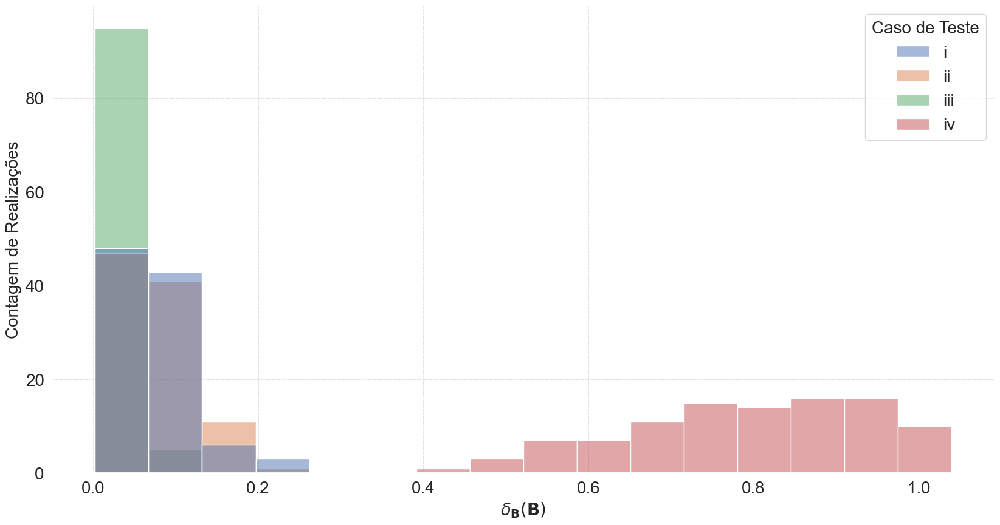

In [39]:
##########################################################
# ESPECIFICAÇÃO PERFEITA: CASOS DE TESTE i, ii, iii e iv #
##########################################################

EstimationGraphPlotter.plot_test_cases_mmse_errors(
    parser=parser,
    test_cases=['i','ii','iii','iv'],
    save_dir=SAVE_DIR,
    save_name='erros_mmse_i_iv'
)

,test_case,errors_mean,errors_min,errors_max,errors_std
0,v,0.115409,0.063441,0.216387,0.028492
1,vi,0.118775,0.062797,0.299905,0.035783
2,vii,0.091098,0.052400,0.138584,0.015511
3,viii,0.740500,0.350328,1.019005,0.174285


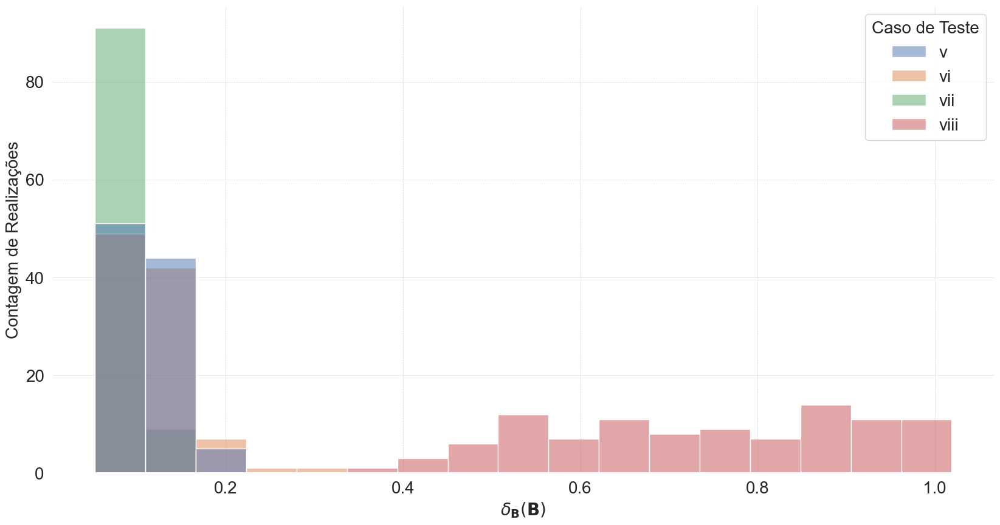

In [40]:
###################################################################
# ESPECIFICAÇÃO MUITO INCORRETA: CASOS DE TESTE vi, vi, viii e ix #
###################################################################

EstimationGraphPlotter.plot_test_cases_mmse_errors(
    parser=parser,
    test_cases=['v','vi','vii','viii'],
    save_dir=SAVE_DIR,
    save_name='erros_mmse_v_viii'
)

,test_case,errors_mean,errors_min,errors_max,errors_std
0,ix,1.543501,1.227921,1.819763,0.102559
1,x,1.479663,1.070285,1.698595,0.122743
2,xi,0.789132,0.747466,0.840210,0.017314
3,xii,1.260740,1.206611,1.325622,0.024292


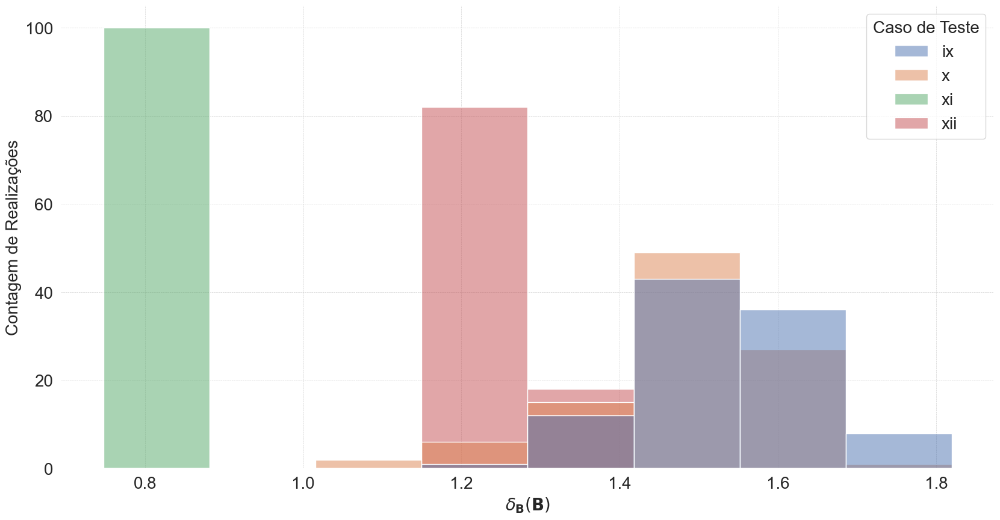

In [41]:
#################################################################
# ESPECIFICAÇÃO MUITO INCORRETA: CASOS DE TESTE ix, x, xi e xii #
#################################################################

EstimationGraphPlotter.plot_test_cases_mmse_errors(
    parser=parser,
    test_cases=['ix','x','xi','xii'],
    save_dir=SAVE_DIR,
    save_name='erros_mmse_ix_xii'
)

### Mesma prior

,test_case,errors_mean,errors_min,errors_max,errors_std
0,i,0.077529,0.008501,0.227616,0.045781
1,ix,1.543501,1.227921,1.819763,0.102559
2,v,0.115409,0.063441,0.216387,0.028492


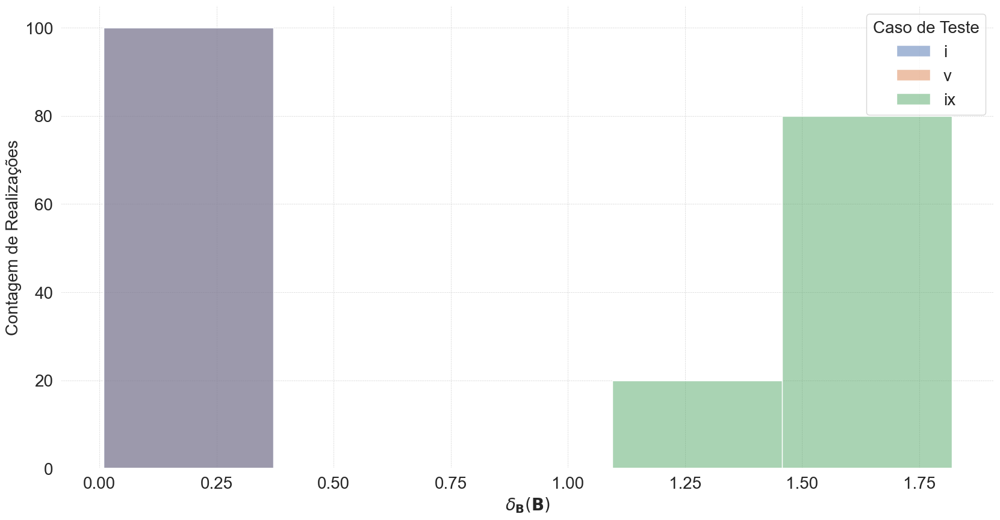

In [42]:
#############################################
# PRIOR UNIFORME: CASOS DE TESTE i, v, e ix #
#############################################

EstimationGraphPlotter.plot_test_cases_mmse_errors(
    parser=parser,
    test_cases=['i','v','ix']
)

,test_case,errors_mean,errors_min,errors_max,errors_std
0,ii,0.073072,0.009157,0.227639,0.044457
1,vi,0.118775,0.062797,0.299905,0.035783
2,x,1.479663,1.070285,1.698595,0.122743


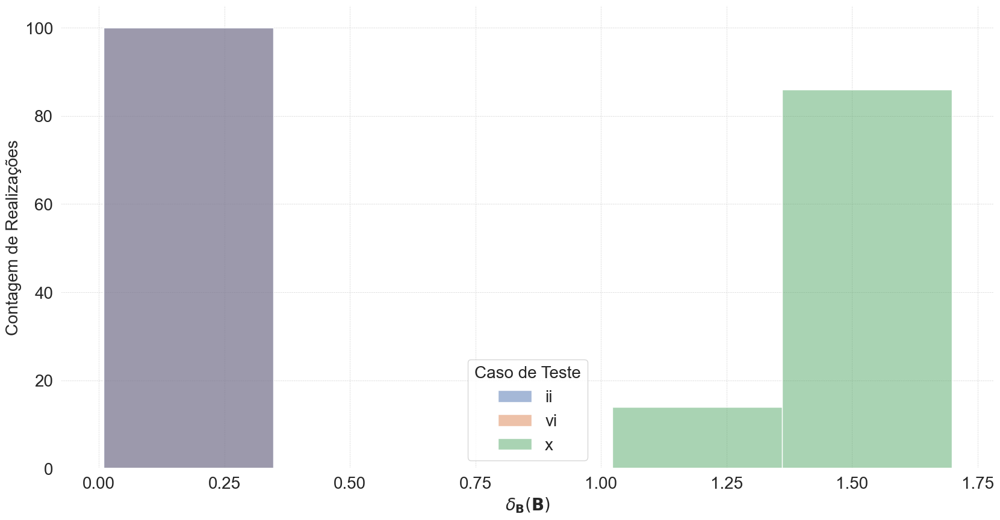

In [43]:
#################################################################
# PRIOR CORRETA E POUCO INFORMATIVA: CASOS DE TESTE ii, vi, e x #
#################################################################

EstimationGraphPlotter.plot_test_cases_mmse_errors(
    parser=parser,
    test_cases=['ii','vi','x']
)

,test_case,errors_mean,errors_min,errors_max,errors_std
0,iii,0.036051,0.002515,0.073958,0.016852
1,vii,0.091098,0.052400,0.138584,0.015511
2,xi,0.789132,0.747466,0.840210,0.017314


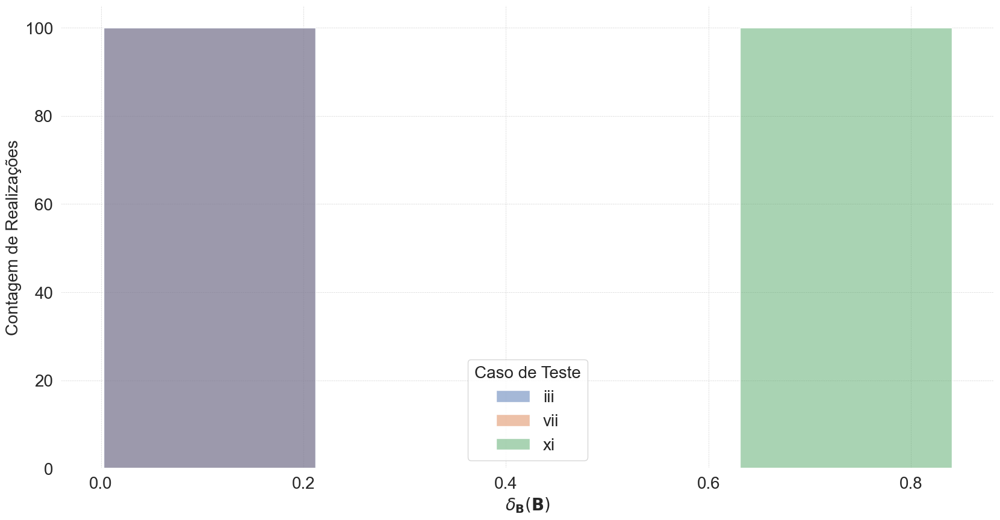

In [44]:
##############################################################
# PRIOR CORRETA E INFORMATIVA: CASOS DE TESTE iii, vii, e xi #
##############################################################

EstimationGraphPlotter.plot_test_cases_mmse_errors(
    parser=parser,
    test_cases=['iii','vii','xi']
)

,test_case,errors_mean,errors_min,errors_max,errors_std
0,iv,0.794753,0.425711,1.039957,0.144822
1,viii,0.740500,0.350328,1.019005,0.174285
2,xii,1.260740,1.206611,1.325622,0.024292


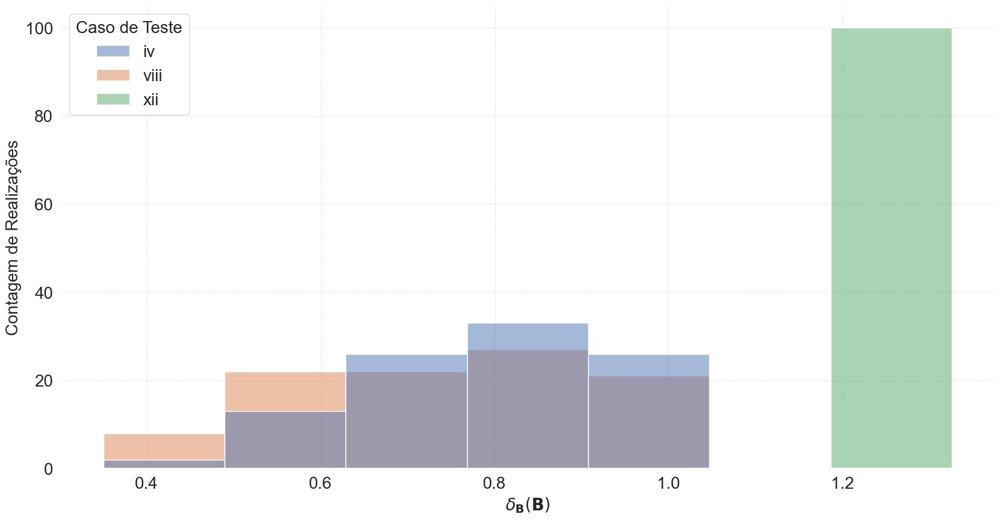

In [45]:
#################################################################
# PRIOR INCORRETA E INFORMATIVA: CASOS DE TESTE iv, viii, e xii #
#################################################################

EstimationGraphPlotter.plot_test_cases_mmse_errors(
    parser=parser,
    test_cases=['iv','viii','xii']
)

## 2.4. Determinantes MMSE

### Mesmo modelo

In [46]:
##########################################################
# ESPECIFICAÇÃO PERFEITA: CASOS DE TESTE i, ii, iii e iv #
##########################################################

# EstimationGraphPlotter.plot_test_cases_min_determinants(
#     parser=parser,
#     test_cases=['i','ii','iii','iv']
# )

In [47]:
#################################################################
# ESPECIFICAÇÃO MUITO INCORRETA: CASOS DE TESTE ix, x, xi e xii #
#################################################################

# EstimationGraphPlotter.plot_test_cases_min_determinants(
#     parser=parser,
#     test_cases=['v','vi','vii','viii']
# )

In [48]:
#################################################################
# ESPECIFICAÇÃO MUITO INCORRETA: CASOS DE TESTE ix, x, xi e xii #
#################################################################

# EstimationGraphPlotter.plot_test_cases_min_determinants(
#     parser=parser,
#     test_cases=['ix','x','xi','xii']
# )

### Mesma prior

In [49]:
#############################################
# PRIOR UNIFORME: CASOS DE TESTE i, v, e ix #
#############################################

# EstimationGraphPlotter.plot_test_cases_min_determinants(
#     parser=parser,
#     test_cases=['i','v','ix']
# )

In [50]:
#################################################################
# PRIOR CORRETA E POUCO INFORMATIVA: CASOS DE TESTE ii, vi, e x #
#################################################################

# EstimationGraphPlotter.plot_test_cases_min_determinants(
#     parser=parser,
#     test_cases=['ii','vi','x']
# )

In [51]:
##############################################################
# PRIOR CORRETA E INFORMATIVA: CASOS DE TESTE iii, vii, e xi #
##############################################################

# EstimationGraphPlotter.plot_test_cases_min_determinants(
#     parser=parser,
#     test_cases=['iii','vii','xi']
# )

In [52]:
#################################################################
# PRIOR INCORRETA E INFORMATIVA: CASOS DE TESTE iv, viii, e xii #
#################################################################

# EstimationGraphPlotter.plot_test_cases_min_determinants(
#     parser=parser,
#     test_cases=['iv','viii','xii']
# )

### Todos os casos de teste - scatterplots

In [53]:
####################################
# MARKERS IGUAIS PARA MESMO MODELO #
####################################

# EstimationGraphPlotter.plot_test_cases_determinants_scatter(
#     parser,
#     marker='model'
# )

In [54]:
###################################
# MARKERS IGUAIS PARA MESMA PRIOR #
###################################

# EstimationGraphPlotter.plot_test_cases_determinants_scatter(
#     parser,
#     marker='prior'
# )

## 2.5. Coeficientes MAP estimados

In [55]:
SAVE_DIR=map_dir

### Mesmo modelo

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,i,0.560608,-0.839997,0.423562,1.105064,0.020746,0.025173,0.022003,0.022939
1,ii,0.560595,-0.840035,0.423580,1.105044,0.020747,0.025179,0.022005,0.022936
2,iii,0.555325,-0.855727,0.431536,1.103302,0.022526,0.032320,0.024562,0.024661
3,iv,0.580223,-0.807357,0.396711,1.083483,0.017694,0.013182,0.017430,0.017312


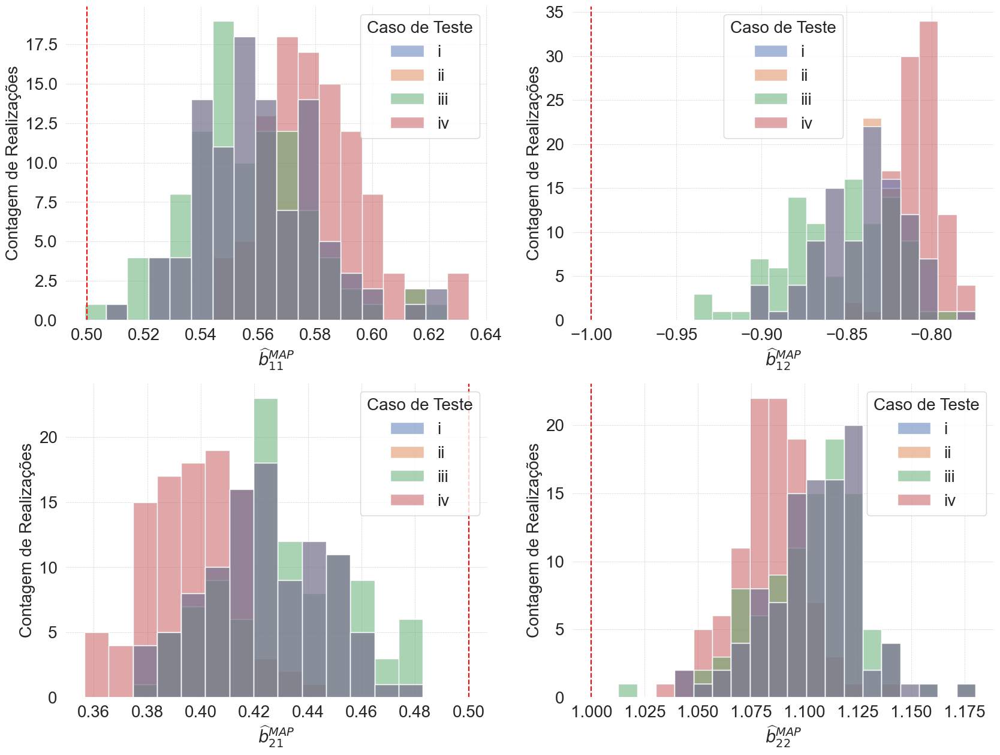

In [56]:
##########################################################
# ESPECIFICAÇÃO PERFEITA: CASOS DE TESTE i, ii, iii e iv #
##########################################################

EstimationGraphPlotter.plot_test_cases_map_coefficient_estimates(
    parser=parser,
    test_cases=['i','ii','iii','iv'],
    B_true=parser.execution_config['general']['B'],
    save_dir=SAVE_DIR,
    save_name='estimativas_map_i_iv'
)

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,v,0.513024,-0.778735,0.383334,1.020564,0.020257,0.018591,0.020483,0.019777
1,vi,0.513014,-0.778765,0.383349,1.020553,0.020259,0.018595,0.020486,0.019779
2,vii,0.506080,-0.791030,0.391997,1.013864,0.023021,0.028326,0.024308,0.025084
3,viii,0.528097,-0.768187,0.368044,1.022528,0.017322,0.013914,0.016490,0.014770


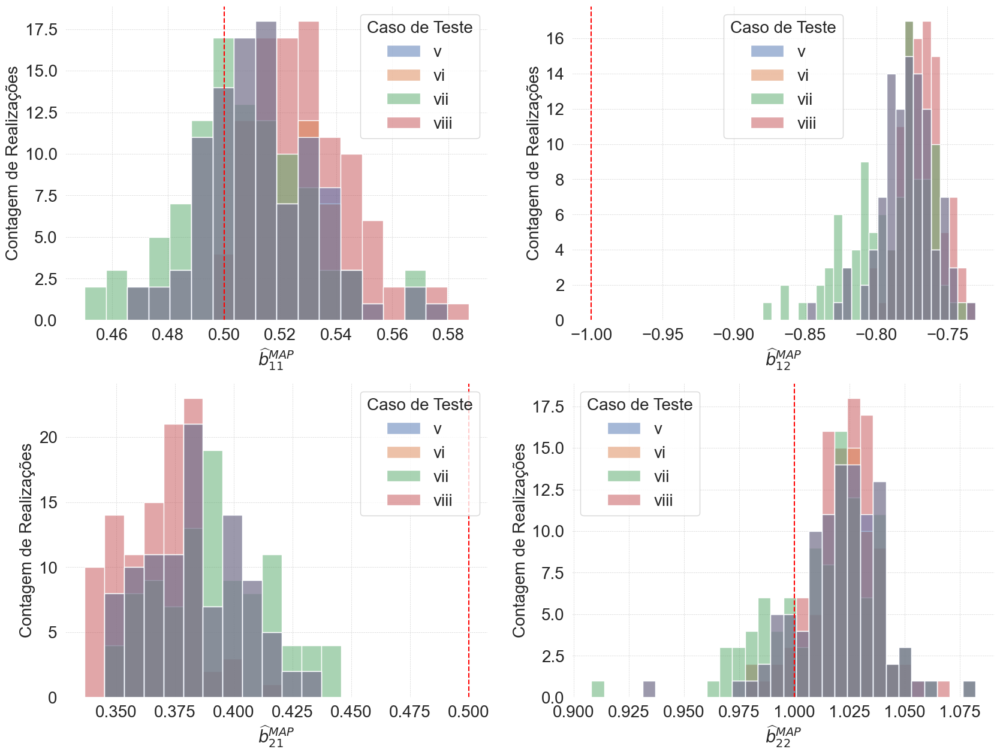

In [57]:
###################################################################
# ESPECIFICAÇÃO MUITO INCORRETA: CASOS DE TESTE v, vi, vii e viii #
###################################################################

EstimationGraphPlotter.plot_test_cases_map_coefficient_estimates(
    parser=parser,
    test_cases=['v','vi','vii','viii'],
    B_true=parser.execution_config['general']['B'],
    save_dir=SAVE_DIR,
    save_name='estimativas_map_v_viii'
)

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,ix,1.405433,-0.292916,0.139154,2.820021,0.305160,0.790946,0.382318,0.605797
1,x,1.288131,-0.694462,0.336115,2.577207,0.443882,1.039721,0.516348,0.871912
2,xi,0.963702,-1.753080,0.968661,1.739168,0.044078,0.055130,0.041762,0.052628
3,xii,1.430536,0.012956,-0.010525,2.348102,0.025104,0.054575,0.029191,0.026864


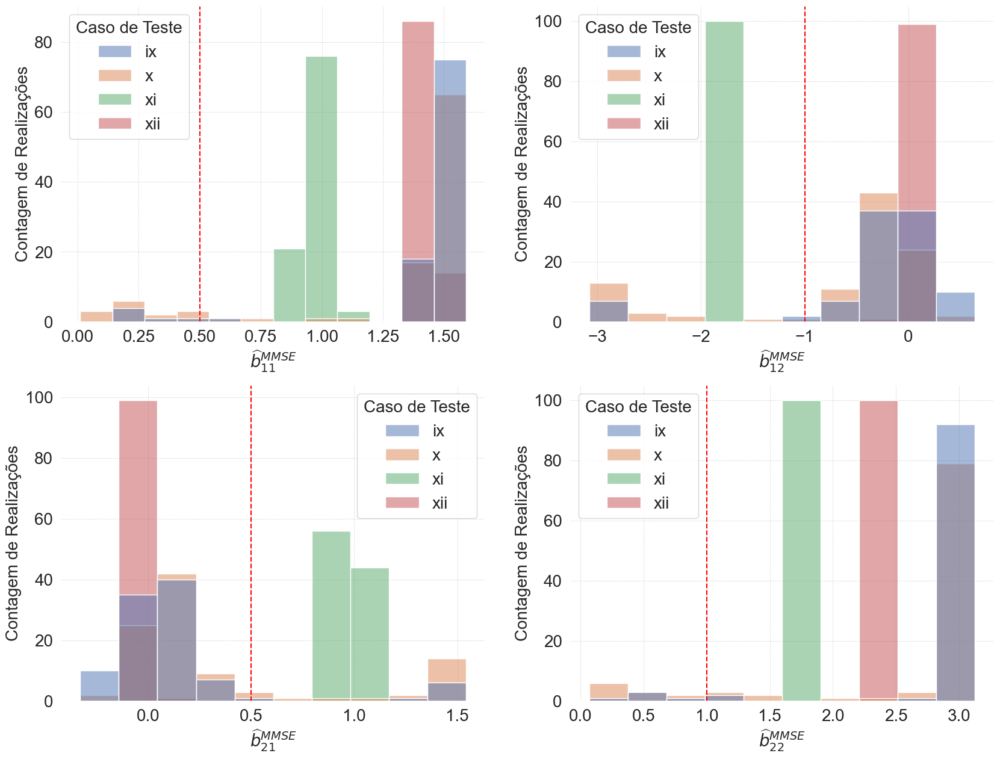

In [58]:
#################################################################
# ESPECIFICAÇÃO MUITO INCORRETA: CASOS DE TESTE ix, x, xi e xii #
#################################################################

EstimationGraphPlotter.plot_test_cases_mmse_coefficient_estimates(
    parser=parser,
    test_cases=['ix','x','xi','xii'],
    B_true=parser.execution_config['general']['B'],
    save_dir=SAVE_DIR,
    save_name='estimativas_map_ix_xii'
)

### Mesma prior

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,i,0.560608,-0.839997,0.423562,1.105064,0.020746,0.025173,0.022003,0.022939
1,ix,1.241030,-1.549515,0.788663,2.346893,0.032980,0.037672,0.032362,0.046027
2,v,0.513024,-0.778735,0.383334,1.020564,0.020257,0.018591,0.020483,0.019777


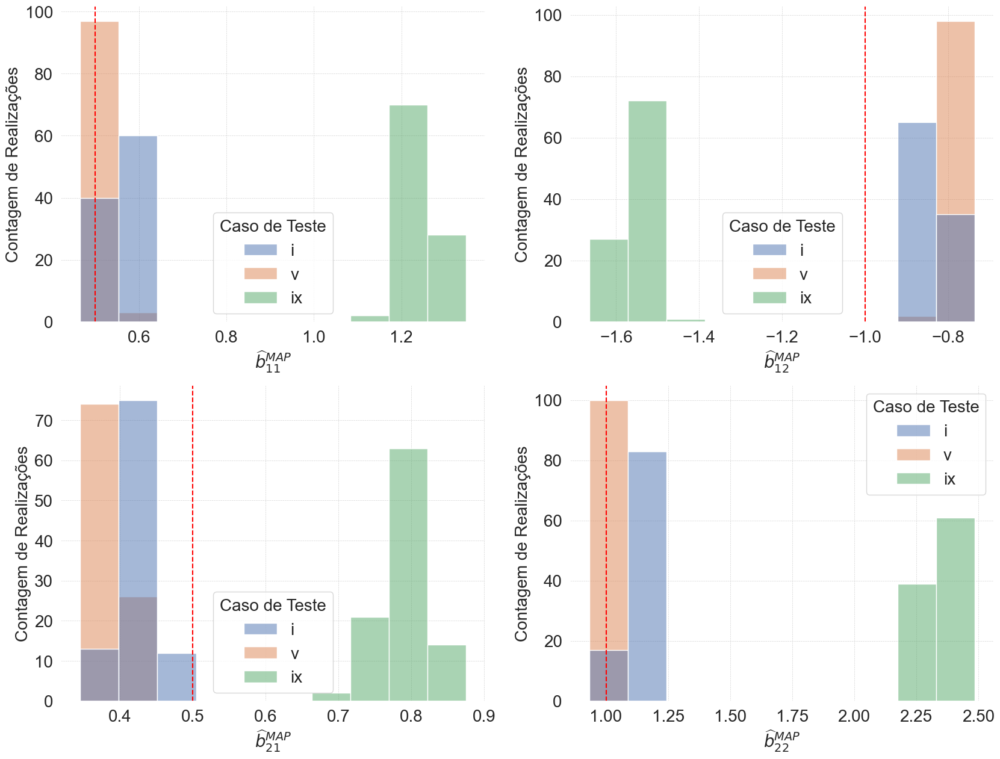

In [59]:
#############################################
# PRIOR UNIFORME: CASOS DE TESTE i, v, e ix #
#############################################

EstimationGraphPlotter.plot_test_cases_map_coefficient_estimates(
    parser=parser,
    test_cases=['i','v','ix'],
    B_true=parser.execution_config['general']['B']
)

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,ii,0.493253,-1.009502,0.501335,0.985213,0.045862,0.084453,0.043651,0.083208
1,vi,0.441063,-0.930999,0.460780,0.882493,0.042927,0.075686,0.037793,0.077509
2,x,1.288131,-0.694462,0.336115,2.577207,0.443882,1.039721,0.516348,0.871912


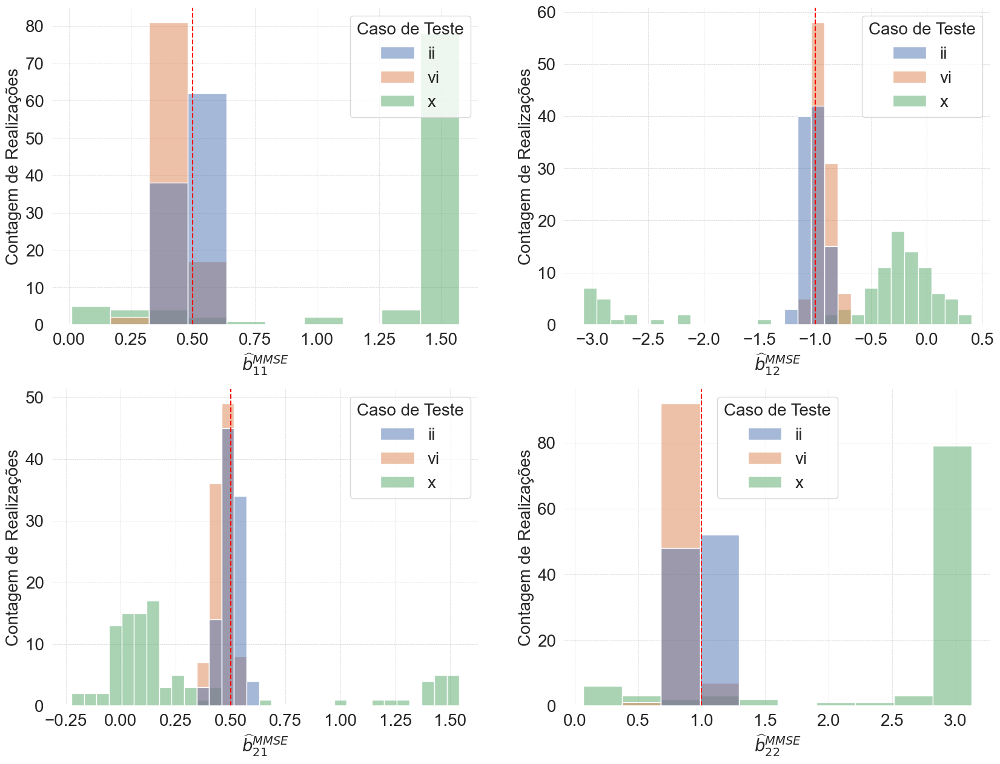

In [60]:
#################################################################
# PRIOR CORRETA E POUCO INFORMATIVA: CASOS DE TESTE ii, vi, e x #
#################################################################
EstimationGraphPlotter.plot_test_cases_mmse_coefficient_estimates(
    parser=parser,
    test_cases=['ii','vi','x'],
    B_true=parser.execution_config['general']['B']
)

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,iii,0.555325,-0.855727,0.431536,1.103302,0.022526,0.032320,0.024562,0.024661
1,vii,0.506080,-0.791030,0.391997,1.013864,0.023021,0.028326,0.024308,0.025084
2,xi,1.192513,-1.375053,0.776511,1.990613,0.025814,0.021604,0.022460,0.025606


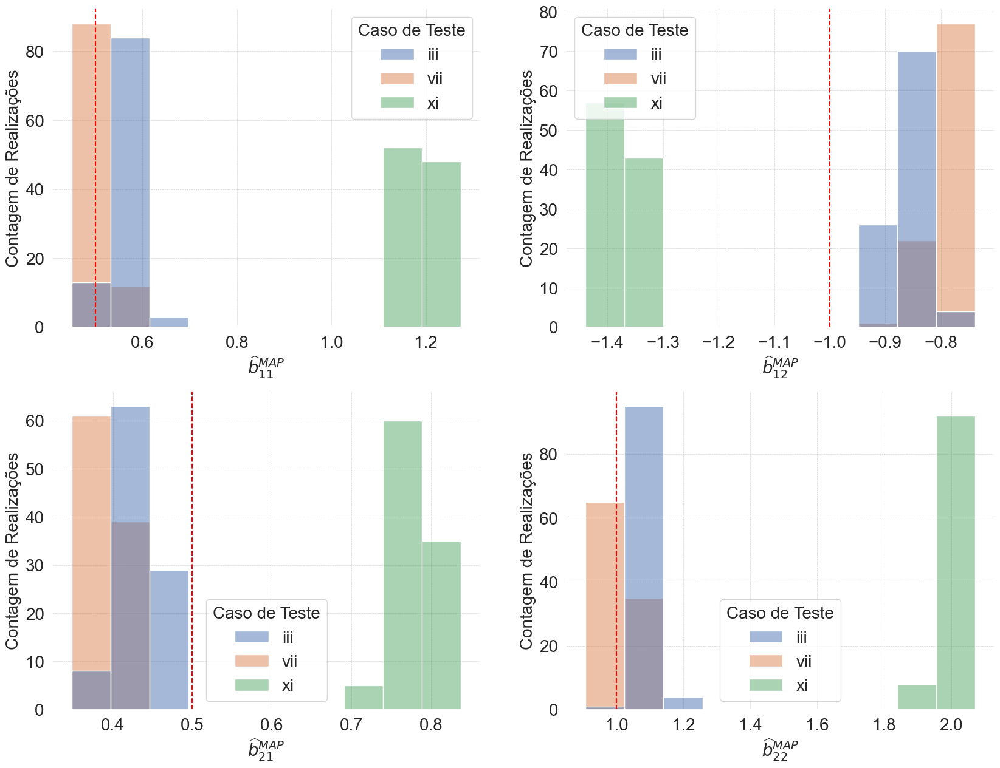

In [61]:
##############################################################
# PRIOR CORRETA E INFORMATIVA: CASOS DE TESTE iii, vii, e xi #
##############################################################
EstimationGraphPlotter.plot_test_cases_map_coefficient_estimates(
    parser=parser,
    test_cases=['iii','vii','xi'],
    B_true=parser.execution_config['general']['B']
)

,test_case,b11_mean,b12_mean,b21_mean,b22_mean,b11_std,b12_std,b21_std,b22_std
0,iv,0.580223,-0.807357,0.396711,1.083483,0.017694,0.013182,0.017430,0.017312
1,viii,0.528097,-0.768187,0.368044,1.022528,0.017322,0.013914,0.016490,0.014770
2,xii,1.196862,-1.280204,0.743364,1.915643,0.024053,0.017963,0.020116,0.022796


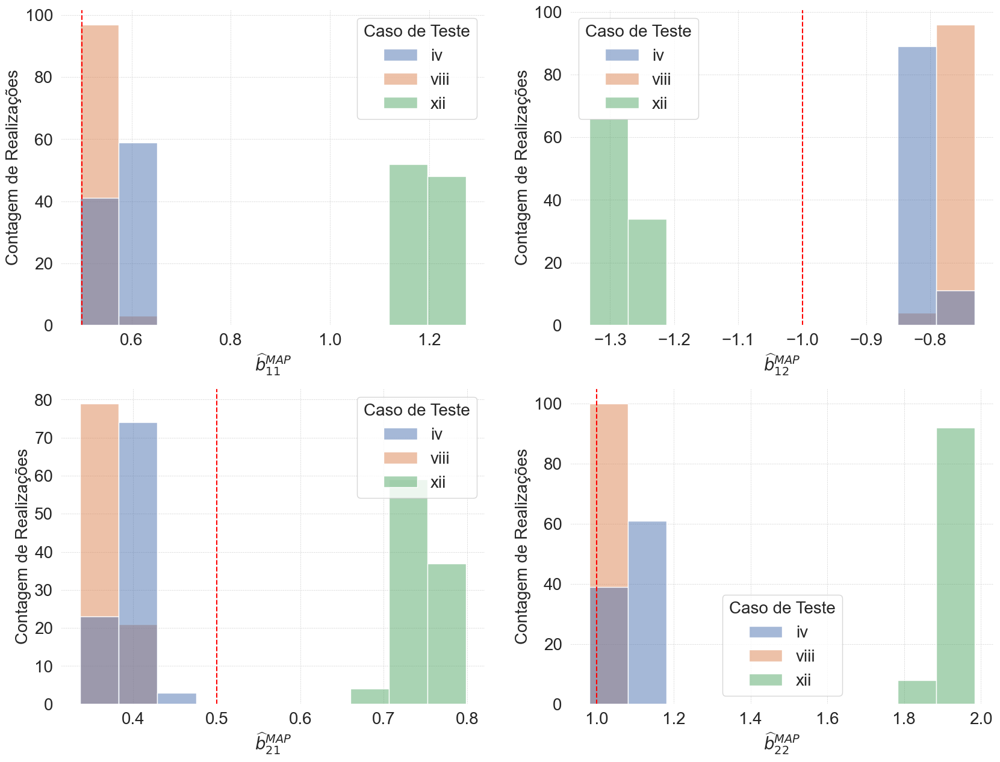

In [62]:
#################################################################
# PRIOR INCORRETA E INFORMATIVA: CASOS DE TESTE iv, viii, e xii #
#################################################################
EstimationGraphPlotter.plot_test_cases_map_coefficient_estimates(
    parser=parser,
    test_cases=['iv','viii','xii'],
    B_true=parser.execution_config['general']['B']
)

## 2.3. Erros MAP

### Mesmo modelo

,test_case,errors_mean,errors_min,errors_max,errors_std
0,i,0.138165,0.102097,0.162035,0.014002
1,ii,0.138135,0.102048,0.162006,0.014008
2,iii,0.127861,0.072631,0.159167,0.021071
3,iv,0.157698,0.142206,0.171560,0.006116


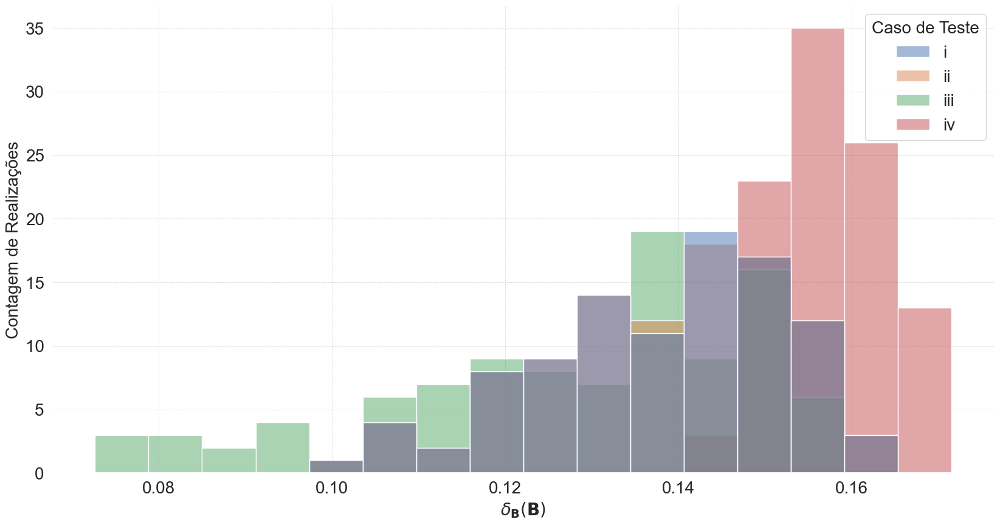

In [63]:
##########################################################
# ESPECIFICAÇÃO PERFEITA: CASOS DE TESTE i, ii, iii e iv #
##########################################################

EstimationGraphPlotter.plot_test_cases_map_errors(
    parser=parser,
    test_cases=['i','ii','iii','iv'],
    save_dir=SAVE_DIR,
    save_name='erros_map_i_iv'
)

,test_case,errors_mean,errors_min,errors_max,errors_std
0,v,0.160428,0.109887,0.182159,0.012226
1,vi,0.160406,0.109842,0.182141,0.012231
2,vii,0.151155,0.086908,0.180297,0.019791
3,viii,0.171245,0.155818,0.187321,0.006629


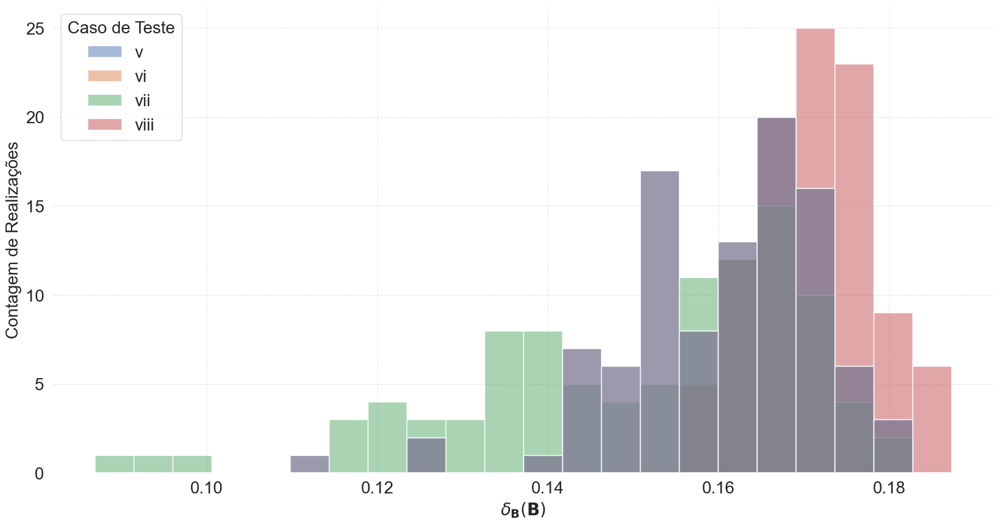

In [64]:
###################################################################
# ESPECIFICAÇÃO MUITO INCORRETA: CASOS DE TESTE v, vi, vii e viii #
###################################################################

EstimationGraphPlotter.plot_test_cases_map_errors(
    parser=parser,
    test_cases=['v','vi','vii','viii'],
    save_dir=SAVE_DIR,
    save_name='erros_map_v_viii'
)

,test_case,errors_mean,errors_min,errors_max,errors_std
0,ix,1.049202,0.976248,1.139099,0.029084
1,x,1.048892,0.975988,1.138736,0.029067
2,xi,0.819674,0.782491,0.862736,0.015813
3,xii,0.765002,0.731083,0.801980,0.014166


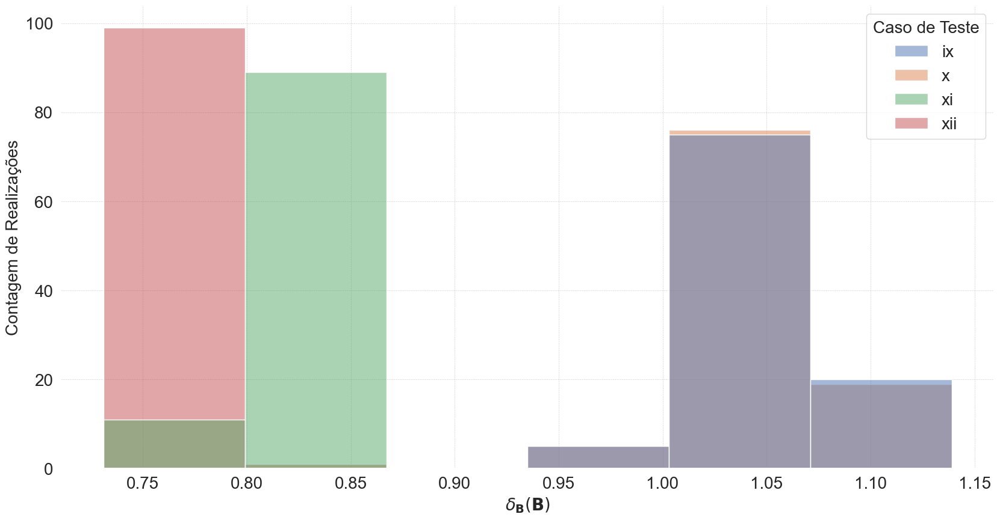

In [65]:
#################################################################
# ESPECIFICAÇÃO MUITO INCORRETA: CASOS DE TESTE ix, x, xi e xii #
#################################################################

EstimationGraphPlotter.plot_test_cases_map_errors(
    parser=parser,
    test_cases=['ix','x','xi','xii'],
    save_dir=SAVE_DIR,
    save_name='erros_map_ix_xii'
)

### Mesma prior

,test_case,errors_mean,errors_min,errors_max,errors_std
0,i,0.138165,0.102097,0.162035,0.014002
1,ix,1.049202,0.976248,1.139099,0.029084
2,v,0.160428,0.109887,0.182159,0.012226


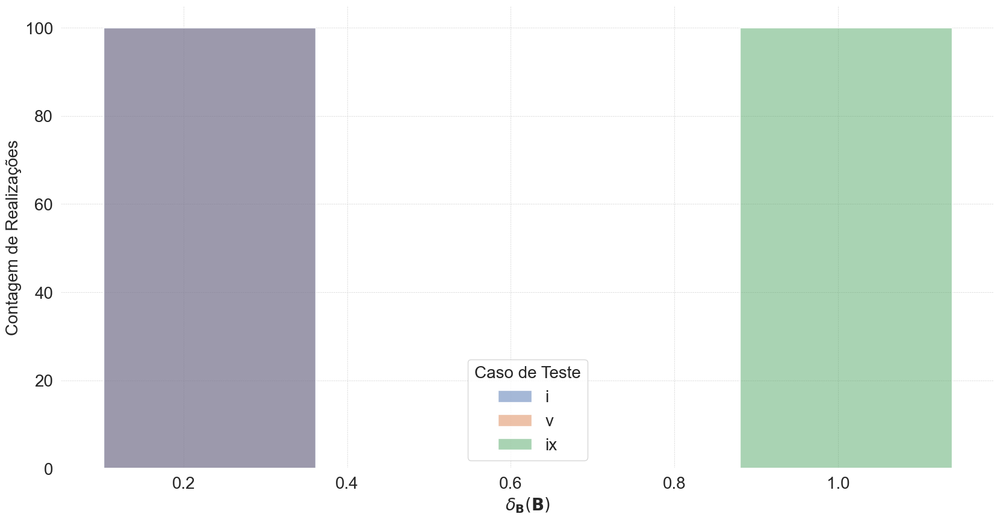

In [66]:
#############################################
# PRIOR UNIFORME: CASOS DE TESTE i, v, e ix #
#############################################

EstimationGraphPlotter.plot_test_cases_map_errors(
    parser=parser,
    test_cases=['i','v','ix']
)

,test_case,errors_mean,errors_min,errors_max,errors_std
0,ii,0.138135,0.102048,0.162006,0.014008
1,vi,0.160406,0.109842,0.182141,0.012231
2,x,1.048892,0.975988,1.138736,0.029067


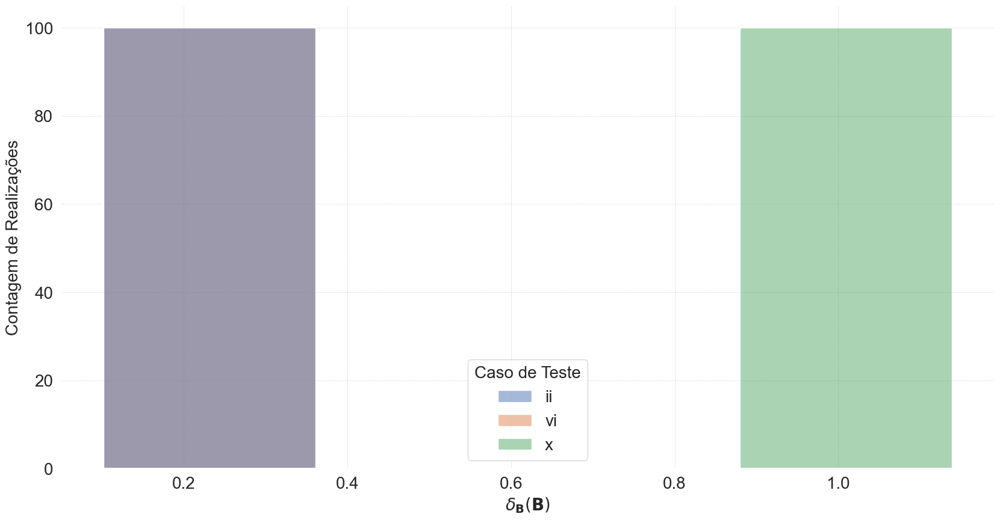

In [67]:
#################################################################
# PRIOR CORRETA E POUCO INFORMATIVA: CASOS DE TESTE ii, vi, e x #
#################################################################

EstimationGraphPlotter.plot_test_cases_map_errors(
    parser=parser,
    test_cases=['ii','vi','x']
)

,test_case,errors_mean,errors_min,errors_max,errors_std
0,iii,0.127861,0.072631,0.159167,0.021071
1,vii,0.151155,0.086908,0.180297,0.019791
2,xi,0.819674,0.782491,0.862736,0.015813


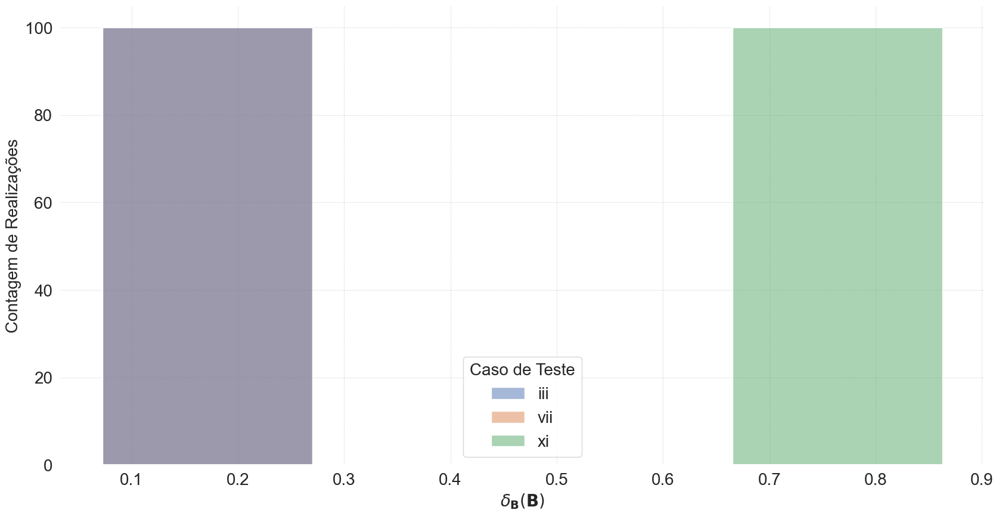

In [68]:
##############################################################
# PRIOR CORRETA E INFORMATIVA: CASOS DE TESTE iii, vii, e xi #
##############################################################

EstimationGraphPlotter.plot_test_cases_map_errors(
    parser=parser,
    test_cases=['iii','vii','xi']
)

,test_case,errors_mean,errors_min,errors_max,errors_std
0,iv,0.157698,0.142206,0.171560,0.006116
1,viii,0.171245,0.155818,0.187321,0.006629
2,xii,0.765002,0.731083,0.801980,0.014166


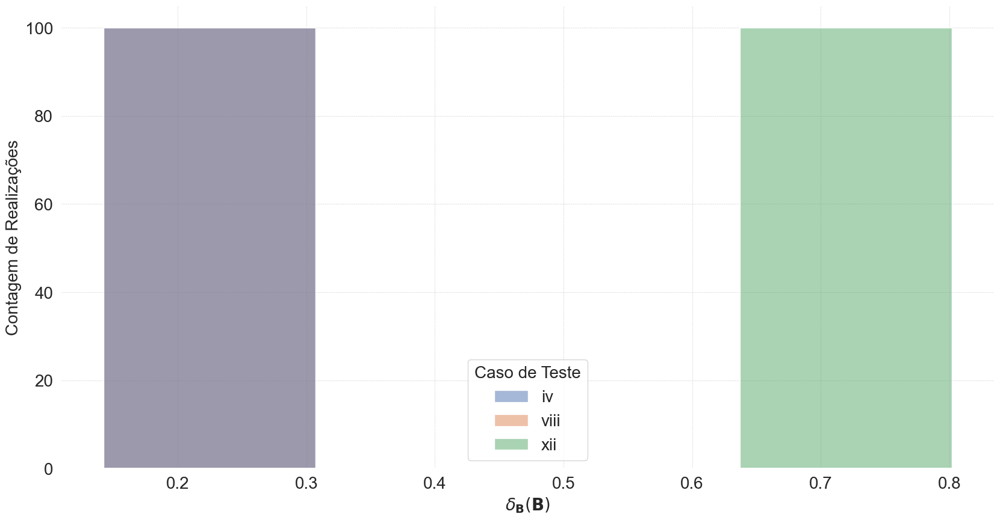

In [69]:
#################################################################
# PRIOR INCORRETA E INFORMATIVA: CASOS DE TESTE iv, viii, e xii #
#################################################################

EstimationGraphPlotter.plot_test_cases_map_errors(
    parser=parser,
    test_cases=['iv','viii','xii']
)

# 3. Análises - casos de teste individuais    

In [70]:
# def plot_2D_contours(
#     u_vec,
#     v_vec,
#     z,
#     max_us,
#     max_vs,
#     N=None,
#     posterior_step=0.1,
#     levels=200,
#     u_lims=(-0.3, 0.3),
#     v_lims=(-0.3, 0.3),
#     save_dir=None,
#     save_name=None,
#     label_size=30,
#     tick_size=30,
# ):

#     print('-'*100)
#     print('Normalized log-posterior (average)')
#     print('-'*100)

#     # Normalize posterior
#     if N is not None:
#         z = z/N

#     # Obtain max and min values for contours
#     max_post = np.max([
#         x for x in z.flatten() if x < np.inf
#     ])
#     min_post = np.min([
#         x for x in z.flatten() if x > -np.inf
#     ])

#     # Calculates contour levels based on specified posterior step
#     contour_level = max_post
#     levels = []
#     while contour_level > min_post:
#         contour_level -= posterior_step
#         levels.append(contour_level)

#     fig = plt.figure(figsize=(20,7))

#     U, V = np.meshgrid(u_vec, v_vec)
#     # import pdb; pdb.set_trace()
#     plt.contour(
#         U,
#         V,
#         z.T,
#         levels=np.flip(levels),
#         cmap='copper',
#         label='curva media'
#     )
    
#     plt.scatter(
#         max_us,
#         max_vs,
#         marker='X',
#         color='red',
#         label='pontos max'
#     )
    
#     plt.xlabel(
#         'u',
#         fontsize=label_size
#     )
#     plt.ylabel(
#         'v',
#         fontsize=label_size
#     )
#     if u_lims is not None:
#         plt.xlim(u_lims)
#     if v_lims is not None:
#         plt.ylim(v_lims)

#     plt.xticks(
#         np.append(
#             np.arange(u_lims[0], u_lims[-1],0.1),
#             u_lims[-1]
#         ),
#         fontsize=tick_size
#     )
#     plt.yticks(
#         np.append(
#             np.arange(v_lims[0], v_lims[-1],0.1),
#             v_lims[-1]
#         ),
#         fontsize=tick_size
#     )
#     # plt.legend(
#     #     loc='upper right',
#     #     fontsize=15
#     # )

#     # Save figure, if so specified
#     if save_dir is not None:
#         fig.savefig(
#             str(
#                 (save_dir / '{}.png'.format(save_name if save_name is not None else 'contour'))
#             ),
#             bbox_inches='tight'
#         )

#     # if save_dir is not None:
#     #     fig.savefig(
#     #         str(
#     #             (save_dir / 'contour_lines.png')
#     #         )
#     #     )
    
#     # if save_dir is not None:
#     #     fig.savefig(
#     #         str(
#     #             (save_dir / 'steady_state_marginal_distributions.png')

In [71]:
CONTOUR_POSTERIOR_STEP=0.02

## i.

In [72]:
test_case='i'

### Posterior contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (average)
----------------------------------------------------------------------------------------------------


/Users/leonardo.tessarolo/git/bayesian_bss/src/utilities.py:1611: UserWarning: The following kwargs were not used by contour: 'label'
  plt.contour(


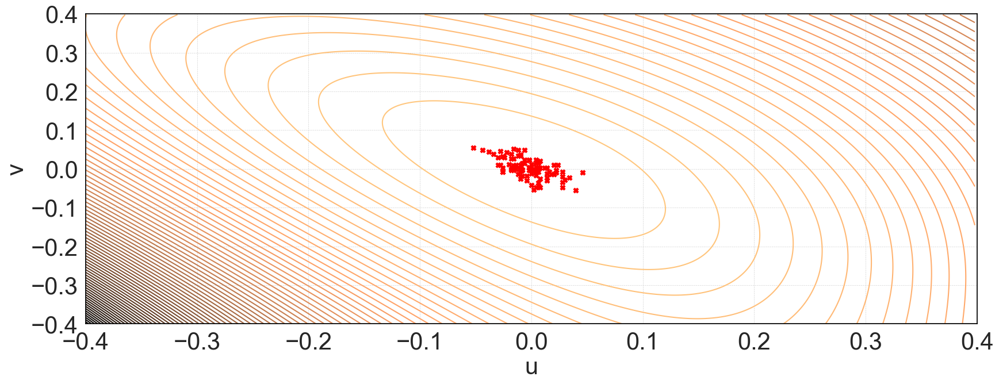

In [73]:
EstimationGraphPlotter.plot_2D_contours(
    u_vec=parser.parsed_results[test_case]['posteriori_grid']['u_vec'],
    v_vec=parser.parsed_results[test_case]['posteriori_grid']['v_vec'],
    z=parser.parsed_results[test_case]['posteriori_grid']['average_grid'],
    max_us=parser.parsed_results[test_case]['posteriori_grid']['u_max'],
    max_vs=parser.parsed_results[test_case]['posteriori_grid']['v_max'],
    N=parser.execution_config['general']['n_obs'],
    posterior_step=CONTOUR_POSTERIOR_STEP,
    save_dir=posterior_contour_dir,
    save_name='{}_curva_nivel'.format(test_case)

)

### MMSE estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


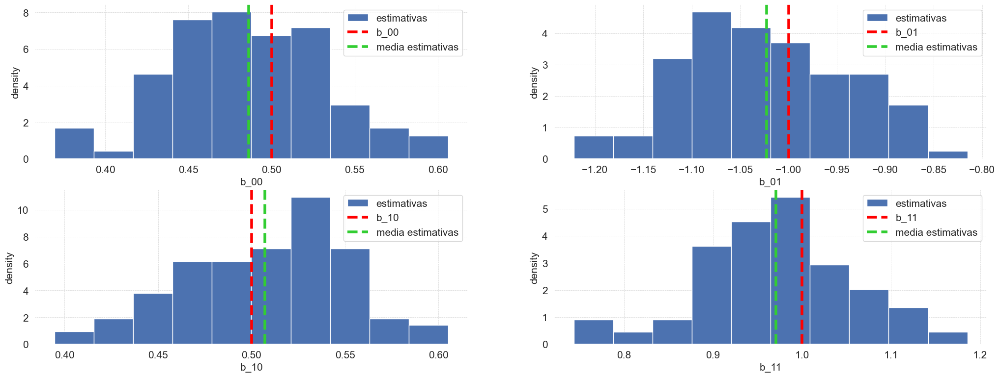

In [74]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['mmse']['b11_estimates'],
        parser.parsed_results[test_case]['mmse']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['mmse']['b21_estimates'],
        parser.parsed_results[test_case]['mmse']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MMSE estimation errors

####################################################################################################
Mean error: 0.08
Max error: 0.23
Min error: 0.01
####################################################################################################


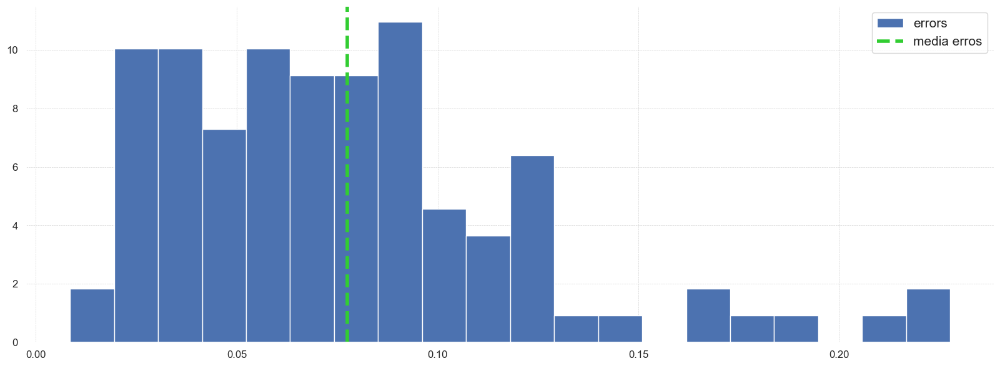

In [75]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['mmse']['errors'],
    nbins=20
)

### MAP estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


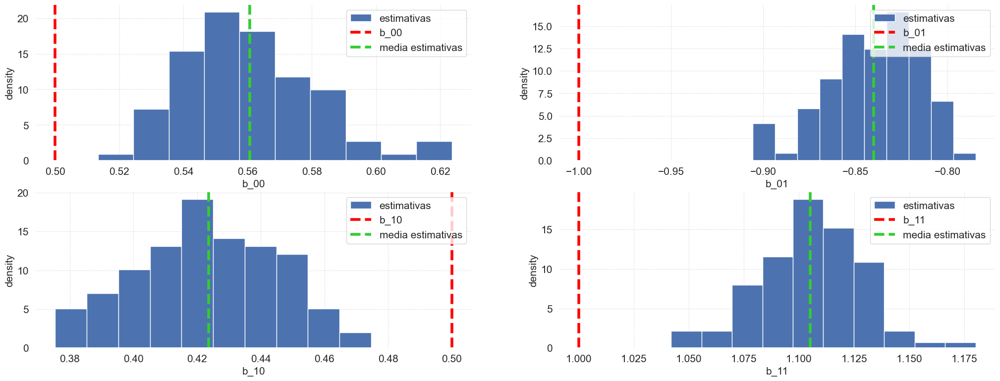

In [76]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['map']['b11_estimates'],
        parser.parsed_results[test_case]['map']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['map']['b21_estimates'],
        parser.parsed_results[test_case]['map']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MAP estimation errors

####################################################################################################
Mean error: 0.14
Max error: 0.16
Min error: 0.1
####################################################################################################


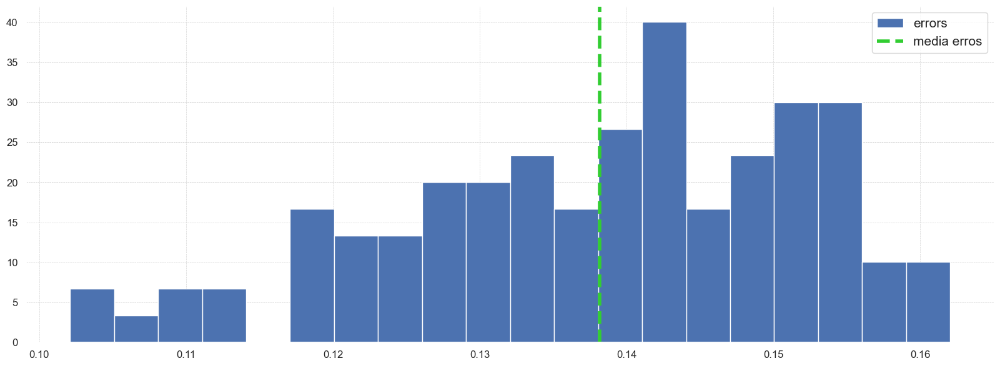

In [77]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['map']['errors'],
    nbins=20
)

## ii.

In [78]:
test_case='ii'

### Posterior contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (average)
----------------------------------------------------------------------------------------------------


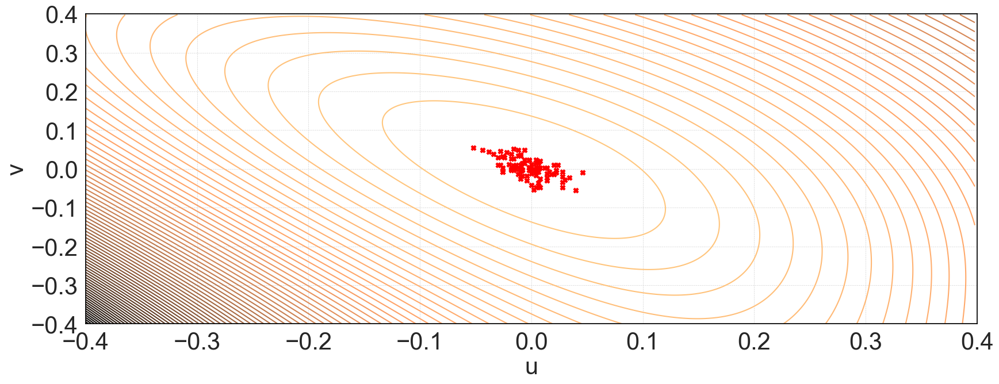

In [79]:
EstimationGraphPlotter.plot_2D_contours(
    u_vec=parser.parsed_results[test_case]['posteriori_grid']['u_vec'],
    v_vec=parser.parsed_results[test_case]['posteriori_grid']['v_vec'],
    z=parser.parsed_results[test_case]['posteriori_grid']['average_grid'],
    max_us=parser.parsed_results[test_case]['posteriori_grid']['u_max'],
    max_vs=parser.parsed_results[test_case]['posteriori_grid']['v_max'],
    N=parser.execution_config['general']['n_obs'],
    posterior_step=CONTOUR_POSTERIOR_STEP,
    save_dir=posterior_contour_dir,
    save_name='{}_curva_nivel'.format(test_case)
)

### MMSE estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


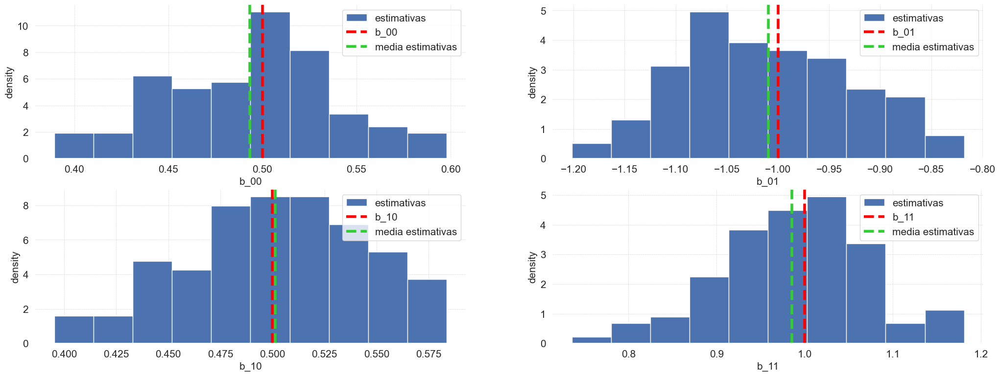

In [80]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['mmse']['b11_estimates'],
        parser.parsed_results[test_case]['mmse']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['mmse']['b21_estimates'],
        parser.parsed_results[test_case]['mmse']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MMSE estimation errors

####################################################################################################
Mean error: 0.07
Max error: 0.23
Min error: 0.01
####################################################################################################


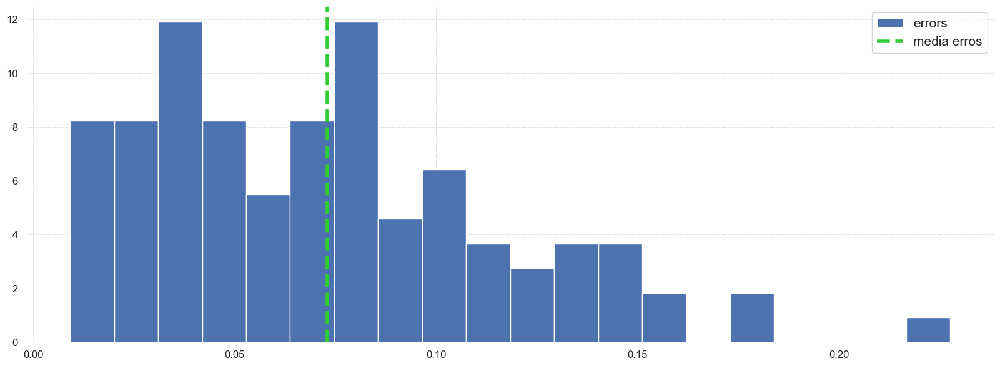

In [81]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['mmse']['errors'],
    nbins=20
)

### MAP estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


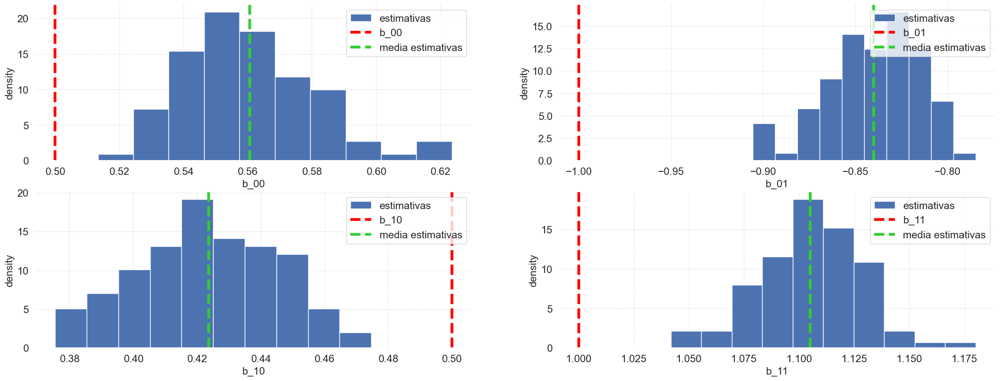

In [82]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['map']['b11_estimates'],
        parser.parsed_results[test_case]['map']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['map']['b21_estimates'],
        parser.parsed_results[test_case]['map']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MAP estimation errors

####################################################################################################
Mean error: 0.14
Max error: 0.16
Min error: 0.1
####################################################################################################


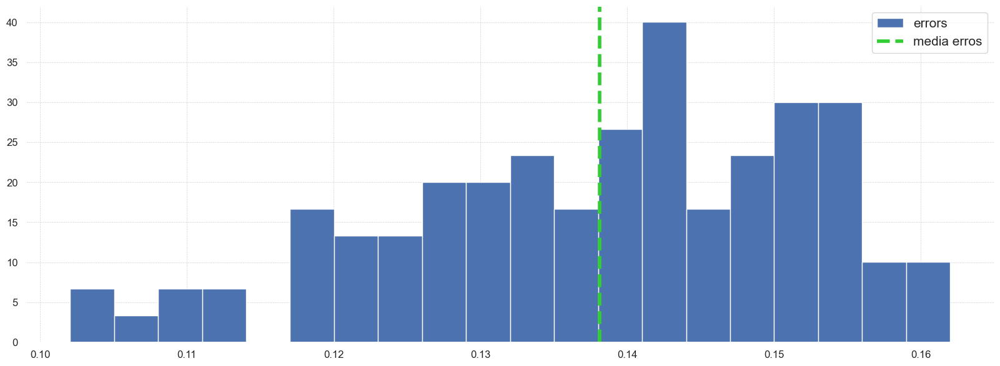

In [83]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['map']['errors'],
    nbins=20
)

## iii.

In [84]:
test_case='iii'

### Posterior contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (average)
----------------------------------------------------------------------------------------------------


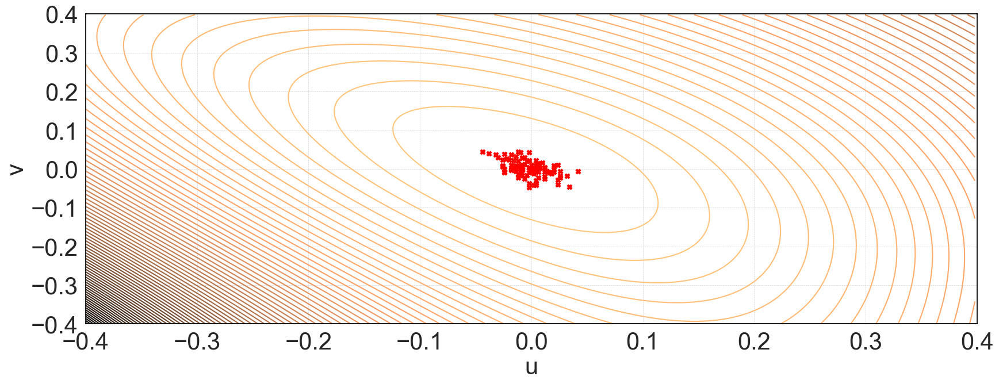

In [85]:
EstimationGraphPlotter.plot_2D_contours(
    u_vec=parser.parsed_results[test_case]['posteriori_grid']['u_vec'],
    v_vec=parser.parsed_results[test_case]['posteriori_grid']['v_vec'],
    z=parser.parsed_results[test_case]['posteriori_grid']['average_grid'],
    max_us=parser.parsed_results[test_case]['posteriori_grid']['u_max'],
    max_vs=parser.parsed_results[test_case]['posteriori_grid']['v_max'],
    N=parser.execution_config['general']['n_obs'],
    posterior_step=CONTOUR_POSTERIOR_STEP,
    save_dir=posterior_contour_dir,
    save_name='{}_curva_nivel'.format(test_case)
)

### MMSE estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


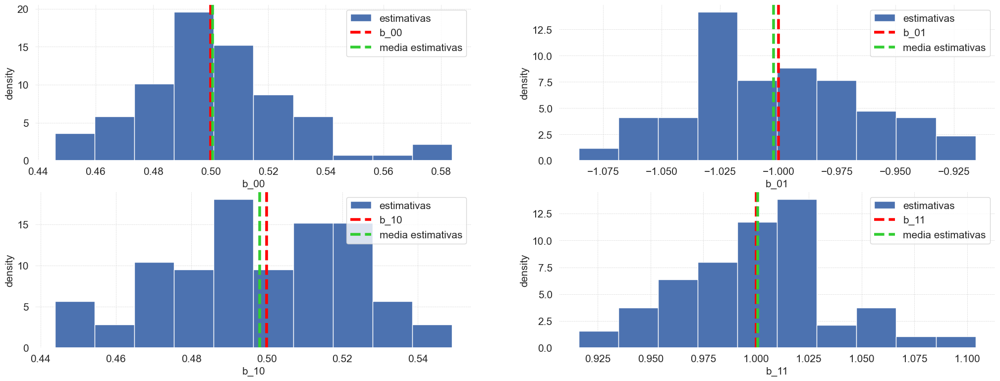

In [86]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['mmse']['b11_estimates'],
        parser.parsed_results[test_case]['mmse']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['mmse']['b21_estimates'],
        parser.parsed_results[test_case]['mmse']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MMSE estimation errors

####################################################################################################
Mean error: 0.04
Max error: 0.07
Min error: 0.0
####################################################################################################


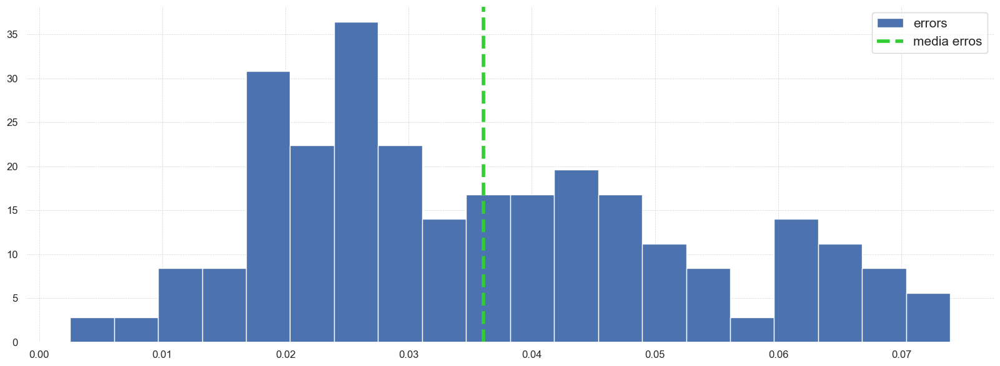

In [87]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['mmse']['errors'],
    nbins=20
)

### MAP estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


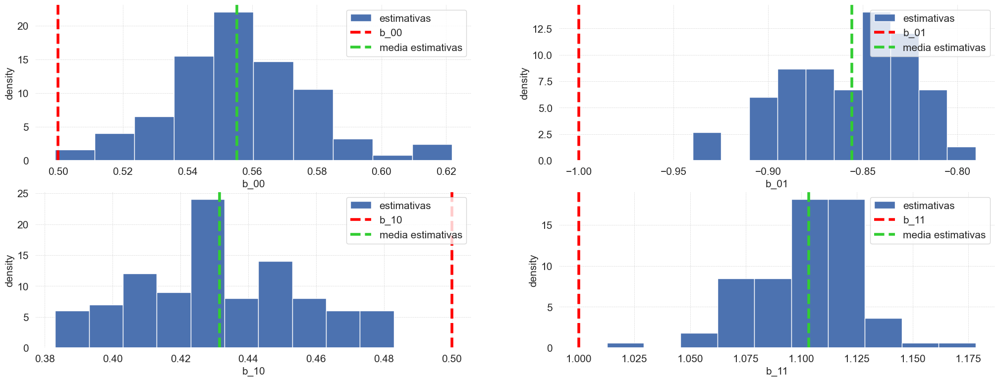

In [88]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['map']['b11_estimates'],
        parser.parsed_results[test_case]['map']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['map']['b21_estimates'],
        parser.parsed_results[test_case]['map']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MAP estimation errors

####################################################################################################
Mean error: 0.13
Max error: 0.16
Min error: 0.07
####################################################################################################


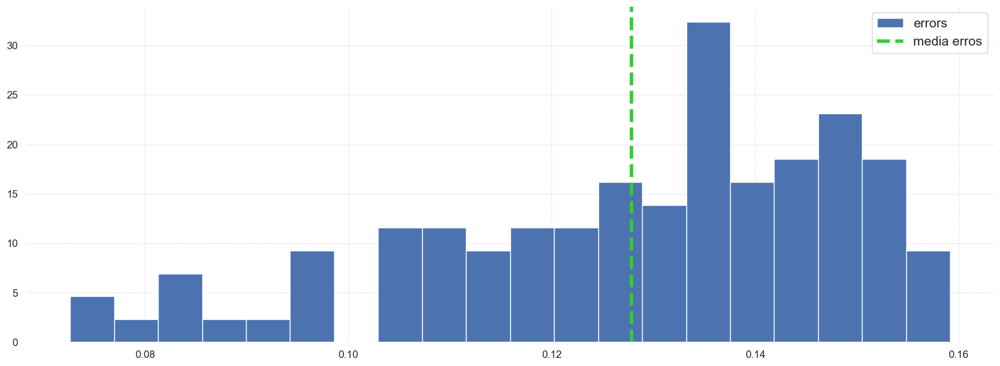

In [89]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['map']['errors'],
    nbins=20
)

## iv.

In [90]:
test_case='iv'

### Posterior contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (average)
----------------------------------------------------------------------------------------------------


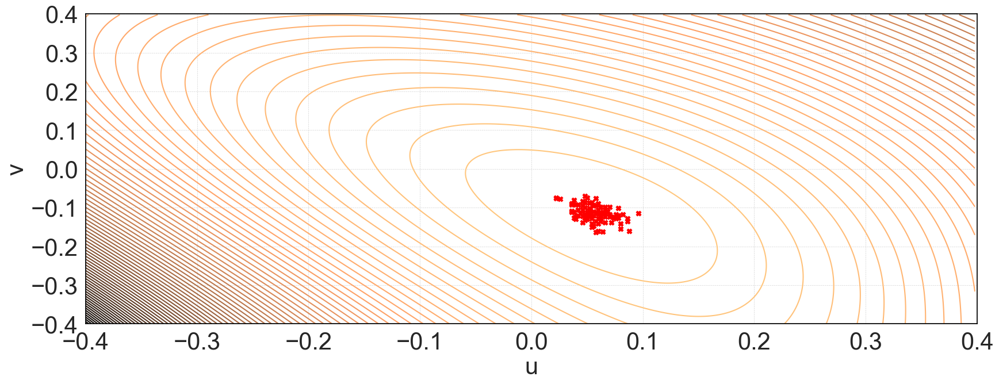

In [91]:
EstimationGraphPlotter.plot_2D_contours(
    u_vec=parser.parsed_results[test_case]['posteriori_grid']['u_vec'],
    v_vec=parser.parsed_results[test_case]['posteriori_grid']['v_vec'],
    z=parser.parsed_results[test_case]['posteriori_grid']['average_grid'],
    max_us=parser.parsed_results[test_case]['posteriori_grid']['u_max'],
    max_vs=parser.parsed_results[test_case]['posteriori_grid']['v_max'],
    N=parser.execution_config['general']['n_obs'],
    posterior_step=CONTOUR_POSTERIOR_STEP,
    save_dir=posterior_contour_dir,
    save_name='{}_curva_nivel'.format(test_case)
)

### MMSE estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


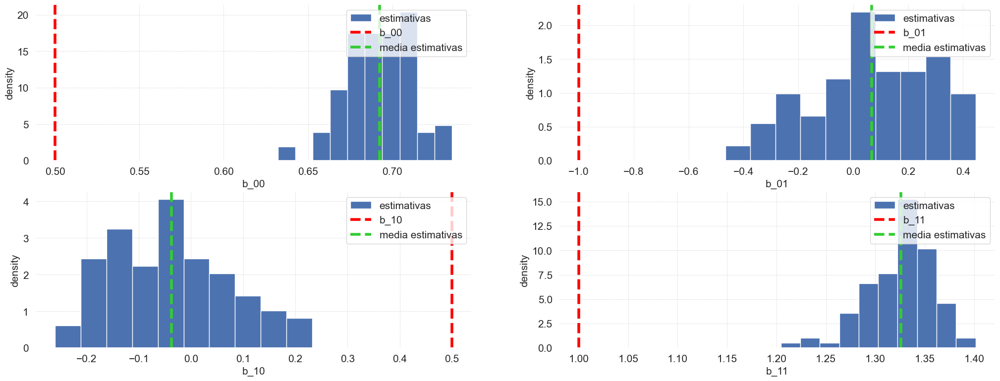

In [92]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['mmse']['b11_estimates'],
        parser.parsed_results[test_case]['mmse']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['mmse']['b21_estimates'],
        parser.parsed_results[test_case]['mmse']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MMSE estimation errors

####################################################################################################
Mean error: 0.79
Max error: 1.04
Min error: 0.43
####################################################################################################


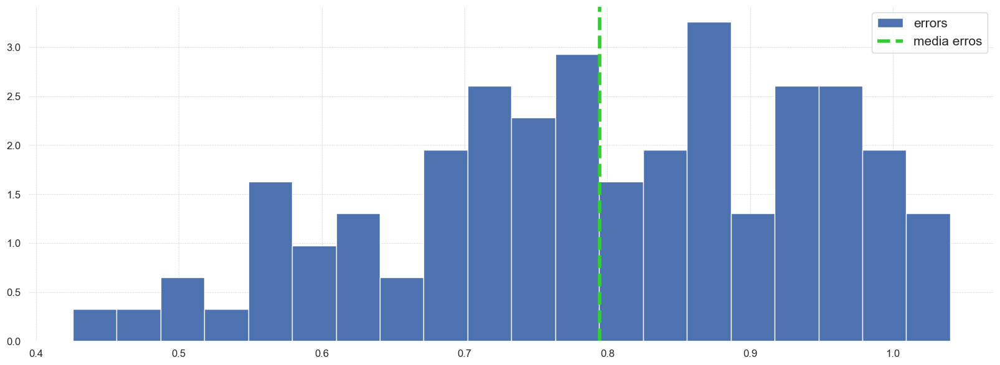

In [93]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['mmse']['errors'],
    nbins=20
)

### MAP estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


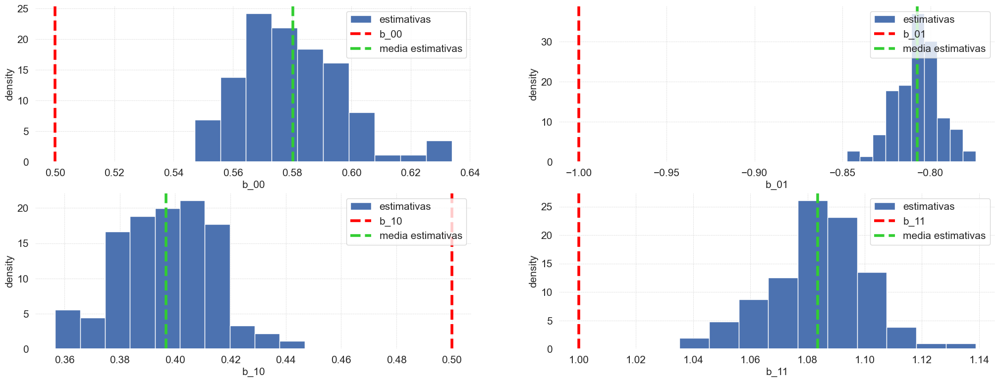

In [94]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['map']['b11_estimates'],
        parser.parsed_results[test_case]['map']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['map']['b21_estimates'],
        parser.parsed_results[test_case]['map']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MAP estimation errors

####################################################################################################
Mean error: 0.16
Max error: 0.17
Min error: 0.14
####################################################################################################


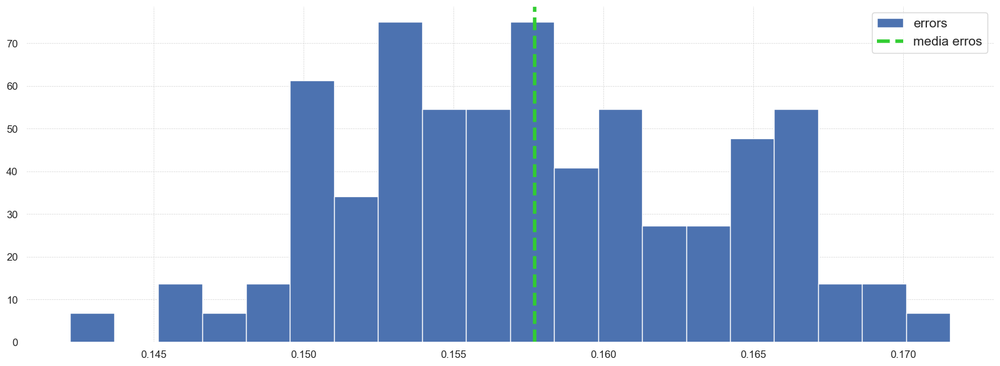

In [95]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['map']['errors'],
    nbins=20
)

## v.

In [96]:
test_case='v'

### Posterior contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (average)
----------------------------------------------------------------------------------------------------


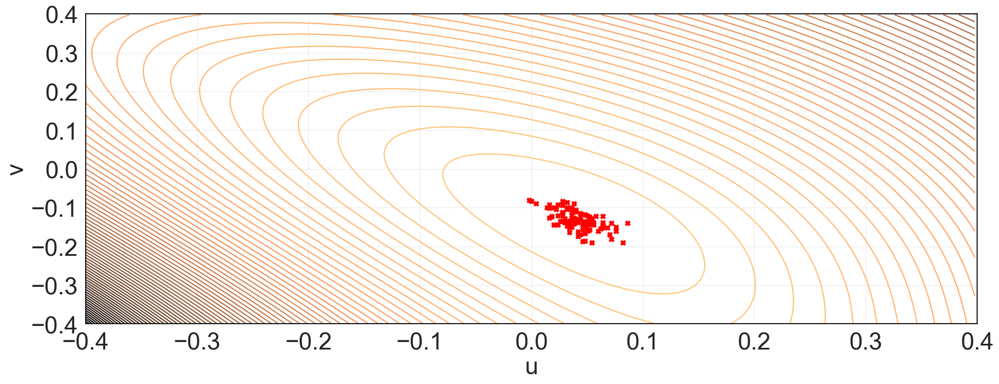

In [97]:
EstimationGraphPlotter.plot_2D_contours(
    u_vec=parser.parsed_results[test_case]['posteriori_grid']['u_vec'],
    v_vec=parser.parsed_results[test_case]['posteriori_grid']['v_vec'],
    z=parser.parsed_results[test_case]['posteriori_grid']['average_grid'],
    max_us=parser.parsed_results[test_case]['posteriori_grid']['u_max'],
    max_vs=parser.parsed_results[test_case]['posteriori_grid']['v_max'],
    N=parser.execution_config['general']['n_obs'],
    posterior_step=CONTOUR_POSTERIOR_STEP,
    save_dir=posterior_contour_dir,
    save_name='{}_curva_nivel'.format(test_case)
)

### MMSE estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


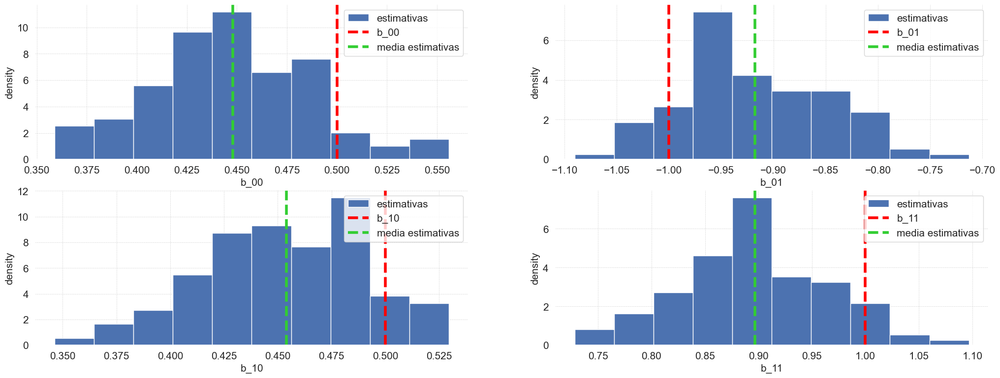

In [98]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['mmse']['b11_estimates'],
        parser.parsed_results[test_case]['mmse']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['mmse']['b21_estimates'],
        parser.parsed_results[test_case]['mmse']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MMSE estimation errors

####################################################################################################
Mean error: 0.12
Max error: 0.22
Min error: 0.06
####################################################################################################


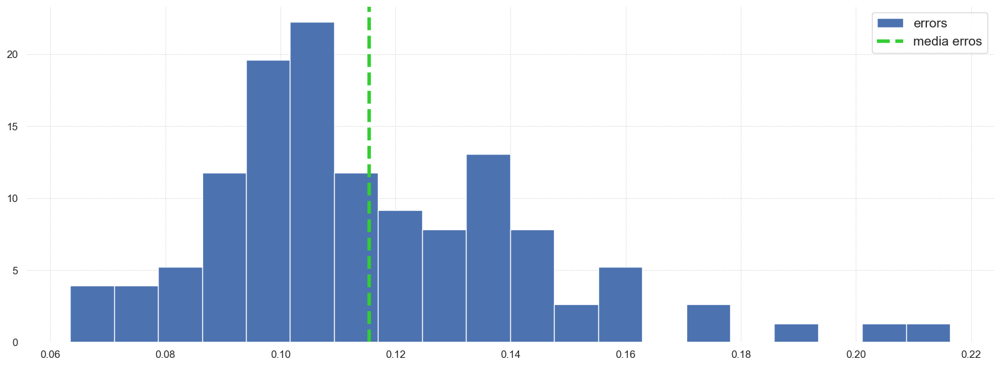

In [99]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['mmse']['errors'],
    nbins=20
)

### MAP estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


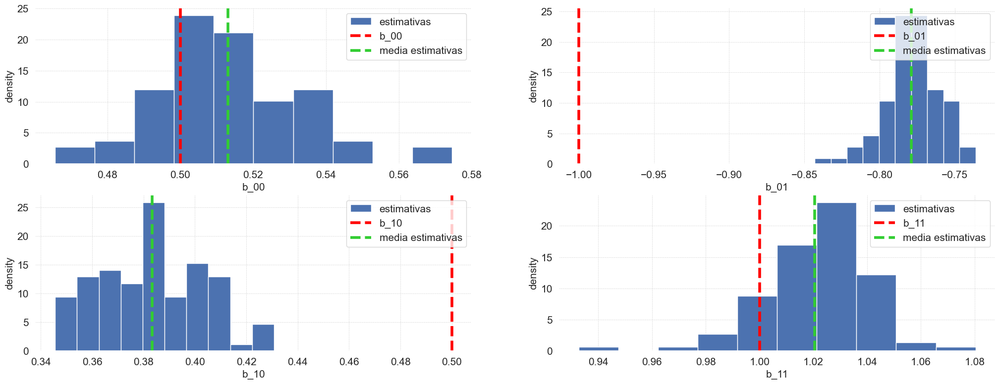

In [100]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['map']['b11_estimates'],
        parser.parsed_results[test_case]['map']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['map']['b21_estimates'],
        parser.parsed_results[test_case]['map']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MAP estimation errors

####################################################################################################
Mean error: 0.16
Max error: 0.18
Min error: 0.11
####################################################################################################


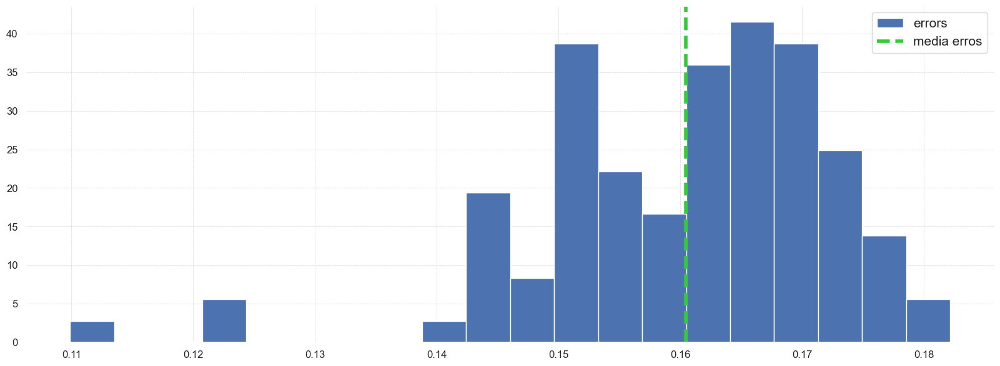

In [101]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['map']['errors'],
    nbins=20
)

## vi.

In [102]:
test_case='vi'

### Posterior contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (average)
----------------------------------------------------------------------------------------------------


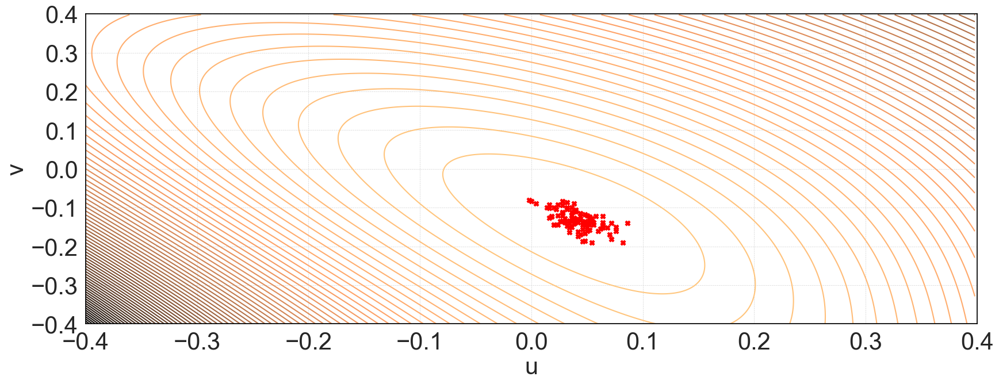

In [103]:
EstimationGraphPlotter.plot_2D_contours(
    u_vec=parser.parsed_results[test_case]['posteriori_grid']['u_vec'],
    v_vec=parser.parsed_results[test_case]['posteriori_grid']['v_vec'],
    z=parser.parsed_results[test_case]['posteriori_grid']['average_grid'],
    max_us=parser.parsed_results[test_case]['posteriori_grid']['u_max'],
    max_vs=parser.parsed_results[test_case]['posteriori_grid']['v_max'],
    N=parser.execution_config['general']['n_obs'],
    posterior_step=CONTOUR_POSTERIOR_STEP,
    save_dir=posterior_contour_dir,
    save_name='{}_curva_nivel'.format(test_case)
)

### MMSE estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


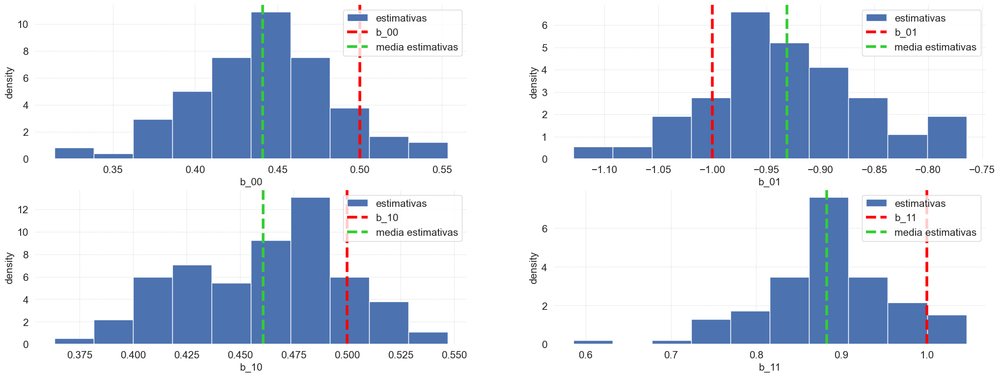

In [104]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['mmse']['b11_estimates'],
        parser.parsed_results[test_case]['mmse']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['mmse']['b21_estimates'],
        parser.parsed_results[test_case]['mmse']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MMSE estimation errors

####################################################################################################
Mean error: 0.12
Max error: 0.3
Min error: 0.06
####################################################################################################


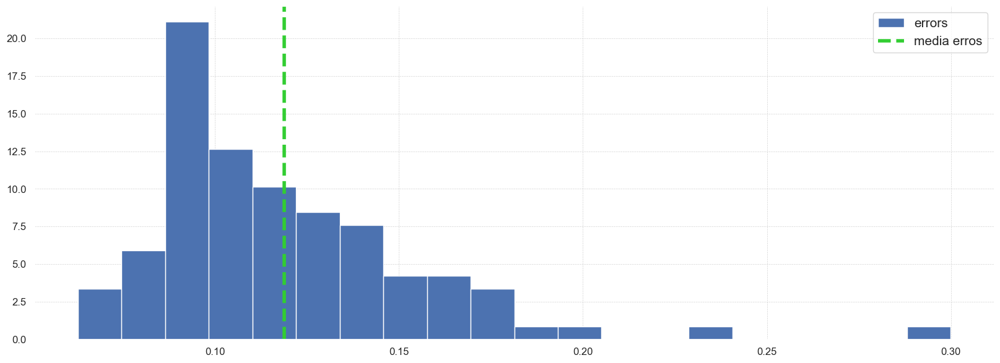

In [105]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['mmse']['errors'],
    nbins=20
)

### MAP estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


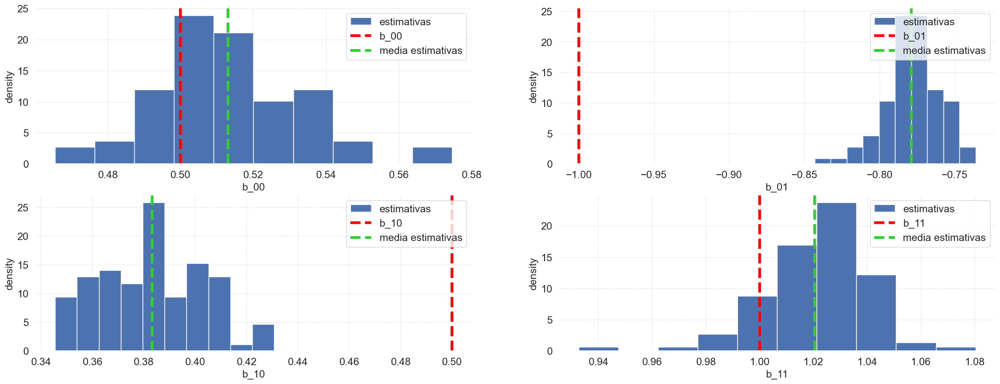

In [106]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['map']['b11_estimates'],
        parser.parsed_results[test_case]['map']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['map']['b21_estimates'],
        parser.parsed_results[test_case]['map']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MAP estimation errors

####################################################################################################
Mean error: 0.16
Max error: 0.18
Min error: 0.11
####################################################################################################


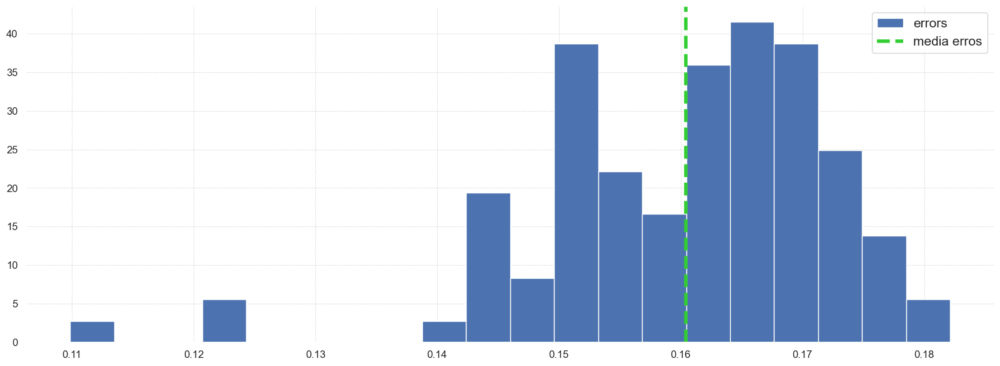

In [107]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['map']['errors'],
    nbins=20
)

## vii.

In [108]:
test_case='vii'

### Posterior contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (average)
----------------------------------------------------------------------------------------------------


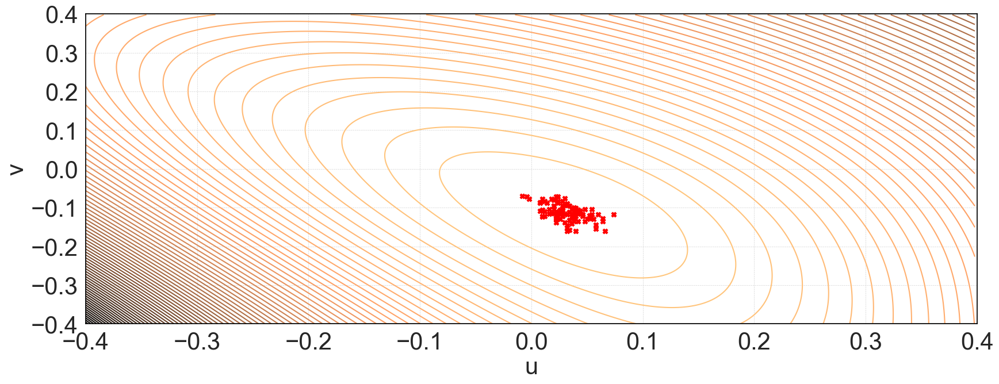

In [109]:
EstimationGraphPlotter.plot_2D_contours(
    u_vec=parser.parsed_results[test_case]['posteriori_grid']['u_vec'],
    v_vec=parser.parsed_results[test_case]['posteriori_grid']['v_vec'],
    z=parser.parsed_results[test_case]['posteriori_grid']['average_grid'],
    max_us=parser.parsed_results[test_case]['posteriori_grid']['u_max'],
    max_vs=parser.parsed_results[test_case]['posteriori_grid']['v_max'],
    N=parser.execution_config['general']['n_obs'],
    posterior_step=CONTOUR_POSTERIOR_STEP,
    save_dir=posterior_contour_dir,
    save_name='{}_curva_nivel'.format(test_case)
)

### MMSE estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


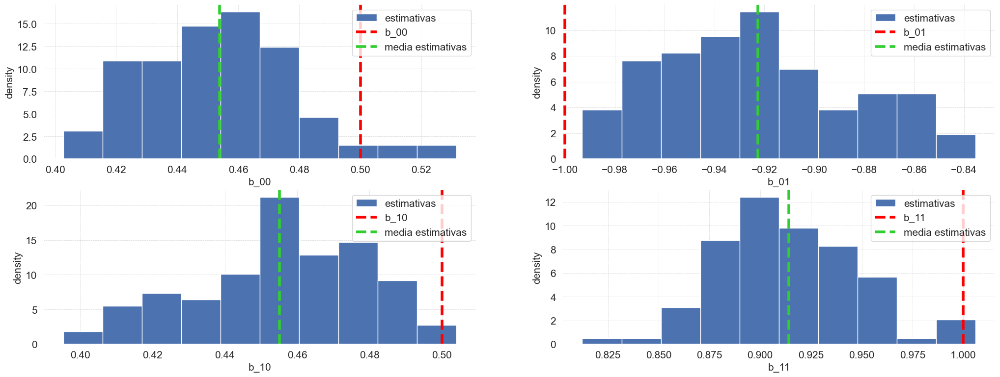

In [110]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['mmse']['b11_estimates'],
        parser.parsed_results[test_case]['mmse']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['mmse']['b21_estimates'],
        parser.parsed_results[test_case]['mmse']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MMSE estimation errors

####################################################################################################
Mean error: 0.09
Max error: 0.14
Min error: 0.05
####################################################################################################


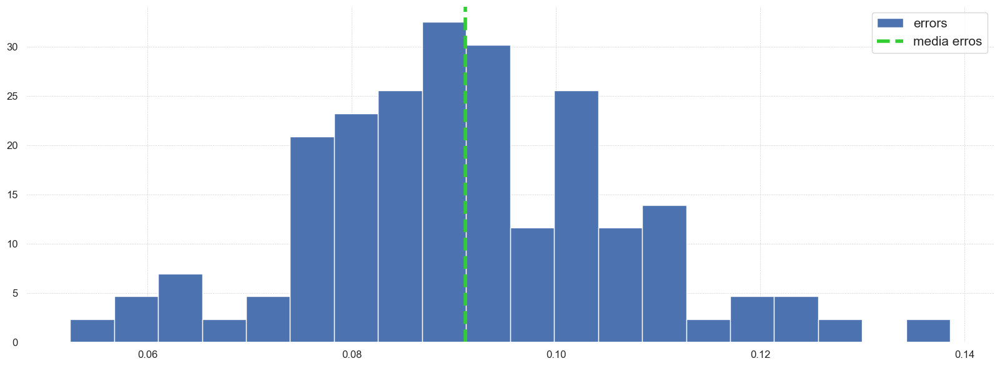

In [111]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['mmse']['errors'],
    nbins=20
)

### MAP estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


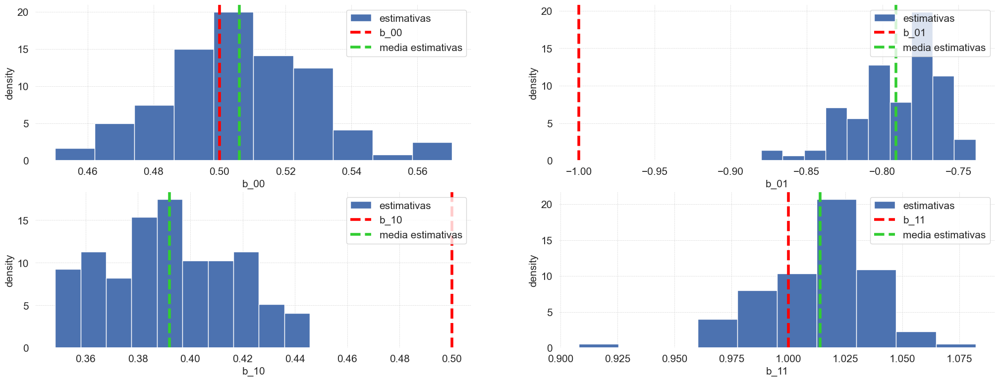

In [112]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['map']['b11_estimates'],
        parser.parsed_results[test_case]['map']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['map']['b21_estimates'],
        parser.parsed_results[test_case]['map']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MAP estimation errors

####################################################################################################
Mean error: 0.15
Max error: 0.18
Min error: 0.09
####################################################################################################


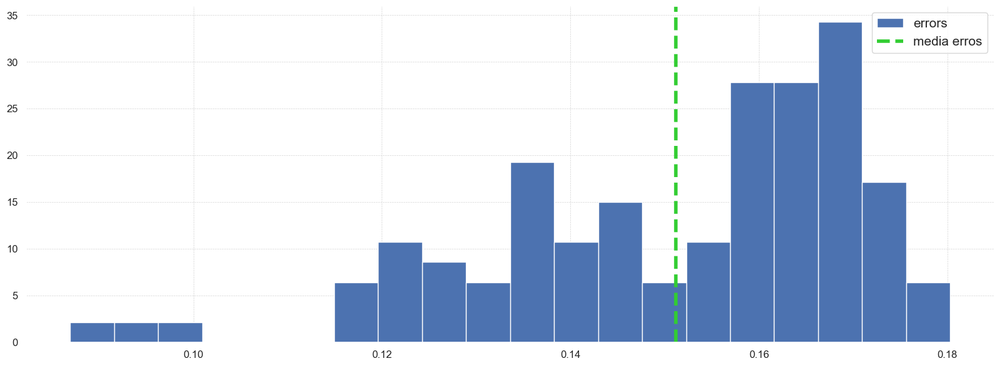

In [113]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['map']['errors'],
    nbins=20
)

## viii.

In [114]:
test_case='viii'

### Posterior contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (average)
----------------------------------------------------------------------------------------------------


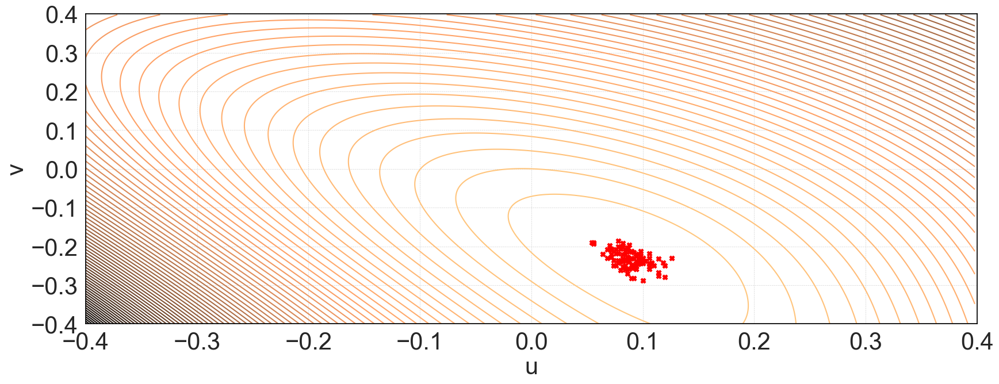

In [115]:
EstimationGraphPlotter.plot_2D_contours(
    u_vec=parser.parsed_results[test_case]['posteriori_grid']['u_vec'],
    v_vec=parser.parsed_results[test_case]['posteriori_grid']['v_vec'],
    z=parser.parsed_results[test_case]['posteriori_grid']['average_grid'],
    max_us=parser.parsed_results[test_case]['posteriori_grid']['u_max'],
    max_vs=parser.parsed_results[test_case]['posteriori_grid']['v_max'],
    N=parser.execution_config['general']['n_obs'],
    posterior_step=CONTOUR_POSTERIOR_STEP,
    save_dir=posterior_contour_dir,
    save_name='{}_curva_nivel'.format(test_case)
)

### MMSE estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


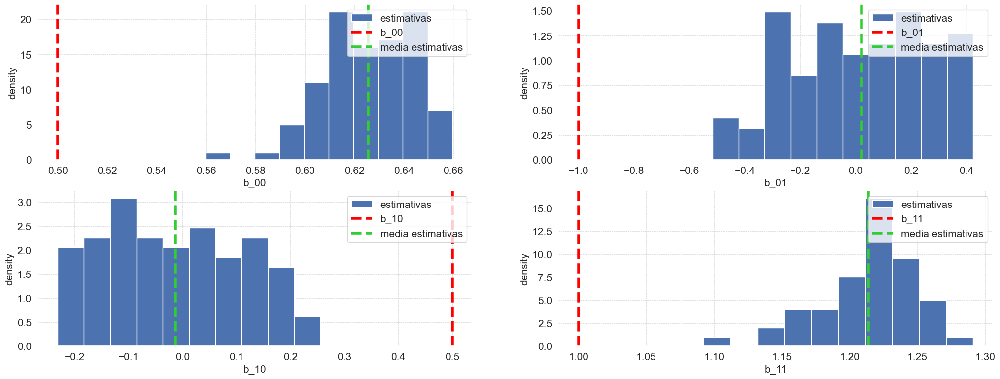

In [116]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['mmse']['b11_estimates'],
        parser.parsed_results[test_case]['mmse']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['mmse']['b21_estimates'],
        parser.parsed_results[test_case]['mmse']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MMSE estimation errors

####################################################################################################
Mean error: 0.74
Max error: 1.02
Min error: 0.35
####################################################################################################


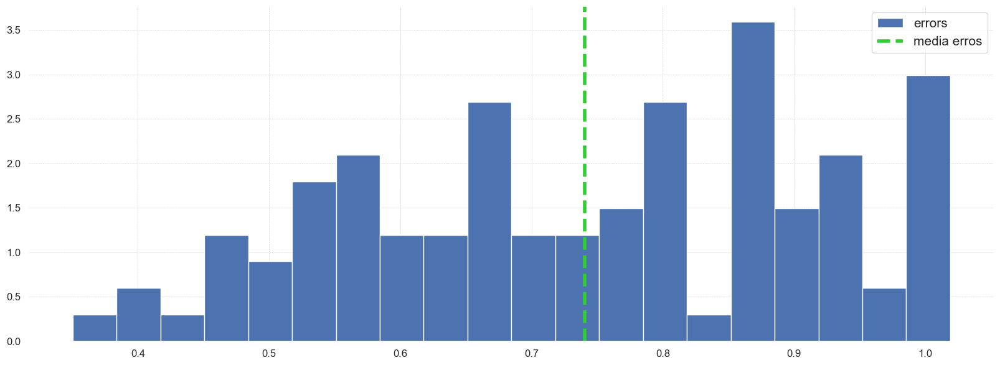

In [117]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['mmse']['errors'],
    nbins=20
)

### MAP estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


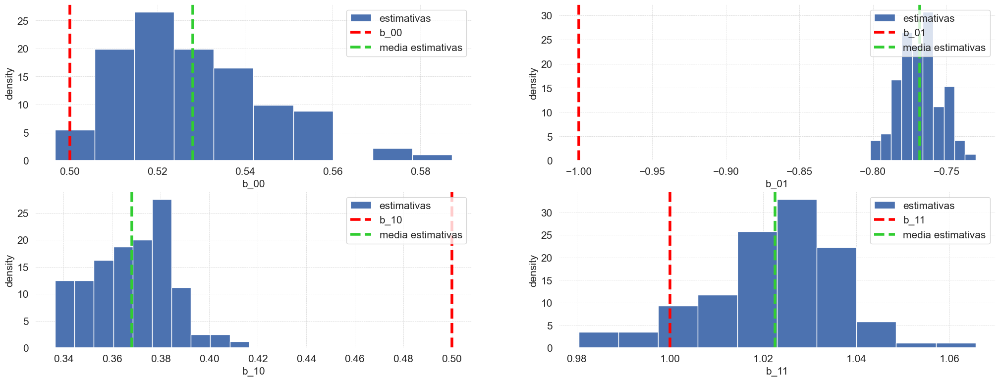

In [118]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['map']['b11_estimates'],
        parser.parsed_results[test_case]['map']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['map']['b21_estimates'],
        parser.parsed_results[test_case]['map']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MAP estimation errors

####################################################################################################
Mean error: 0.17
Max error: 0.19
Min error: 0.16
####################################################################################################


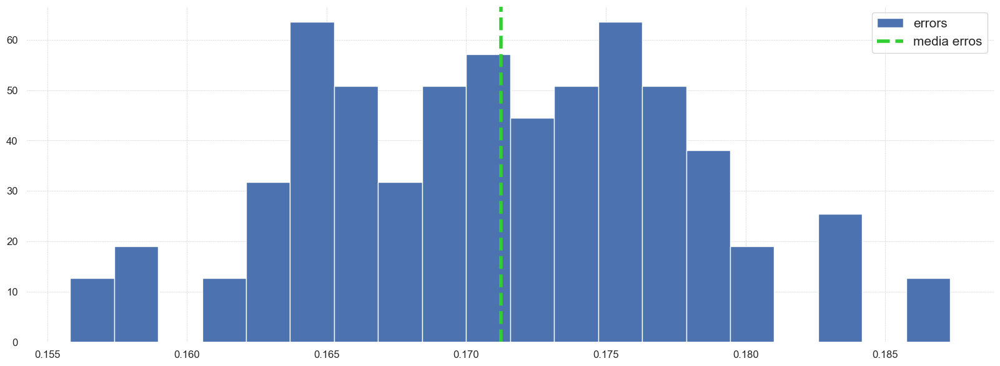

In [119]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['map']['errors'],
    nbins=20
)

In [120]:
def plot_2D_contours(
        u_vec,
        v_vec,
        z,
        max_us,
        max_vs,
        levels=50,
        u_lims=None,
        v_lims=None,
        save_dir=None,
        save_name=None,
        label_size=30,
        tick_size=30,
    ):

        print('-'*100)
        print('Normalized log-posterior (average)')
        print('-'*100)
        
        
        # if u_lims is not None:
        #     u_vec = [u for u in u_vec if (u>=u_lims[0] and u<=u_lims[-1])]
        # if v_lims is not None:
        #     v_vec = [v for v in v_vec if (v>=v_lims[0] and v<=v_lims[-1])]

        fig = plt.figure(figsize=(20,7))

        U, V = np.meshgrid(u_vec, v_vec)
        
        plt.contour(
            U,
            V,
            z.T,
            levels=levels,
            cmap='copper',
            label='curva media'
        )
        
        plt.scatter(
            max_us,
            max_vs,
            marker='X',
            color='red',
            label='pontos max'
        )
        
        plt.xlabel(
            'u',
            fontsize=label_size
        )
        plt.ylabel(
            'v',
            fontsize=label_size
        )
        if u_lims is not None:
            plt.xlim(u_lims)
        if v_lims is not None:
            plt.ylim(v_lims)

        plt.xticks(
            fontsize=tick_size
        )
        plt.yticks(
            fontsize=tick_size
        )
        # plt.legend(
        #     loc='upper right',
        #     fontsize=15
        # )

        # Save figure, if so specified
        if save_dir is not None:
            fig.savefig(
                str(
                    (save_dir / '{}.png'.format(save_name if save_name is not None else 'contour'))
                ),
                bbox_inches='tight'
            )

        # if save_dir is not None:
        #     fig.savefig(
        #         str(
        #             (save_dir / 'contour_lines.png')
        #         )
        #     )
        
        # if save_dir is not None:
        #     fig.savefig(
        #         str(
        #             (save_dir / 'steady_state_marginal_distributions.png')

## ix.

In [121]:
test_case='ix'

### Posterior contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (average)
----------------------------------------------------------------------------------------------------


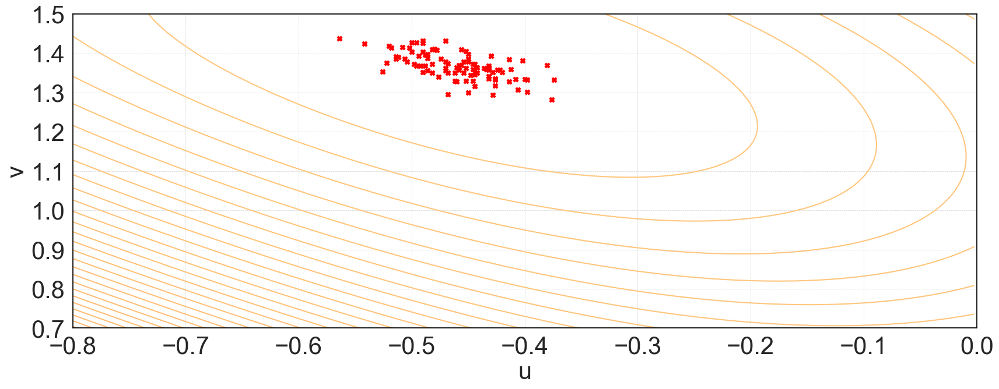

In [122]:
EstimationGraphPlotter.plot_2D_contours(
    u_vec=parser.parsed_results[test_case]['posteriori_grid']['u_vec'],
    v_vec=parser.parsed_results[test_case]['posteriori_grid']['v_vec'],
    z=parser.parsed_results[test_case]['posteriori_grid']['average_grid'],
    max_us=parser.parsed_results[test_case]['posteriori_grid']['u_max'],
    max_vs=parser.parsed_results[test_case]['posteriori_grid']['v_max'],
    N=parser.execution_config['general']['n_obs'],
    posterior_step=CONTOUR_POSTERIOR_STEP,
    u_lims=(-0.8, 0.0),
    v_lims=(0.7, 1.5),
    save_dir=posterior_contour_dir,
    save_name='{}_curva_nivel'.format(test_case)
)

### MMSE estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


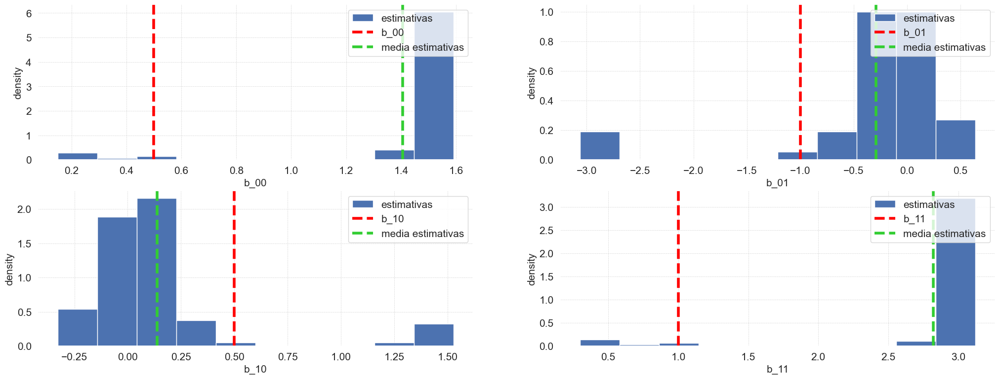

In [123]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['mmse']['b11_estimates'],
        parser.parsed_results[test_case]['mmse']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['mmse']['b21_estimates'],
        parser.parsed_results[test_case]['mmse']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MMSE estimation errors

####################################################################################################
Mean error: 1.54
Max error: 1.82
Min error: 1.23
####################################################################################################


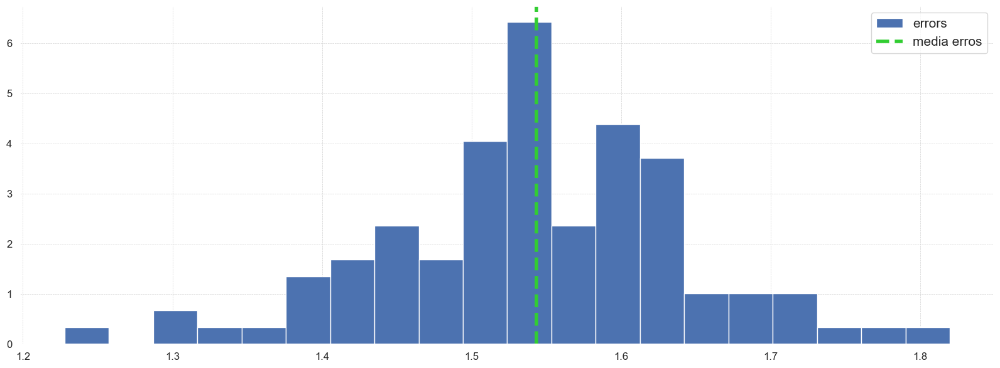

In [124]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['mmse']['errors'],
    nbins=20
)

### MAP estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


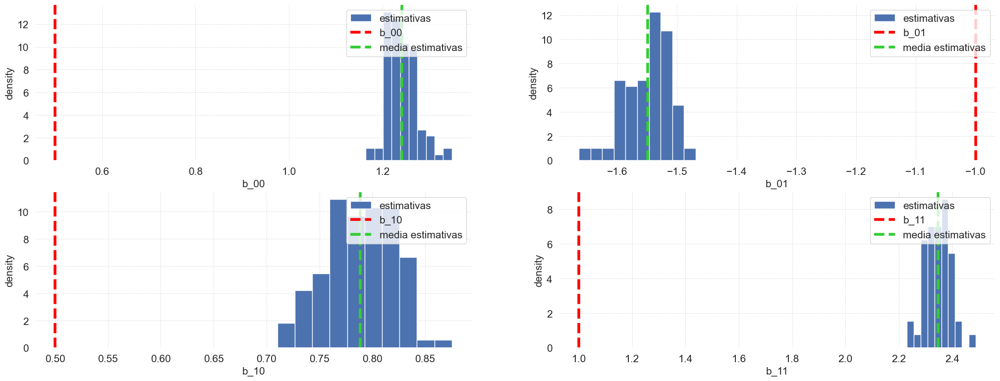

In [125]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['map']['b11_estimates'],
        parser.parsed_results[test_case]['map']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['map']['b21_estimates'],
        parser.parsed_results[test_case]['map']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MAP estimation errors

####################################################################################################
Mean error: 1.05
Max error: 1.14
Min error: 0.98
####################################################################################################


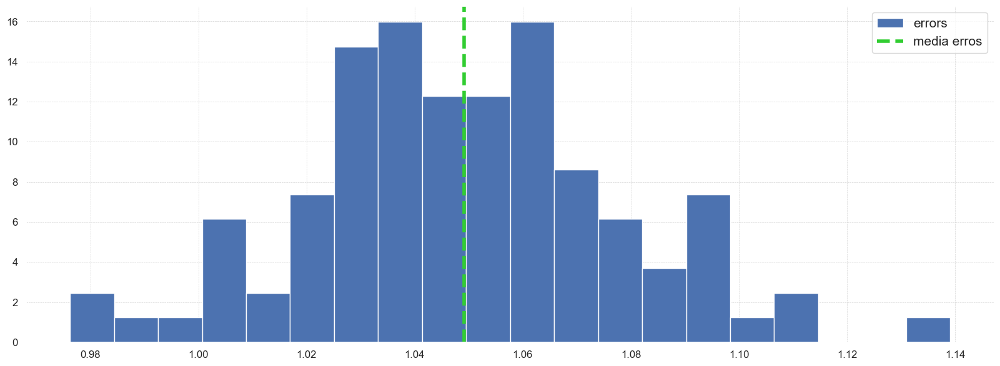

In [126]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['map']['errors'],
    nbins=20
)

## x.

In [127]:
test_case='x'

### Posterior contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (average)
----------------------------------------------------------------------------------------------------


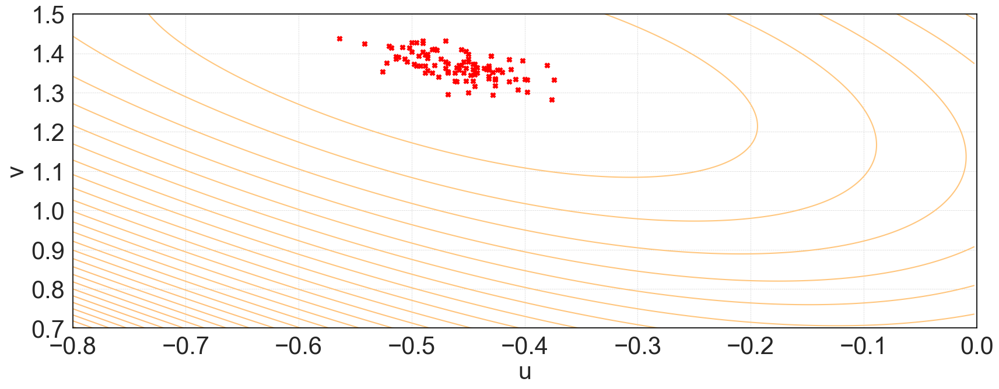

In [128]:
EstimationGraphPlotter.plot_2D_contours(
    u_vec=parser.parsed_results[test_case]['posteriori_grid']['u_vec'],
    v_vec=parser.parsed_results[test_case]['posteriori_grid']['v_vec'],
    z=parser.parsed_results[test_case]['posteriori_grid']['average_grid'],
    max_us=parser.parsed_results[test_case]['posteriori_grid']['u_max'],
    max_vs=parser.parsed_results[test_case]['posteriori_grid']['v_max'],
    N=parser.execution_config['general']['n_obs'],
    posterior_step=CONTOUR_POSTERIOR_STEP,
    u_lims=(-0.8, 0.0),
    v_lims=(0.7, 1.5),
    save_dir=posterior_contour_dir,
    save_name='{}_curva_nivel'.format(test_case)
)

### MMSE estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


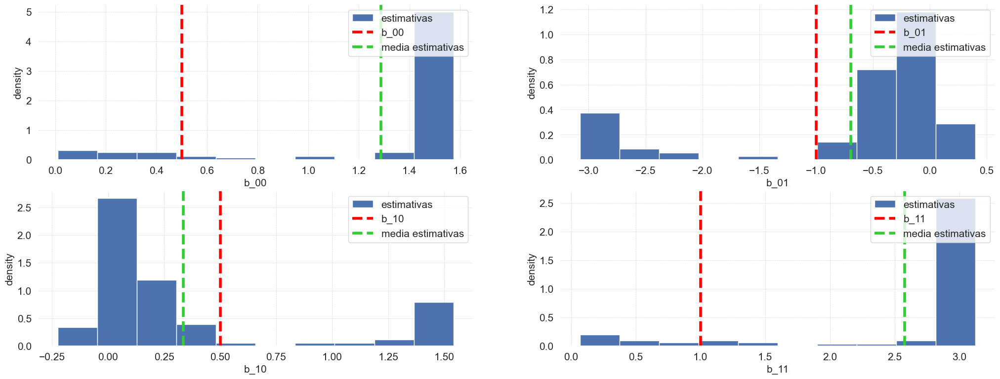

In [129]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['mmse']['b11_estimates'],
        parser.parsed_results[test_case]['mmse']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['mmse']['b21_estimates'],
        parser.parsed_results[test_case]['mmse']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MMSE estimation errors

####################################################################################################
Mean error: 1.48
Max error: 1.7
Min error: 1.07
####################################################################################################


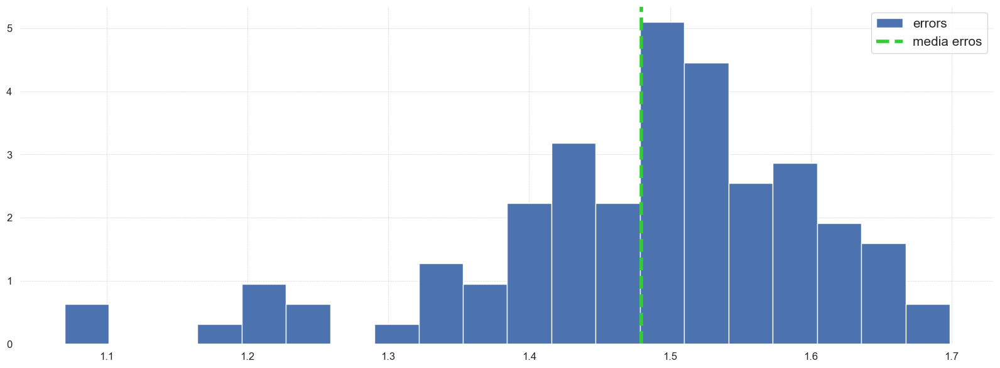

In [130]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['mmse']['errors'],
    nbins=20
)

### MAP estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


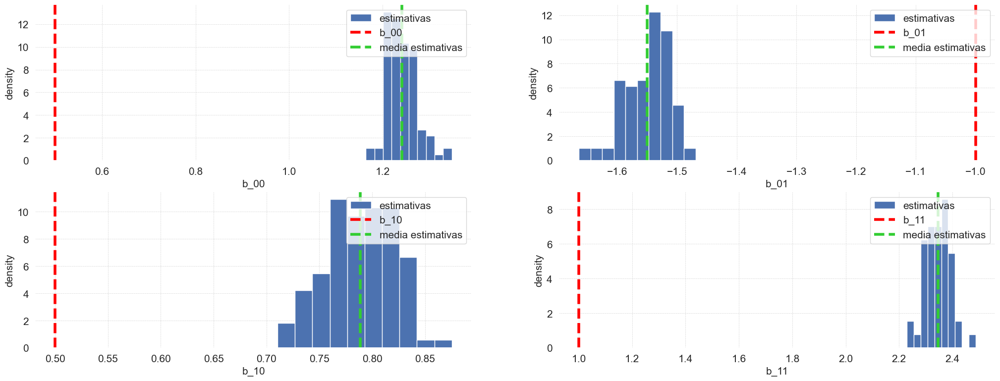

In [131]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['map']['b11_estimates'],
        parser.parsed_results[test_case]['map']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['map']['b21_estimates'],
        parser.parsed_results[test_case]['map']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MAP estimation errors

####################################################################################################
Mean error: 1.05
Max error: 1.14
Min error: 0.98
####################################################################################################


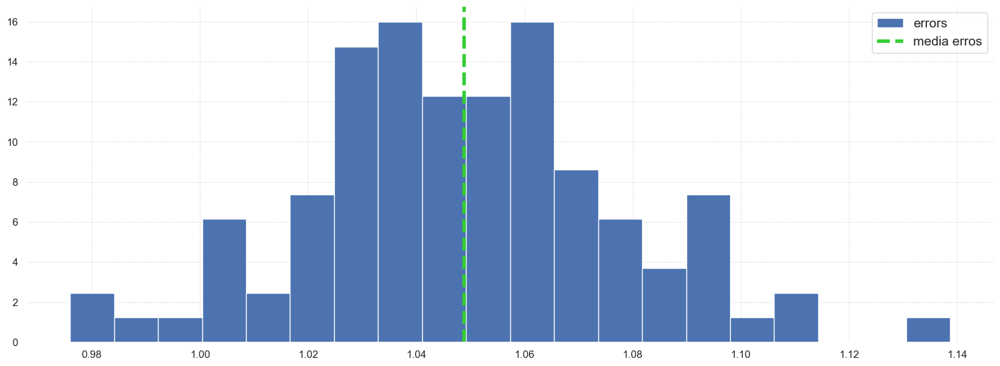

In [132]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['map']['errors'],
    nbins=20
)

## xi.

In [133]:
test_case='xi'

### Posterior contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (average)
----------------------------------------------------------------------------------------------------


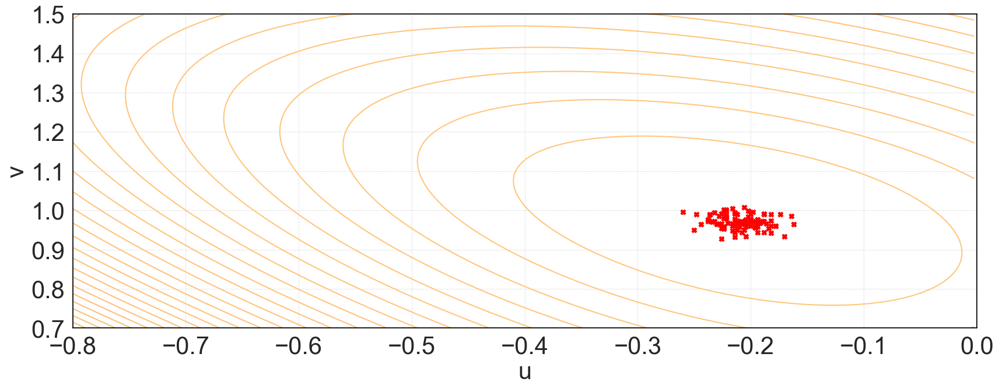

In [134]:
EstimationGraphPlotter.plot_2D_contours(
    u_vec=parser.parsed_results[test_case]['posteriori_grid']['u_vec'],
    v_vec=parser.parsed_results[test_case]['posteriori_grid']['v_vec'],
    z=parser.parsed_results[test_case]['posteriori_grid']['average_grid'],
    max_us=parser.parsed_results[test_case]['posteriori_grid']['u_max'],
    max_vs=parser.parsed_results[test_case]['posteriori_grid']['v_max'],
    N=parser.execution_config['general']['n_obs'],
    posterior_step=CONTOUR_POSTERIOR_STEP,
    u_lims=(-0.8, 0.0),
    v_lims=(0.7, 1.5),
    save_dir=posterior_contour_dir,
    save_name='{}_curva_nivel'.format(test_case)
)

### MMSE estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


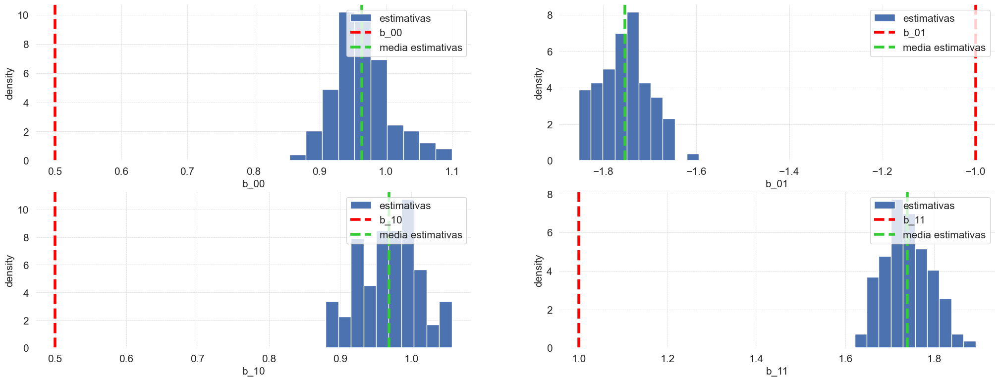

In [135]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['mmse']['b11_estimates'],
        parser.parsed_results[test_case]['mmse']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['mmse']['b21_estimates'],
        parser.parsed_results[test_case]['mmse']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MMSE estimation errors

####################################################################################################
Mean error: 0.79
Max error: 0.84
Min error: 0.75
####################################################################################################


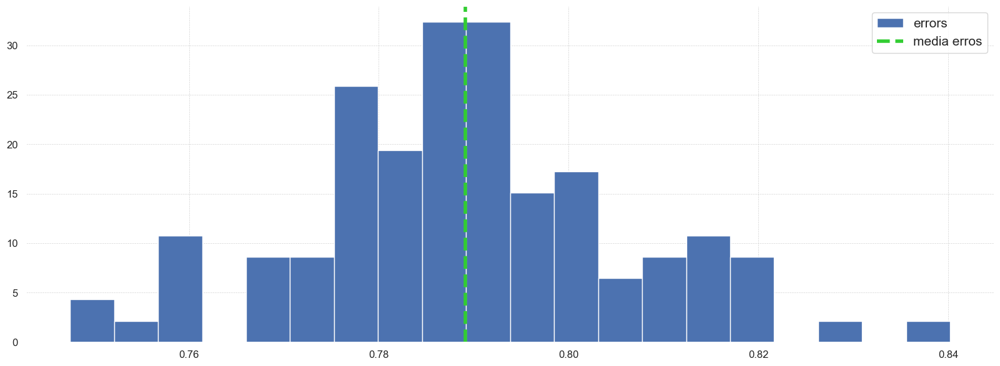

In [136]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['mmse']['errors'],
    nbins=20
)

### MAP estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


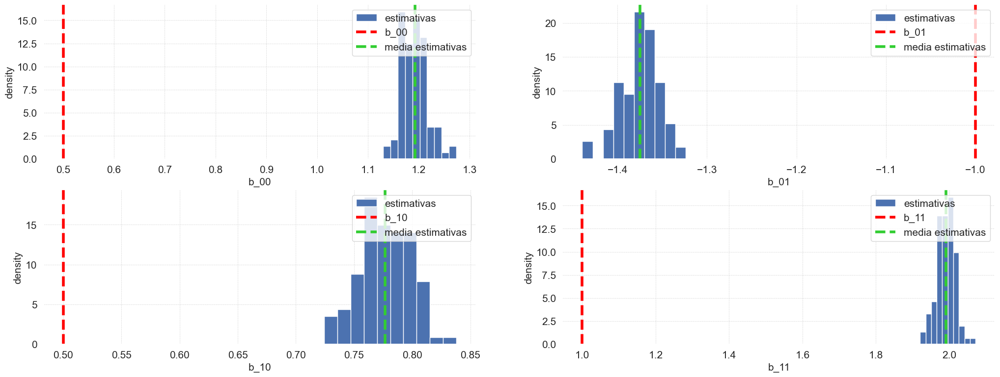

In [137]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['map']['b11_estimates'],
        parser.parsed_results[test_case]['map']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['map']['b21_estimates'],
        parser.parsed_results[test_case]['map']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MAP estimation errors

####################################################################################################
Mean error: 0.82
Max error: 0.86
Min error: 0.78
####################################################################################################


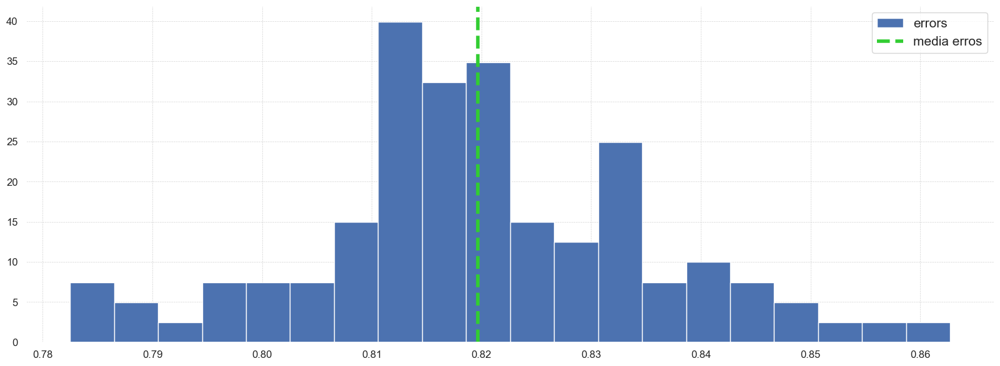

In [138]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['map']['errors'],
    nbins=20
)

## xii.

In [139]:
test_case='xii'

### Posterior contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (average)
----------------------------------------------------------------------------------------------------


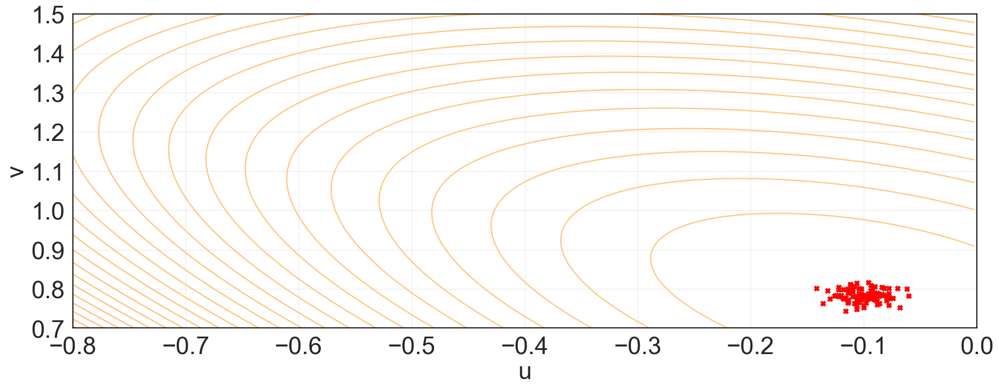

In [140]:
EstimationGraphPlotter.plot_2D_contours(
    u_vec=parser.parsed_results[test_case]['posteriori_grid']['u_vec'],
    v_vec=parser.parsed_results[test_case]['posteriori_grid']['v_vec'],
    z=parser.parsed_results[test_case]['posteriori_grid']['average_grid'],
    max_us=parser.parsed_results[test_case]['posteriori_grid']['u_max'],
    max_vs=parser.parsed_results[test_case]['posteriori_grid']['v_max'],
    N=parser.execution_config['general']['n_obs'],
    posterior_step=CONTOUR_POSTERIOR_STEP,
    u_lims=(-0.8, 0.0),
    v_lims=(0.7, 1.5),
    save_dir=posterior_contour_dir,
    save_name='{}_curva_nivel'.format(test_case)
)

### MMSE estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


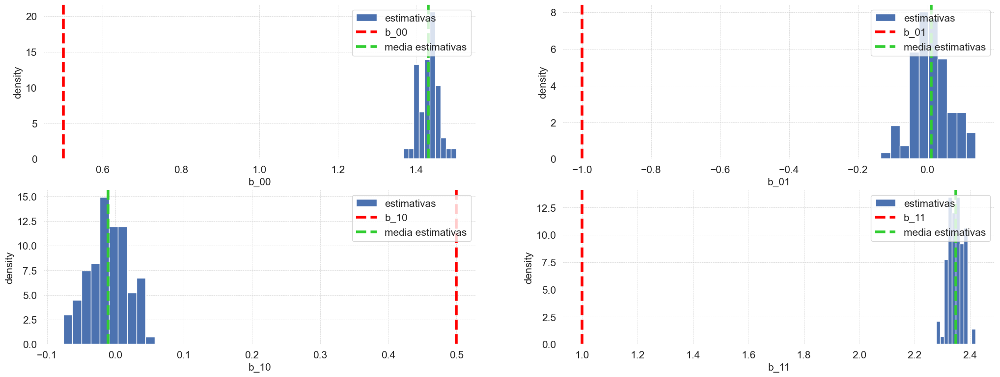

In [141]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['mmse']['b11_estimates'],
        parser.parsed_results[test_case]['mmse']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['mmse']['b21_estimates'],
        parser.parsed_results[test_case]['mmse']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MMSE estimation errors

####################################################################################################
Mean error: 1.26
Max error: 1.33
Min error: 1.21
####################################################################################################


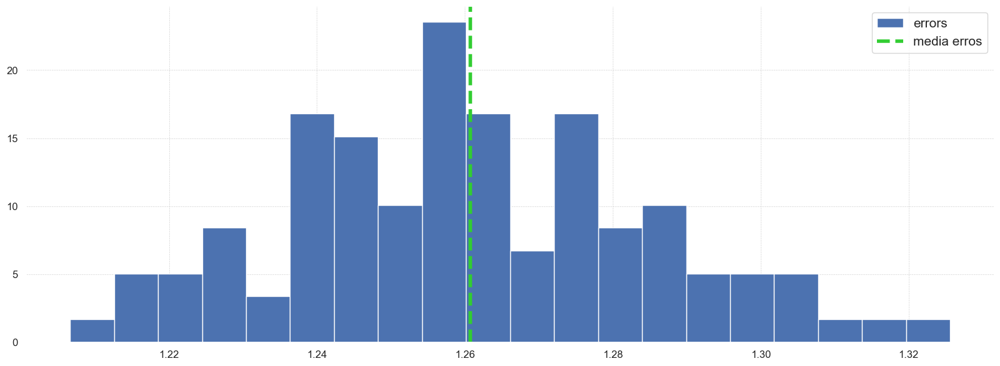

In [142]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['mmse']['errors'],
    nbins=20
)

### MAP estimations

----------------------------------------------------------------------------------------------------
(a) B11
(b) B12
(c) B21
(d) B22
----------------------------------------------------------------------------------------------------


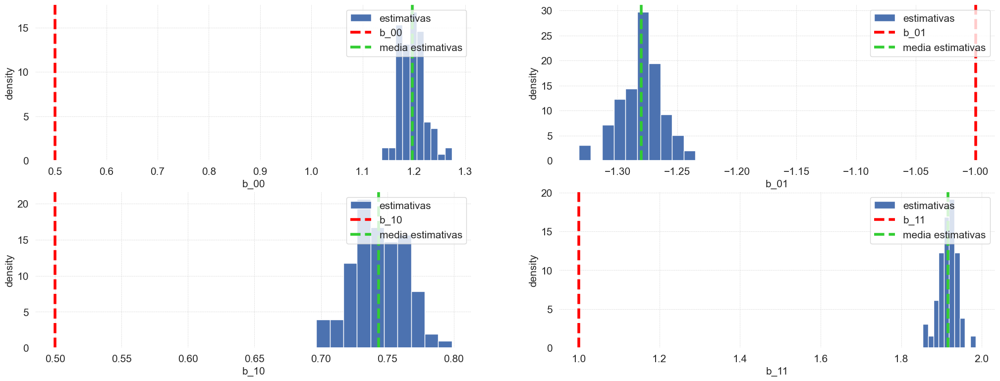

In [143]:
# Get estimates as square matrix
estimates = np.array([
    [
        parser.parsed_results[test_case]['map']['b11_estimates'],
        parser.parsed_results[test_case]['map']['b12_estimates']
    ],
    [
        parser.parsed_results[test_case]['map']['b21_estimates'],
        parser.parsed_results[test_case]['map']['b22_estimates']
    ]
])

# Plot
EstimationGraphPlotter.estimation_distributions(
    B_true=parser.execution_config['general']['B'],
    estimates=estimates,
    nbins=10,
    save_dir=None,
    ylims=None,
    xlims=None,
    label_size=15,
    tick_size=15,
    legend_size=15,
    plot_estimate=True,
    plot_true_value=True
)

### MAP estimation errors

####################################################################################################
Mean error: 0.77
Max error: 0.8
Min error: 0.73
####################################################################################################


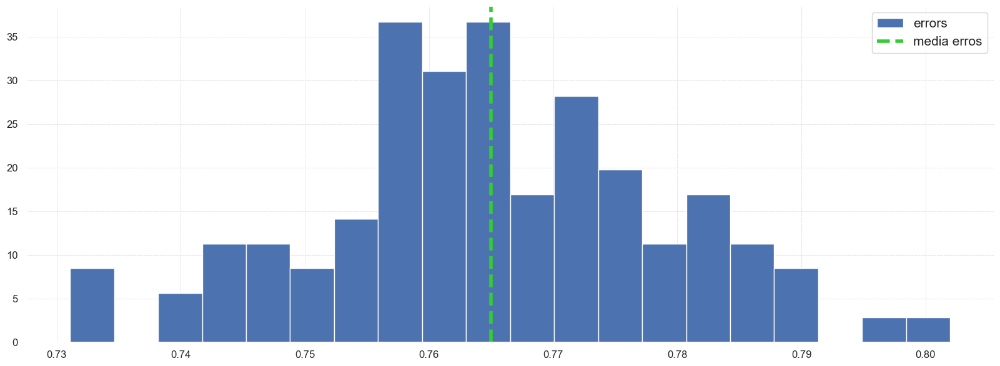

In [144]:
EstimationGraphPlotter.plot_estimation_errors(
    errors=parser.parsed_results[test_case]['map']['errors'],
    nbins=20
)